#**รวมทุกอันที่นำไปใช้งานใน Slide เข้าด้วยกัน**

In [ ]:
!pip install openai==0.28

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import re
from bs4 import BeautifulSoup
import json
import warnings
import random

#1. Clean Data

Import and explore the data part

In [ ]:
df = pd.read_csv("/content/big_query_data.csv")
df

,title,post_body,owner_username,tags,view_count,favourite_count,post_score,creation_date,last_activity_date,answer_count,...,answer_score,answer_favorite_count,answer_comment_count,answer_create_date,answer_last_activity,answer_owner_username,comment_body,comment_score,comment_create_date,comment_owner_username
0,"""Tried to send a platform message to Flutter, ...",<p>I'm trying to build an app that uses some p...,Marcelo Pinheiro Montanher,android|flutter|dart|service|background,10742,4.0,31,2020-05-21 12:49:04.973000 UTC,2022-07-12 09:04:39.810000 UTC,5,...,0.0,NaN,0.0,2020-11-25 07:02:49.520000 UTC,2020-11-25 07:02:49.520000 UTC,Ali ÜSTÜNEL,NaN,NaN,NaN,NaN
1,"""Tried to send a platform message to Flutter, ...",<p>I'm trying to build an app that uses some p...,Marcelo Pinheiro Montanher,android|flutter|dart|service|background,10742,4.0,31,2020-05-21 12:49:04.973000 UTC,2022-07-12 09:04:39.810000 UTC,5,...,0.0,NaN,0.0,2020-12-03 10:31:31.130000 UTC,2020-12-03 10:31:31.130000 UTC,JRJR,NaN,NaN,NaN,NaN
2,"""Tried to send a platform message to Flutter, ...",<p>I'm trying to build an app that uses some p...,Marcelo Pinheiro Montanher,android|flutter|dart|service|background,10742,4.0,31,2020-05-21 12:49:04.973000 UTC,2022-07-12 09:04:39.810000 UTC,5,...,1.0,NaN,0.0,2021-05-27 12:00:30.450000 UTC,2021-05-27 12:00:30.450000 UTC,junaidh haneef,NaN,NaN,NaN,NaN
3,"""Tried to send a platform message to Flutter, ...",<p>I'm trying to build an app that uses some p...,Marcelo Pinheiro Montanher,android|flutter|dart|service|background,10742,4.0,31,2020-05-21 12:49:04.973000 UTC,2022-07-12 09:04:39.810000 UTC,5,...,2.0,NaN,0.0,2021-11-11 21:35:59.530000 UTC,2022-07-12 09:04:39.810000 UTC,Ben Butterworth,NaN,NaN,NaN,NaN
4,"""Tried to send a platform message to Flutter, ...",<p>I'm trying to build an app that uses some p...,Marcelo Pinheiro Montanher,android|flutter|dart|service|background,10742,4.0,31,2020-05-21 12:49:04.973000 UTC,2022-07-12 09:04:39.810000 UTC,5,...,0.0,NaN,0.0,2020-11-25 07:06:29.253000 UTC,2020-11-25 07:06:29.253000 UTC,Ali ÜSTÜNEL,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3037,what is the battery drain for sending one http...,<p>I want to know how much of the battery is d...,Samyak Bhuta,iphone|ios|optimization|power-management,739,1.0,3,2011-12-06 08:50:50.083000 UTC,2012-06-07 17:05:25.203000 UTC,2,...,5.0,NaN,0.0,2011-12-06 09:08:22.503000 UTC,2011-12-06 09:08:22.503000 UTC,Claus Broch,NaN,NaN,NaN,NaN
3038,what is the battery drain for sending one http...,<p>I want to know how much of the battery is d...,Samyak Bhuta,iphone|ios|optimization|power-management,739,1.0,3,2011-12-06 08:50:50.083000 UTC,2012-06-07 17:05:25.203000 UTC,2,...,1.0,NaN,0.0,2011-12-06 09:09:17.837000 UTC,2011-12-06 09:09:17.837000 UTC,sosborn,NaN,NaN,NaN,NaN
3039,what technology used in mobile chat apps to re...,<p>I'm some kind of backend developer and don'...,rzlvmp,android|ios|chat|messaging,170,NaN,-2,2021-09-07 07:39:11.227000 UTC,2021-09-07 12:42:53.063000 UTC,1,...,1.0,NaN,0.0,2021-09-07 12:42:53.063000 UTC,2021-09-07 12:42:53.063000 UTC,Saifullah ilyas,NaN,NaN,NaN,NaN
3040,why android alarm receiver is not working,<p>I downloaded the scheduler example from and...,USKMobility,android,2712,NaN,2,2013-12-30 12:42:07.077000 UTC,2016-03-31 12:34:32.330000 UTC,2,...,0.0,NaN,0.0,2016-03-31 12:34:32.330000 UTC,2016-03-31 12:34:32.330000 UTC,iOSAndroidWindowsMobileAppsDev,NaN,NaN,NaN,NaN


In [ ]:
df.columns

Index(['title', 'post_body', 'owner_username', 'tags', 'view_count',
       'favourite_count', 'post_score', 'creation_date', 'last_activity_date',
       'answer_count', 'comment_count', 'accepted_answer', 'answer_id',
       'answer_body', 'answer_score', 'answer_favorite_count',
       'answer_comment_count', 'answer_create_date', 'answer_last_activity',
       'answer_owner_username', 'comment_body', 'comment_score',
       'comment_create_date', 'comment_owner_username'],
      dtype='object')

In [ ]:
df.dtypes

,0
title,object
post_body,object
owner_username,object
tags,object
view_count,int64
favourite_count,float64
post_score,int64
creation_date,object
last_activity_date,object
answer_count,int64


In [ ]:
nan_counts = df.isna().sum()
print(nan_counts)

title                        0
post_body                    0
owner_username               0
tags                         0
view_count                   0
favourite_count           1620
post_score                   0
creation_date                0
last_activity_date           0
answer_count                 0
comment_count                0
accepted_answer           1468
answer_id                  254
answer_body                254
answer_score               254
answer_favorite_count     3042
answer_comment_count       254
answer_create_date         254
answer_last_activity       254
answer_owner_username      254
comment_body              1062
comment_score             1062
comment_create_date       1062
comment_owner_username    1062
dtype: int64


In [ ]:
df['creation_date']

,creation_date
0,2020-05-21 12:49:04.973000 UTC
1,2020-05-21 12:49:04.973000 UTC
2,2020-05-21 12:49:04.973000 UTC
3,2020-05-21 12:49:04.973000 UTC
4,2020-05-21 12:49:04.973000 UTC
...,...
3037,2011-12-06 08:50:50.083000 UTC
3038,2011-12-06 08:50:50.083000 UTC
3039,2021-09-07 07:39:11.227000 UTC
3040,2013-12-30 12:42:07.077000 UTC


Data Cleaning part

In [ ]:
#จัดการข้อมูลที่มีค่าเป็น NA โดยวิธีการเติมค่า 0 และ None เข้าไป
#ที่ใชวิธีนี้เนื่องจากค่าถูกแถวสามารถนำไปใช้ประโยชน์ต่อได้หมดถึงแม้จะมีค่าว่างก็ตาม

df = df.fillna({
    "favourite_count": 0,
    "accepted_answer": "None",
    "answer_body": "None",
    "answer_score": 0,
    "answer_favorite_count" : 0,
    "answer_comment_count" : 0,
    "answer_create_date" : "None",
    "answer_owner_username" : "None",
    "comment_body" : "None",
    "comment_score" : 0,
    "comment_create_date" : "None",
    "comment_owner_username" : "None"
})

In [ ]:
#เปลี่ยน Type ของแต่ละ columns

df = df.astype({
    "title": str,
    "post_body": str,
    "owner_username": str,
    "tags": str,
    "view_count" : int,
    "favourite_count" : int,
    "post_score" : int,
    "answer_count" : int,
    "comment_count" : int,
    "accepted_answer" : str,
    "answer_body" : str,
    "answer_score" : int,
    "answer_favorite_count" : int,
    "answer_comment_count" : int,
    "answer_owner_username" : str,
    "comment_body" : str,
    "comment_score" : int,
    "comment_owner_username" : str,
})

In [ ]:
#แยก tags ออกจากกันเพื่อความง่ายต่อการนำไปวิเคราะห์ข้อมูล (เนื่องจากข้อมูลเก็บ tags ในรูปแบบ A|B|C|D|E)

# แยกค่าที่คั่นด้วย "|" ในคอลัมน์ "tags"
tags_split = df["tags"].str.split("|", expand=True)
# กำหนดชื่อคอลัมน์ใหม่ให้กับ DataFrame ที่แยกออกมา
tags_split.columns = [f"tag_{i+1}" for i in range(tags_split.shape[1])]
# รวม DataFrame ที่แยก Tags เข้ากับ DataFrame หลัก
df = pd.concat([df, tags_split], axis=1)
df

,title,post_body,owner_username,tags,view_count,favourite_count,post_score,creation_date,last_activity_date,answer_count,...,answer_owner_username,comment_body,comment_score,comment_create_date,comment_owner_username,tag_1,tag_2,tag_3,tag_4,tag_5
0,"""Tried to send a platform message to Flutter, ...",<p>I'm trying to build an app that uses some p...,Marcelo Pinheiro Montanher,android|flutter|dart|service|background,10742,4,31,2020-05-21 12:49:04.973000 UTC,2022-07-12 09:04:39.810000 UTC,5,...,Ali ÜSTÜNEL,None,0,None,None,android,flutter,dart,service,background
1,"""Tried to send a platform message to Flutter, ...",<p>I'm trying to build an app that uses some p...,Marcelo Pinheiro Montanher,android|flutter|dart|service|background,10742,4,31,2020-05-21 12:49:04.973000 UTC,2022-07-12 09:04:39.810000 UTC,5,...,JRJR,None,0,None,None,android,flutter,dart,service,background
2,"""Tried to send a platform message to Flutter, ...",<p>I'm trying to build an app that uses some p...,Marcelo Pinheiro Montanher,android|flutter|dart|service|background,10742,4,31,2020-05-21 12:49:04.973000 UTC,2022-07-12 09:04:39.810000 UTC,5,...,junaidh haneef,None,0,None,None,android,flutter,dart,service,background
3,"""Tried to send a platform message to Flutter, ...",<p>I'm trying to build an app that uses some p...,Marcelo Pinheiro Montanher,android|flutter|dart|service|background,10742,4,31,2020-05-21 12:49:04.973000 UTC,2022-07-12 09:04:39.810000 UTC,5,...,Ben Butterworth,None,0,None,None,android,flutter,dart,service,background
4,"""Tried to send a platform message to Flutter, ...",<p>I'm trying to build an app that uses some p...,Marcelo Pinheiro Montanher,android|flutter|dart|service|background,10742,4,31,2020-05-21 12:49:04.973000 UTC,2022-07-12 09:04:39.810000 UTC,5,...,Ali ÜSTÜNEL,None,0,None,None,android,flutter,dart,service,background
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3037,what is the battery drain for sending one http...,<p>I want to know how much of the battery is d...,Samyak Bhuta,iphone|ios|optimization|power-management,739,1,3,2011-12-06 08:50:50.083000 UTC,2012-06-07 17:05:25.203000 UTC,2,...,Claus Broch,None,0,None,None,iphone,ios,optimization,power-management,None
3038,what is the battery drain for sending one http...,<p>I want to know how much of the battery is d...,Samyak Bhuta,iphone|ios|optimization|power-management,739,1,3,2011-12-06 08:50:50.083000 UTC,2012-06-07 17:05:25.203000 UTC,2,...,sosborn,None,0,None,None,iphone,ios,optimization,power-management,None
3039,what technology used in mobile chat apps to re...,<p>I'm some kind of backend developer and don'...,rzlvmp,android|ios|chat|messaging,170,0,-2,2021-09-07 07:39:11.227000 UTC,2021-09-07 12:42:53.063000 UTC,1,...,Saifullah ilyas,None,0,None,None,android,ios,chat,messaging,None
3040,why android alarm receiver is not working,<p>I downloaded the scheduler example from and...,USKMobility,android,2712,0,2,2013-12-30 12:42:07.077000 UTC,2016-03-31 12:34:32.330000 UTC,2,...,iOSAndroidWindowsMobileAppsDev,None,0,None,None,android,None,None,None,None


In [ ]:
# เลือกเฉพาะแถวที่มี answer_body (ไม่ใช่ NaN หรือค่าว่าง)
df.loc[df["answer_body"].notna(), ["favourite_count", "answer_count", "answer_favorite_count"]] = \
    df.loc[df["answer_body"].notna(), ["favourite_count", "answer_count", "answer_favorite_count"]].fillna(0)
df

,title,post_body,owner_username,tags,view_count,favourite_count,post_score,creation_date,last_activity_date,answer_count,...,answer_owner_username,comment_body,comment_score,comment_create_date,comment_owner_username,tag_1,tag_2,tag_3,tag_4,tag_5
0,"""Tried to send a platform message to Flutter, ...",<p>I'm trying to build an app that uses some p...,Marcelo Pinheiro Montanher,android|flutter|dart|service|background,10742,4,31,2020-05-21 12:49:04.973000 UTC,2022-07-12 09:04:39.810000 UTC,5,...,Ali ÜSTÜNEL,None,0,None,None,android,flutter,dart,service,background
1,"""Tried to send a platform message to Flutter, ...",<p>I'm trying to build an app that uses some p...,Marcelo Pinheiro Montanher,android|flutter|dart|service|background,10742,4,31,2020-05-21 12:49:04.973000 UTC,2022-07-12 09:04:39.810000 UTC,5,...,JRJR,None,0,None,None,android,flutter,dart,service,background
2,"""Tried to send a platform message to Flutter, ...",<p>I'm trying to build an app that uses some p...,Marcelo Pinheiro Montanher,android|flutter|dart|service|background,10742,4,31,2020-05-21 12:49:04.973000 UTC,2022-07-12 09:04:39.810000 UTC,5,...,junaidh haneef,None,0,None,None,android,flutter,dart,service,background
3,"""Tried to send a platform message to Flutter, ...",<p>I'm trying to build an app that uses some p...,Marcelo Pinheiro Montanher,android|flutter|dart|service|background,10742,4,31,2020-05-21 12:49:04.973000 UTC,2022-07-12 09:04:39.810000 UTC,5,...,Ben Butterworth,None,0,None,None,android,flutter,dart,service,background
4,"""Tried to send a platform message to Flutter, ...",<p>I'm trying to build an app that uses some p...,Marcelo Pinheiro Montanher,android|flutter|dart|service|background,10742,4,31,2020-05-21 12:49:04.973000 UTC,2022-07-12 09:04:39.810000 UTC,5,...,Ali ÜSTÜNEL,None,0,None,None,android,flutter,dart,service,background
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3037,what is the battery drain for sending one http...,<p>I want to know how much of the battery is d...,Samyak Bhuta,iphone|ios|optimization|power-management,739,1,3,2011-12-06 08:50:50.083000 UTC,2012-06-07 17:05:25.203000 UTC,2,...,Claus Broch,None,0,None,None,iphone,ios,optimization,power-management,None
3038,what is the battery drain for sending one http...,<p>I want to know how much of the battery is d...,Samyak Bhuta,iphone|ios|optimization|power-management,739,1,3,2011-12-06 08:50:50.083000 UTC,2012-06-07 17:05:25.203000 UTC,2,...,sosborn,None,0,None,None,iphone,ios,optimization,power-management,None
3039,what technology used in mobile chat apps to re...,<p>I'm some kind of backend developer and don'...,rzlvmp,android|ios|chat|messaging,170,0,-2,2021-09-07 07:39:11.227000 UTC,2021-09-07 12:42:53.063000 UTC,1,...,Saifullah ilyas,None,0,None,None,android,ios,chat,messaging,None
3040,why android alarm receiver is not working,<p>I downloaded the scheduler example from and...,USKMobility,android,2712,0,2,2013-12-30 12:42:07.077000 UTC,2016-03-31 12:34:32.330000 UTC,2,...,iOSAndroidWindowsMobileAppsDev,None,0,None,None,android,None,None,None,None


In [ ]:
df.dtypes

,0
title,object
post_body,object
owner_username,object
tags,object
view_count,int64
favourite_count,int64
post_score,int64
creation_date,object
last_activity_date,object
answer_count,int64


In [ ]:
#แยก วัน เดือน ปี และเวลา ออกจากกัน

# แปลงคอลัมน์ที่เกี่ยวข้องเป็นประเภท datetime
df["creation_date"] = pd.to_datetime(df["creation_date"].fillna(0), errors="coerce")
df["last_activity_date"] = pd.to_datetime(df["last_activity_date"].fillna(0), errors="coerce")
df["answer_create_date"] = pd.to_datetime(df["answer_create_date"].fillna(0), errors="coerce")
df["answer_last_activity"] = pd.to_datetime(df["answer_last_activity"].fillna(0), errors="coerce")
df["comment_create_date"] = pd.to_datetime(df["comment_create_date"].fillna(0), errors="coerce")

# for col in ["creation_date", "last_activity_date", "answer_create_date", 'answer_last_activity', "comment_create_date"]:
#     df[col] = df[col].dt.tz_convert(None).dt.strftime('%Y-%m-%d %H:%M:%S')

# ตรวจสอบว่าเป็น timezone-aware หรือไม่ แล้วทำการ tz_localize ถ้ายังไม่เป็น
for col in ["creation_date", "last_activity_date", "answer_create_date", "comment_create_date"]:
    if df[col].dt.tz is None:  # หากคอลัมน์ไม่เป็น timezone-aware
        df[col] = df[col].dt.tz_localize('UTC', ambiguous='NaT')

# แยกเป็น Day, Month, Year, และ Time สำหรับแต่ละคอลัมน์ และแปลงเป็น int
for col in ["creation_date", "last_activity_date", "answer_create_date", "comment_create_date"]:
    # แก้ไขการแปลง NaT เป็นค่าเฉพาะ เช่น 0 หรือค่าที่เหมาะสม
    df[f"{col}_day"] = df[col].dt.day.fillna(0).astype(int)  # แปลงเป็น int และกรอกค่าที่เป็น NaT เป็น 0
    df[f"{col}_month"] = df[col].dt.month.fillna(0).astype(int)  # แปลงเป็น int
    df[f"{col}_year"] = df[col].dt.year.fillna(0).astype(int)  # แปลงเป็น int
    df[f"{col}_time"] = df[col].dt.strftime('%H:%M:%S').fillna(0)  # แยกเวลาเป็น Hour:Minute:Second

for col in ["creation_date", "last_activity_date", "answer_create_date", 'answer_last_activity', "comment_create_date"]:
    df[col] = df[col].dt.tz_convert(None).dt.strftime('%Y-%m-%d %H:%M:%S')
df

<ipython-input-17-aa438784784b>:8: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df["comment_create_date"] = pd.to_datetime(df["comment_create_date"].fillna(0), errors="coerce")


,title,post_body,owner_username,tags,view_count,favourite_count,post_score,creation_date,last_activity_date,answer_count,...,last_activity_date_year,last_activity_date_time,answer_create_date_day,answer_create_date_month,answer_create_date_year,answer_create_date_time,comment_create_date_day,comment_create_date_month,comment_create_date_year,comment_create_date_time
0,"""Tried to send a platform message to Flutter, ...",<p>I'm trying to build an app that uses some p...,Marcelo Pinheiro Montanher,android|flutter|dart|service|background,10742,4,31,2020-05-21 12:49:04,2022-07-12 09:04:39,5,...,2022,09:04:39,25,11,2020,07:02:49,0,0,0,0
1,"""Tried to send a platform message to Flutter, ...",<p>I'm trying to build an app that uses some p...,Marcelo Pinheiro Montanher,android|flutter|dart|service|background,10742,4,31,2020-05-21 12:49:04,2022-07-12 09:04:39,5,...,2022,09:04:39,3,12,2020,10:31:31,0,0,0,0
2,"""Tried to send a platform message to Flutter, ...",<p>I'm trying to build an app that uses some p...,Marcelo Pinheiro Montanher,android|flutter|dart|service|background,10742,4,31,2020-05-21 12:49:04,2022-07-12 09:04:39,5,...,2022,09:04:39,27,5,2021,12:00:30,0,0,0,0
3,"""Tried to send a platform message to Flutter, ...",<p>I'm trying to build an app that uses some p...,Marcelo Pinheiro Montanher,android|flutter|dart|service|background,10742,4,31,2020-05-21 12:49:04,2022-07-12 09:04:39,5,...,2022,09:04:39,11,11,2021,21:35:59,0,0,0,0
4,"""Tried to send a platform message to Flutter, ...",<p>I'm trying to build an app that uses some p...,Marcelo Pinheiro Montanher,android|flutter|dart|service|background,10742,4,31,2020-05-21 12:49:04,2022-07-12 09:04:39,5,...,2022,09:04:39,25,11,2020,07:06:29,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3037,what is the battery drain for sending one http...,<p>I want to know how much of the battery is d...,Samyak Bhuta,iphone|ios|optimization|power-management,739,1,3,2011-12-06 08:50:50,2012-06-07 17:05:25,2,...,2012,17:05:25,6,12,2011,09:08:22,0,0,0,0
3038,what is the battery drain for sending one http...,<p>I want to know how much of the battery is d...,Samyak Bhuta,iphone|ios|optimization|power-management,739,1,3,2011-12-06 08:50:50,2012-06-07 17:05:25,2,...,2012,17:05:25,6,12,2011,09:09:17,0,0,0,0
3039,what technology used in mobile chat apps to re...,<p>I'm some kind of backend developer and don'...,rzlvmp,android|ios|chat|messaging,170,0,-2,2021-09-07 07:39:11,2021-09-07 12:42:53,1,...,2021,12:42:53,7,9,2021,12:42:53,0,0,0,0
3040,why android alarm receiver is not working,<p>I downloaded the scheduler example from and...,USKMobility,android,2712,0,2,2013-12-30 12:42:07,2016-03-31 12:34:32,2,...,2016,12:34:32,31,3,2016,12:34:32,0,0,0,0


In [ ]:
df[['answer_create_date','answer_last_activity','creation_date','last_activity_date']]

,answer_create_date,answer_last_activity,creation_date,last_activity_date
0,2020-11-25 07:02:49,2020-11-25 07:02:49,2020-05-21 12:49:04,2022-07-12 09:04:39
1,2020-12-03 10:31:31,2020-12-03 10:31:31,2020-05-21 12:49:04,2022-07-12 09:04:39
2,2021-05-27 12:00:30,2021-05-27 12:00:30,2020-05-21 12:49:04,2022-07-12 09:04:39
3,2021-11-11 21:35:59,2022-07-12 09:04:39,2020-05-21 12:49:04,2022-07-12 09:04:39
4,2020-11-25 07:06:29,2020-11-25 07:06:29,2020-05-21 12:49:04,2022-07-12 09:04:39
...,...,...,...,...
3037,2011-12-06 09:08:22,2011-12-06 09:08:22,2011-12-06 08:50:50,2012-06-07 17:05:25
3038,2011-12-06 09:09:17,2011-12-06 09:09:17,2011-12-06 08:50:50,2012-06-07 17:05:25
3039,2021-09-07 12:42:53,2021-09-07 12:42:53,2021-09-07 07:39:11,2021-09-07 12:42:53
3040,2016-03-31 12:34:32,2016-03-31 12:34:32,2013-12-30 12:42:07,2016-03-31 12:34:32


In [ ]:
# ฟังก์ชั่นลบ html และ โค้ดออกจาก text

def clean_html_and_code(text):
    # Step 1: ลบโค้ดทั้งหมดรวมถึงข้อความภายในโค้ด
    cleaned_text = re.sub(r"<code.*?>.*?</code>", "", text, flags=re.DOTALL)  # ลบโค้ดในแท็ก <code>
    cleaned_text = re.sub(r"```.*?```", "", cleaned_text, flags=re.DOTALL)  # ลบโค้ดที่ใช้ ``` ในข้อความ

    # Step 2: ใช้ BeautifulSoup ลบแท็ก HTML
    soup = BeautifulSoup(cleaned_text, "html.parser")
    cleaned_text = soup.get_text()

    # Step 3: ลบสัญลักษณ์พิเศษ HTML เช่น &amp;, &lt; เป็นต้น
    cleaned_text = re.sub(r"&[a-z]+;", "", cleaned_text)

    cleaned_text = re.sub(r"\d+", "", cleaned_text)  # ลบตัวเลขทั้งหมด

    # Step 4: ลบสัญลักษณ์ที่ไม่จำเป็น (เช่น เครื่องหมายพิเศษ)
    cleaned_text = re.sub(r"[^a-zA-Z0-9\s]", "", cleaned_text)

    # Step 5: ลบช่องว่างที่เกินมา
    cleaned_text = re.sub(r"\s+", " ", cleaned_text)

    # # Step 6: ลบ common words หรือ stop words ที่ไม่มีความหมาย
    # words = cleaned_text.split()  # แยกคำออกจากกัน
    # filtered_words = [word for word in words if word.lower() not in ENGLISH_STOP_WORDS]
    # cleaned_text = " ".join(filtered_words)  # รวมคำที่เหลือกลับมาเป็นข้อความ

    # Step 7: คืนค่าข้อความที่สะอาดขึ้น
    return cleaned_text.strip()

In [ ]:
df['post_body'] = df['post_body'].apply(lambda x: clean_html_and_code(x))
df

,title,post_body,owner_username,tags,view_count,favourite_count,post_score,creation_date,last_activity_date,answer_count,...,last_activity_date_year,last_activity_date_time,answer_create_date_day,answer_create_date_month,answer_create_date_year,answer_create_date_time,comment_create_date_day,comment_create_date_month,comment_create_date_year,comment_create_date_time
0,"""Tried to send a platform message to Flutter, ...",Im trying to build an app that uses some packa...,Marcelo Pinheiro Montanher,android|flutter|dart|service|background,10742,4,31,2020-05-21 12:49:04,2022-07-12 09:04:39,5,...,2022,09:04:39,25,11,2020,07:02:49,0,0,0,0
1,"""Tried to send a platform message to Flutter, ...",Im trying to build an app that uses some packa...,Marcelo Pinheiro Montanher,android|flutter|dart|service|background,10742,4,31,2020-05-21 12:49:04,2022-07-12 09:04:39,5,...,2022,09:04:39,3,12,2020,10:31:31,0,0,0,0
2,"""Tried to send a platform message to Flutter, ...",Im trying to build an app that uses some packa...,Marcelo Pinheiro Montanher,android|flutter|dart|service|background,10742,4,31,2020-05-21 12:49:04,2022-07-12 09:04:39,5,...,2022,09:04:39,27,5,2021,12:00:30,0,0,0,0
3,"""Tried to send a platform message to Flutter, ...",Im trying to build an app that uses some packa...,Marcelo Pinheiro Montanher,android|flutter|dart|service|background,10742,4,31,2020-05-21 12:49:04,2022-07-12 09:04:39,5,...,2022,09:04:39,11,11,2021,21:35:59,0,0,0,0
4,"""Tried to send a platform message to Flutter, ...",Im trying to build an app that uses some packa...,Marcelo Pinheiro Montanher,android|flutter|dart|service|background,10742,4,31,2020-05-21 12:49:04,2022-07-12 09:04:39,5,...,2022,09:04:39,25,11,2020,07:06:29,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3037,what is the battery drain for sending one http...,I want to know how much of the battery is drai...,Samyak Bhuta,iphone|ios|optimization|power-management,739,1,3,2011-12-06 08:50:50,2012-06-07 17:05:25,2,...,2012,17:05:25,6,12,2011,09:08:22,0,0,0,0
3038,what is the battery drain for sending one http...,I want to know how much of the battery is drai...,Samyak Bhuta,iphone|ios|optimization|power-management,739,1,3,2011-12-06 08:50:50,2012-06-07 17:05:25,2,...,2012,17:05:25,6,12,2011,09:09:17,0,0,0,0
3039,what technology used in mobile chat apps to re...,Im some kind of backend developer and dont kno...,rzlvmp,android|ios|chat|messaging,170,0,-2,2021-09-07 07:39:11,2021-09-07 12:42:53,1,...,2021,12:42:53,7,9,2021,12:42:53,0,0,0,0
3040,why android alarm receiver is not working,I downloaded the scheduler example from androi...,USKMobility,android,2712,0,2,2013-12-30 12:42:07,2016-03-31 12:34:32,2,...,2016,12:34:32,31,3,2016,12:34:32,0,0,0,0


Export data to csv

In [ ]:
# df.to_csv('cleaned_data.csv', index=False)

#2. OpenAI

In [ ]:
import os
# import PyPDF2
import nltk
from nltk.util import ngrams
from nltk.tokenize import word_tokenize
from wordcloud import WordCloud
import pandas as pd

In [ ]:
# import openai
# import pandas as pd

# def is_post_discussing_an_issue(text):
#     """Check if a Stack Overflow post is discussing a problem (returns 'yes' or 'no')."""

#     messages = [
#         {"role": "system", "content": "You are a helpful assistant that checks whether a Stack Overflow post is discussing a problem or not."},
#         {"role": "user", "content": f"Is the following post discussing a problem?\n\n{text}\n\nRespond only with 'yes' or 'no'."}
#     ]

#     try:
#         response = openai.ChatCompletion.create(
#             model="gpt-4o",
#             messages=messages,
#             max_tokens=5,  # Limit token usage to reduce costs
#             temperature=0  # Set to 0 for consistent results
#         )

#         result = response['choices'][0]['message']['content'].strip().lower()

#         return 'yes' if result == 'yes' else 'no'  # Ensure consistent output

#     except Exception as e:
#         print(f"Error: {e}")
#         return 'no'  # Default to 'no' on errors

# # Apply function to 'body' column
# df['issue_discussion'] = df['body'].apply(is_post_discussing_an_issue)

# # Display results
# print(df[['title', 'issue_discussion']])


In [ ]:
# df = df[df['issue_discussion'] == 'yes'].reset_index(drop=True)

Export data to csv

In [ ]:
# df.to_csv('output_issue_or_not.csv', index=False)

ใช้ข้อมูลที่เคยเอาเข้า gpt แล้วเก็บเป็นไฟล์ csv ไว้แล้ว

In [ ]:
# ข้อมูลที่เคยเอาเข้า GPT แล้วเก็บเป็น csv ไว้
df_issue = pd.read_csv('/content/output_issue_or_not.csv')
df_issue

,title,body,tags,user_id,username,discussing_issue
0,Python - Lists checking if something has been ...,"<p>Okay, so I am creating a program in python ...",python|list,5582341,Thom9son,yes
1,enabling foreground mode on NFC could cause dr...,<p>Quoting Carl Sagan:</p>\n\n<blockquote>\n ...,android|nfc,1348187,Rafael Ruiz Muñoz,no
2,Android CPU awake and Battery Depletion due to...,<p>I am working on an Sensors App that needs t...,android|service|android-volley|android-sensors...,4259011,Theodore Samuel,yes
3,Stop endless buffering of html5 video in cordo...,<p>I am building a cross-platform mobile app u...,android|cordova|android-webview|html5-video|co...,3289788,Waino,yes
4,low level bluetooth broadcast,"<p>Since bluetooth is a broadcast protocol, is...",android|bluetooth|low-level|at-command,582004,liucheia,no
...,...,...,...,...,...,...
1204,Stop Android Service after some time?,<p>I have a background service in my app whic...,android|service,3013161,Slim C.,yes
1205,startService restart my service if currently r...,"<p>in my service, I download a lot of stuff fr...",android|service,327402,Waza_Be,yes
1206,Android service - keep checking the current ti...,<p>My Android service has to keep checking if ...,android|service,1462219,Jacob,no
1207,PhoneStateListener onSignalStrengthsChanged st...,<p>I'm writing simple application containing t...,android|service,465685,mih,no


In [ ]:
df_issue = df_issue[df_issue['discussing_issue'] == 'yes'].reset_index(drop=True)
df_issue

,title,body,tags,user_id,username,discussing_issue
0,Python - Lists checking if something has been ...,"<p>Okay, so I am creating a program in python ...",python|list,5582341,Thom9son,yes
1,Android CPU awake and Battery Depletion due to...,<p>I am working on an Sensors App that needs t...,android|service|android-volley|android-sensors...,4259011,Theodore Samuel,yes
2,Stop endless buffering of html5 video in cordo...,<p>I am building a cross-platform mobile app u...,android|cordova|android-webview|html5-video|co...,3289788,Waino,yes
3,capacitor-community / background-geolocation r...,<p>I am trying to use capacitor-community / b...,ionic-framework|plugins|geolocation|capacitor,15580774,spardano,yes
4,Alternative to iOS's deprecated UIApplicationE...,<p>I have an app that I do NOT want to run in ...,ios|swift|background-process,4272549,123,yes
...,...,...,...,...,...,...
676,Which applications are using location service?,<p>I found that location service drain my batt...,android|location,2463173,Michal,yes
677,service that will run and stop automatically i...,<p>need a service that will run in background ...,android|service,1432009,Humayun Kabir,yes
678,Stop Android Service after some time?,<p>I have a background service in my app whic...,android|service,3013161,Slim C.,yes
679,startService restart my service if currently r...,"<p>in my service, I download a lot of stuff fr...",android|service,327402,Waza_Be,yes


In [ ]:
df = df[df['title'].isin(df_issue['title'])]
df

,title,post_body,owner_username,tags,view_count,favourite_count,post_score,creation_date,last_activity_date,answer_count,...,last_activity_date_year,last_activity_date_time,answer_create_date_day,answer_create_date_month,answer_create_date_year,answer_create_date_time,comment_create_date_day,comment_create_date_month,comment_create_date_year,comment_create_date_time
5,3D games for Google Glass,Im wondering if anyone out there has experienc...,scone,google-glass|google-gdk,108,0,1,2014-10-14 17:11:15,2015-12-01 02:57:57,1,...,2015,02:57:57,1,12,2015,02:57:57,0,0,0,0
7,AMOLED display does not save power with full b...,I created an that shows black screen and insta...,prasannatsm,android|battery|display,254,0,3,2016-03-24 11:56:52,2016-03-26 07:43:43,0,...,2016,07:43:43,0,0,0,0,0,0,0,0
22,Acquiring GPS data from mobile browser,Im working on a project where Im supposed to g...,Kevin Zero,browser|background|refresh,77,0,-1,2015-04-22 09:51:53,2015-04-24 14:53:47,1,...,2015,14:53:47,24,4,2015,14:53:47,0,0,0,0
23,Acquiring WifiManager.MulticastLock on Android...,I am thinking of developing an Android app tha...,VJ Vélan Solutions,android|jmdns,776,1,1,2013-10-05 07:29:39,2013-10-06 09:16:27,1,...,2013,09:16:27,6,10,2013,09:16:27,7,10,2013,04:31:41
40,"Activity, service or fragment?",I am writing an app which needs to monitor the...,Saurabh Kumar,android|performance|android-intent|android-fra...,126,0,0,2013-08-28 01:32:27,2013-08-28 03:07:58,1,...,2013,03:07:58,28,8,2013,03:07:58,28,8,2013,08:25:35
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3027,"telegram ,whatsapp, viber tcp connection",I was analyzing chat application like telegram...,user3503159,android|networking|tcp|xmppframework|whatsapp,2188,0,2,2014-11-29 12:45:08,2014-11-30 11:55:08,2,...,2014,11:55:08,30,11,2014,11:55:08,30,11,2014,21:59:09
3028,"telegram ,whatsapp, viber tcp connection",I was analyzing chat application like telegram...,user3503159,android|networking|tcp|xmppframework|whatsapp,2188,0,2,2014-11-29 12:45:08,2014-11-30 11:55:08,2,...,2014,11:55:08,30,11,2014,11:55:08,30,11,2014,22:12:07
3029,"telegram ,whatsapp, viber tcp connection",I was analyzing chat application like telegram...,user3503159,android|networking|tcp|xmppframework|whatsapp,2188,0,2,2014-11-29 12:45:08,2014-11-30 11:55:08,2,...,2014,11:55:08,30,11,2014,11:55:08,30,11,2014,22:21:04
3030,"telegram ,whatsapp, viber tcp connection",I was analyzing chat application like telegram...,user3503159,android|networking|tcp|xmppframework|whatsapp,2188,0,2,2014-11-29 12:45:08,2014-11-30 11:55:08,2,...,2014,11:55:08,30,11,2014,11:55:08,30,11,2014,22:22:07


In [ ]:
#
df_cluster = df.drop_duplicates(subset='title').reset_index(drop=True)
df_cluster

,title,post_body,owner_username,tags,view_count,favourite_count,post_score,creation_date,last_activity_date,answer_count,...,last_activity_date_year,last_activity_date_time,answer_create_date_day,answer_create_date_month,answer_create_date_year,answer_create_date_time,comment_create_date_day,comment_create_date_month,comment_create_date_year,comment_create_date_time
0,3D games for Google Glass,Im wondering if anyone out there has experienc...,scone,google-glass|google-gdk,108,0,1,2014-10-14 17:11:15,2015-12-01 02:57:57,1,...,2015,02:57:57,1,12,2015,02:57:57,0,0,0,0
1,AMOLED display does not save power with full b...,I created an that shows black screen and insta...,prasannatsm,android|battery|display,254,0,3,2016-03-24 11:56:52,2016-03-26 07:43:43,0,...,2016,07:43:43,0,0,0,0,0,0,0,0
2,Acquiring GPS data from mobile browser,Im working on a project where Im supposed to g...,Kevin Zero,browser|background|refresh,77,0,-1,2015-04-22 09:51:53,2015-04-24 14:53:47,1,...,2015,14:53:47,24,4,2015,14:53:47,0,0,0,0
3,Acquiring WifiManager.MulticastLock on Android...,I am thinking of developing an Android app tha...,VJ Vélan Solutions,android|jmdns,776,1,1,2013-10-05 07:29:39,2013-10-06 09:16:27,1,...,2013,09:16:27,6,10,2013,09:16:27,7,10,2013,04:31:41
4,"Activity, service or fragment?",I am writing an app which needs to monitor the...,Saurabh Kumar,android|performance|android-intent|android-fra...,126,0,0,2013-08-28 01:32:27,2013-08-28 03:07:58,1,...,2013,03:07:58,28,8,2013,03:07:58,28,8,2013,08:25:35
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
676,stemming of set of tokens using r,I have tried using snowballc stemmer for stemm...,p.k,r|stemming|snowball,48,0,0,2018-01-13 07:27:49,2018-01-13 12:29:44,0,...,2018,12:29:44,0,0,0,0,0,0,0,0
677,stop service after execution,Hi I am writing program which fetches users cu...,user2083175,android|service|locationlistener,237,0,0,2014-02-07 10:49:49,2014-02-07 11:06:23,2,...,2014,11:06:23,7,2,2014,10:57:06,0,0,0,0
678,"swift iOS , location manager startUpdatingLoca...",I would like to start updating the location di...,StephanD,ios|swift|location,287,1,2,2016-12-02 22:18:42,2016-12-02 22:18:42,0,...,2016,22:18:42,0,0,0,0,0,0,0,0
679,"telegram ,whatsapp, viber tcp connection",I was analyzing chat application like telegram...,user3503159,android|networking|tcp|xmppframework|whatsapp,2188,0,2,2014-11-29 12:45:08,2014-11-30 11:55:08,2,...,2014,11:55:08,29,11,2014,14:05:09,0,0,0,0


#3. Embedding

In [ ]:
def_battery_drain = """Battery Drain refers to the excessive or inefficient consumption of battery power in electronic devices, often caused by suboptimal software and hardware interactions.
Reducing battery drain is a key principle of Green Software Engineering, as it directly impacts energy efficiency and sustainability.

Key contributors to battery drain:
**Inefficient software**: Poorly optimized code, excessive background processes, and high CPU usage.
**Unoptimized hardware usage**: Frequent disk access, unnecessary sensor activations, and inefficient power states.
**User behavior**: High screen brightness, excessive notifications, and prolonged background app activity.
**Environmental impact**: Increased energy consumption leads to higher carbon emissions from frequent charging.

Addressing battery drain through **energy-efficient coding, adaptive power management, and sustainable software design** helps minimize environmental impact and promotes greener computing.
"""

In [ ]:
openai.api_key = "Insert Key Here"

In [ ]:
def get_embedding(text: str, model: str) -> np.array:
    text = text.replace("\n", " ")
    response = openai.Embedding.create(input=[text], model=model)
    return np.array(response["data"][0]["embedding"])

def get_cosine_similarity_score(
    embedding_1: np.array,
    embedding_2: np.array
) -> float:
    norms_1 = np.linalg.norm(embedding_1, keepdims=True)
    norms_2 = np.linalg.norm(embedding_2, keepdims=True)
    embedding_1_normalized = embedding_1 / norms_1
    embedding_2_normalized = embedding_2 / norms_2
    similarity = embedding_1_normalized @ embedding_2_normalized.T
    score = similarity.flatten()
    return score[0]

def get_euclidean_distance_score(embedding1, embedding2):
    # ใช้ euclidean_distances จาก scikit-learn ในการคำนวณ Euclidean distance
    return euclidean_distances([embedding1], [embedding2])[0][0]

In [ ]:
# loop title + body
model = "text-embedding-ada-002"

# เพิ่มคอลัมน์ใหม่สำหรับเก็บค่า embedding และ cosine similarity
Energy_tags['embedding'] = None  # คอลัมน์ใหม่สำหรับเก็บค่า embedding
Energy_tags['cosine_sim_score'] = None  # คอลัมน์ใหม่สำหรับเก็บค่า cosine similarity
Energy_tags['euclidian_dis_score'] = None

for index, row in Energy_tags.iterrows():
    # ใช้ข้อมูลจากแต่ละแถวในคอลัมน์ 'title' และ 'body'
    ques_body_ans = row["title"] + row["body"]

    # สร้าง embedding สำหรับ definition และข้อความที่ cleaned
    definition = get_embedding(def_battery_drain, model)
    clean_stack = get_embedding(ques_body_ans, model)

    # คำนวณค่า cosine similarity
    cosine_sim_score = float(get_cosine_similarity_score(definition, clean_stack))
    euclidian_dis_score = get_euclidean_distance_score(definition,clean_stack)

    # เก็บค่า embedding และ cosine similarity ในคอลัมน์ที่สร้างใหม่
    Energy_tags.at[index, 'embedding'] = clean_stack
    Energy_tags.at[index, 'cosine_sim_score'] = cosine_sim_score
    Energy_tags.at[index, 'euclidian_dis_score'] = euclidian_dis_score


    print(f"Row {index}, Embedding: {clean_stack}")
    print(f"Row {index}, Cosine Similarity Score: {cosine_sim_score}")
    print(f"Row {index}, Euclidian Distance Score: {euclidian_dis_score}")
    print(f"--------------------------------------------------------------------------------")
    print()


# บันทึกข้อมูลที่อัปเดตกลับไปยังไฟล์ CSV
Energy_tags.to_csv("out_drain-bat.csv", index=False)

# แปลง embedding ให้เป็นลิสต์ถ้าค่าเป็น np.ndarray
Energy_tags['embedding'] = Energy_tags['embedding'].apply(lambda x: x.tolist() if isinstance(x, np.ndarray) else x)
# บันทึกข้อมูลในรูปแบบ JSON พร้อมจัดรูป
with open("out_drain-bat.json", "w", encoding="utf-8") as json_file:
    json.dump(Energy_tags.to_dict(orient='records'), json_file, ensure_ascii=False, indent=4)

L2 Norm

In [ ]:
import json
from sklearn.preprocessing import normalize

# อ่านไฟล์ JSON ด้วย json.load(f)
with open('out_drain-bat.json', 'r', encoding='utf-8') as f:
    try:
        data = json.load(f)  # โหลดข้อมูลจากไฟล์
        print("Data loaded successfully!")
        print(data[:1])  # แสดงตัวอย่างข้อมูลจาก JSON
    except json.JSONDecodeError as e:
        print(f"Error reading JSON file: {e}")

# แปลงข้อมูลที่โหลดเป็น pandas DataFrame
df = pd.json_normalize(data)

# ฟังก์ชันสำหรับทำ L2 Normalization
def l2_normalize(embedding):
    embedding_array = np.array(embedding)  # แปลงเป็น numpy array
    return normalize(embedding_array.reshape(1, -1), norm='l2')[0]  # ทำการ normalize และ reshape ให้อยู่ในรูปแบบที่ถูกต้อง

# ตรวจสอบคอลัมน์ 'embedding' ก่อนทำ L2 normalization
print(f"Embedding column type: {type(df['embedding'].iloc[0])}")

# ใช้ฟังก์ชัน l2_normalize กับคอลัมน์ 'embedding'
df['l2_norm_embedding'] = df['embedding'].apply(lambda x: l2_normalize(x))

# แปลงคอลัมน์ 'embedding' และ 'normalized_embedding' ให้เป็น list เพื่อให้ JSON สามารถ serialize ได้
df['embedding'] = df['embedding'].apply(lambda x: x.tolist() if isinstance(x, np.ndarray) else x)
df['l2_norm_embedding'] = df['l2_norm_embedding'].apply(lambda x: x.tolist() if isinstance(x, np.ndarray) else x)

# ตรวจสอบผลลัพธ์
print(df[['embedding', 'l2_norm_embedding']].head())

# บันทึกข้อมูลที่มีการ normalize แล้วลงในไฟล์ JSON ใหม่ในรูปแบบที่จัดระเบียบ
output_file = 'out_drain-bat_norm.json'

# ใช้ json.dump() เพื่อบันทึก JSON ในรูปแบบจัดระเบียบ
with open(output_file, 'w', encoding='utf-8') as f:
    json.dump(df.to_dict(orient='records'), f, ensure_ascii=False, indent=4)

print(f"Data saved to {output_file} with pretty print.")

In [ ]:
import pandas as pd

# อ่านไฟล์ JSON
data = pd.read_json('out_drain-bat.json')

# แปลงคอลัมน์ 'embedding' ให้เป็น Series ที่มีค่าทั้งหมดในลิสต์
embedding_values = data['embedding'].apply(lambda x: pd.Series(x) if isinstance(x, list) else pd.Series([]))

# หา min และ max โดยคำนวณจากค่าในแต่ละลิสต์
min_value = embedding_values.min().min()
max_value = embedding_values.max().max()

print(f"Min value: {min_value}")
print(f"Max value: {max_value}")

ตรวจ dim

In [ ]:
import pandas as pd
import json

# อ่านไฟล์ JSON ด้วย json.load(f)
with open('out_drain-bat_norm.json', 'r', encoding='utf-8') as f:
    try:
        data = json.load(f)  # โหลดข้อมูลจากไฟล์
        print("Data loaded successfully!")
    except json.JSONDecodeError as e:
        print(f"Error reading JSON file: {e}")

# แปลงข้อมูลที่โหลดเป็น pandas DataFrame
df = pd.json_normalize(data)  # ใช้ `json_normalize` เพื่อแปลงข้อมูล JSON เป็น DataFrame

# ตรวจสอบข้อมูล DataFrame
# print(df.head())

# ตรวจสอบคอลัมน์ 'normalized_embedding'
if 'l2_norm_embedding' in df.columns:
    # คำนวณ shape ของ normalized_embedding สำหรับทุกแถว
    embedding_shape = df['l2_norm_embedding'].apply(lambda x: len(x) if isinstance(x, list) else 0)
    # แสดงค่า shape ของแต่ละแถว
    for idx, shape in embedding_shape.items():
        print(f"Row {idx} - Shape: {shape}")
else:
    print("No 'l2_norm_embedding' column found in the DataFrame.")

embedding, cosine, euclidean และ norm embedding ที่เคยทำเก็บไว้

In [ ]:
import json
json_path = "/content/drive/MyDrive/DS Project  -  Green_Software papers/Posts from keyword/JSON/out_drain-bat_norm.json"

with open(json_path, "r") as f:
    data = json.load(f)

df_json = pd.DataFrame(data)
df_json

,title,body,tags,user_id,username,embedding,cosine_sim_score,euclidian_dis_score,l2_norm_embedding
0,Python - Lists checking if something has been ...,"<p>Okay, so I am creating a program in python ...",python|list,5582341,Thom9son,"[-0.006309993099421263, 0.00356353260576725, 0...",0.672337,0.809522,"[-0.0063099929711569564, 0.0035635325333307146..."
1,enabling foreground mode on NFC could cause dr...,<p>Quoting Carl Sagan:</p>\n\n<blockquote>\n ...,android|nfc,1348187,Rafael Ruiz Muñoz,"[-0.008700602687895298, 0.024448204785585403, ...",0.714424,0.755746,"[-0.008700602476254534, 0.024448204190886745, ..."
2,Android CPU awake and Battery Depletion due to...,<p>I am working on an Sensors App that needs t...,android|service|android-volley|android-sensors...,4259011,Theodore Samuel,"[-0.012620874680578709, 0.007086478173732758, ...",0.724840,0.741836,"[-0.012620874944282136, 0.0070864783217992455,..."
3,Stop endless buffering of html5 video in cordo...,<p>I am building a cross-platform mobile app u...,android|cordova|android-webview|html5-video|co...,3289788,Waino,"[-0.013198873028159142, 0.004360640421509743, ...",0.694337,0.781874,"[-0.013198873411275198, 0.004360640548083531, ..."
4,low level bluetooth broadcast,"<p>Since bluetooth is a broadcast protocol, is...",android|bluetooth|low-level|at-command,582004,liucheia,"[-0.006125195883214474, 0.006943251937627792, ...",0.687107,0.791066,"[-0.00612519555523584, 0.006943251565845677, 0..."
...,...,...,...,...,...,...,...,...,...
1204,Stop Android Service after some time?,<p>I have a background service in my app whic...,android|service,3013161,Slim C.,"[-0.01054888404905796, 0.01150911208242178, -0...",0.688413,0.789414,"[-0.010548884744092471, 0.011509112840722853, ..."
1205,startService restart my service if currently r...,"<p>in my service, I download a lot of stuff fr...",android|service,327402,Waza_Be,"[-0.013683325611054897, 0.007822937332093716, ...",0.710380,0.761078,"[-0.013683326543242016, 0.00782293786503736, -..."
1206,Android service - keep checking the current ti...,<p>My Android service has to keep checking if ...,android|service,1462219,Jacob,"[-0.005988565739244223, 0.0009602705831639469,...",0.677759,0.802796,"[-0.005988565812445336, 0.0009602705949017952,..."
1207,PhoneStateListener onSignalStrengthsChanged st...,<p>I'm writing simple application containing t...,android|service,465685,mih,"[-0.007816928438842297, 0.007595955394208431, ...",0.673536,0.808040,"[-0.007816928484357064, 0.007595955438436564, ..."


In [ ]:
df_json = df_json[df_json['title'].isin(df_issue['title'])]
df_json.drop_duplicates(subset='title', inplace=True)
df_json.reset_index(drop=True, inplace=True,)
df_json['body'] = df_json['body'].apply(lambda x: clean_html_and_code(x))
df_json

<ipython-input-35-9e9df61546c6>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_json.drop_duplicates(subset='title', inplace=True)
<ipython-input-35-9e9df61546c6>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_json['body'] = df_json['body'].apply(lambda x: clean_html_and_code(x))


,title,body,tags,user_id,username,embedding,cosine_sim_score,euclidian_dis_score,l2_norm_embedding
0,Python - Lists checking if something has been ...,Okay so I am creating a program in python and ...,python|list,5582341,Thom9son,"[-0.006309993099421263, 0.00356353260576725, 0...",0.672337,0.809522,"[-0.0063099929711569564, 0.0035635325333307146..."
1,Android CPU awake and Battery Depletion due to...,I am working on an Sensors App that needs to m...,android|service|android-volley|android-sensors...,4259011,Theodore Samuel,"[-0.012620874680578709, 0.007086478173732758, ...",0.724840,0.741836,"[-0.012620874944282136, 0.0070864783217992455,..."
2,Stop endless buffering of html5 video in cordo...,I am building a crossplatform mobile app using...,android|cordova|android-webview|html5-video|co...,3289788,Waino,"[-0.013198873028159142, 0.004360640421509743, ...",0.694337,0.781874,"[-0.013198873411275198, 0.004360640548083531, ..."
3,capacitor-community / background-geolocation r...,I am trying to use capacitorcommunity backgrou...,ionic-framework|plugins|geolocation|capacitor,15580774,spardano,"[0.0031001074239611626, 0.024638498201966286, ...",0.693219,0.783301,"[0.003100107324348909, 0.02463849741028522, -0..."
4,Alternative to iOS's deprecated UIApplicationE...,I have an app that I do NOT want to run in the...,ios|swift|background-process,4272549,123,"[-0.004911144729703665, 0.019330035895109177, ...",0.700764,0.773610,"[-0.004911144611331236, 0.019330035429200833, ..."
...,...,...,...,...,...,...,...,...,...
676,Which applications are using location service?,I found that location service drain my battery...,android|location,2463173,Michal,"[-0.003722809487953782, 0.027506107464432716, ...",0.719254,0.749328,"[-0.0037228095769135496, 0.027506108121715053,..."
677,service that will run and stop automatically i...,need a service that will run in background and...,android|service,1432009,Humayun Kabir,"[-0.005675656255334616, 0.01504851970821619, -...",0.690545,0.786709,"[-0.005675656536934327, 0.015048520454853869, ..."
678,Stop Android Service after some time?,I have a background service in my app which is...,android|service,3013161,Slim C.,"[-0.01054888404905796, 0.01150911208242178, -0...",0.688413,0.789414,"[-0.010548884744092471, 0.011509112840722853, ..."
679,startService restart my service if currently r...,in my service I download a lot of stuff from t...,android|service,327402,Waza_Be,"[-0.013683325611054897, 0.007822937332093716, ...",0.710380,0.761078,"[-0.013683326543242016, 0.00782293786503736, -..."


#4. Clustering

K-means

In [ ]:
matrix = np.vstack(df_json.embedding.values)

print(matrix.shape)

(681, 1536)


In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics.pairwise import euclidean_distances
import numpy as np

n_clusters = 4

kmeans = KMeans(n_clusters=n_clusters, init="k-means++", random_state=42)
kmeans.fit(matrix)
labels = kmeans.labels_

distances = np.linalg.norm(matrix - kmeans.cluster_centers_[labels], axis=1)

threshold = 0.425 #Set threshold to remove outlier
mask = distances <= threshold
filtered_matrix = matrix[mask]
filtered_labels = labels[mask]

df_clustered = df_json[mask]
df_clustered["Cluster"] = filtered_labels

<ipython-input-37-0bda1e873f3b>:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_clustered["Cluster"] = filtered_labels


In [ ]:
(df_clustered['Cluster']).value_counts()

,count
Cluster,
2,142
3,138
1,53
0,21


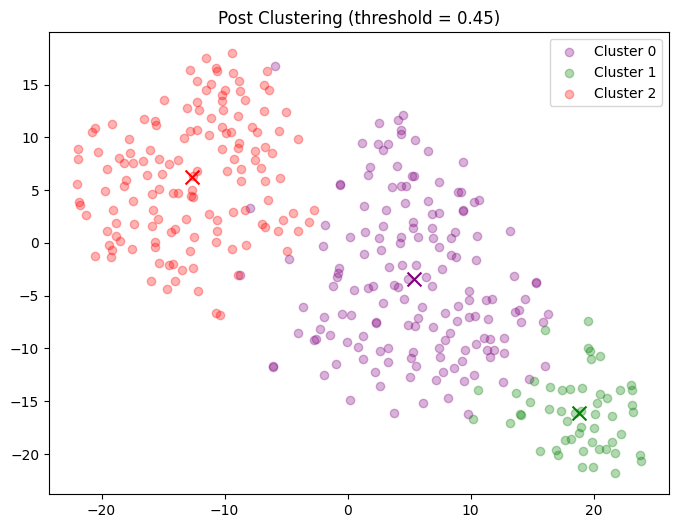

In [ ]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import numpy as np

filtered_labels = np.where(filtered_labels == 3, 0, filtered_labels)

# Apply t-SNE **after filtering**
tsne = TSNE(n_components=2, perplexity=30, random_state=42, init="random", learning_rate=200)
vis_dims2 = tsne.fit_transform(filtered_matrix)  # Use filtered data

x = vis_dims2[:, 0]
y = vis_dims2[:, 1]

plt.figure(figsize=(8, 6))

for category, color in enumerate(["purple", "green", "red"]):  # Only 4 clusters
    mask = filtered_labels == category  # Use filtered labels
    xs, ys = x[mask], y[mask]

    plt.scatter(xs, ys, color=color, alpha=0.3, label=f"Cluster {category}")

    # Plot cluster centroids
    avg_x, avg_y = xs.mean(), ys.mean()
    plt.scatter(avg_x, avg_y, marker="x", color=color, s=100)

plt.title("Post Clustering (threshold = 0.45)")
plt.legend()
plt.show()

use open ai decide cluster name

In [ ]:
df_clustered

,title,body,tags,user_id,username,embedding,cosine_sim_score,euclidian_dis_score,l2_norm_embedding,Cluster
1,Android CPU awake and Battery Depletion due to...,I am working on an Sensors App that needs to m...,android|service|android-volley|android-sensors...,4259011,Theodore Samuel,"[-0.012620874680578709, 0.007086478173732758, ...",0.724840,0.741836,"[-0.012620874944282136, 0.0070864783217992455,...",3
5,Need a push framework for android,We need to achieve a push functionality in our...,android|node.js|redis|push|pusher,759783,ashutosh,"[-0.023059504106640816, 0.0061685508117079735,...",0.704314,0.769007,"[-0.023059503819841107, 0.006168550734987391, ...",1
6,Is FCM still better than polling when updating...,I want to have some sort of notification syste...,android|ios|cordova|firebase-cloud-messaging|n...,607033,inf3rno,"[-0.0019366682972759008, 0.019377123564481735,...",0.699753,0.774915,"[-0.0019366682430695156, 0.019377123022125655,...",1
9,How to know when a day was started in android?,Is there a way to detect when a day was starte...,android|datetime|android-service|android-broad...,4264063,Jack,"[0.0014720194740220904, 0.017004573717713356, ...",0.696074,0.779649,"[0.0014720194020822538, 0.017004572886673903, ...",3
12,What is the power efficient way to keep offlin...,Im building an Android client for an Internet ...,android|offline-caching,1380150,Alexander Dunaev,"[-0.007778969593346119, 0.019832391291856766, ...",0.718349,0.750535,"[-0.007778969973482725, 0.019832392261010565, ...",1
...,...,...,...,...,...,...,...,...,...,...
675,How frequently does the Android OS itself (not...,Im looking at writing a locationaware applicat...,android|location,569777,MetaFight,"[-0.006700046360492706, 0.019116586074233055, ...",0.706425,0.766257,"[-0.00670004617704119, 0.01911658555080881, -0...",2
676,Which applications are using location service?,I found that location service drain my battery...,android|location,2463173,Michal,"[-0.003722809487953782, 0.027506107464432716, ...",0.719254,0.749328,"[-0.0037228095769135496, 0.027506108121715053,...",2
677,service that will run and stop automatically i...,need a service that will run in background and...,android|service,1432009,Humayun Kabir,"[-0.005675656255334616, 0.01504851970821619, -...",0.690545,0.786709,"[-0.005675656536934327, 0.015048520454853869, ...",2
678,Stop Android Service after some time?,I have a background service in my app which is...,android|service,3013161,Slim C.,"[-0.01054888404905796, 0.01150911208242178, -0...",0.688413,0.789414,"[-0.010548884744092471, 0.011509112840722853, ...",3


In [ ]:
df_clustered['Cluster'][df_clustered['Cluster'] == 3] = 0
df_clustered.drop(columns=['embedding'], inplace=True)
df_clustered

<ipython-input-41-0076b677f007>:1: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_clustered['Cluster'][df_clustered['Cluster'] == 3] = 0
<ipython-input-41-0076b677f007>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a

,title,body,tags,user_id,username,cosine_sim_score,euclidian_dis_score,l2_norm_embedding,Cluster
1,Android CPU awake and Battery Depletion due to...,I am working on an Sensors App that needs to m...,android|service|android-volley|android-sensors...,4259011,Theodore Samuel,0.724840,0.741836,"[-0.012620874944282136, 0.0070864783217992455,...",0
5,Need a push framework for android,We need to achieve a push functionality in our...,android|node.js|redis|push|pusher,759783,ashutosh,0.704314,0.769007,"[-0.023059503819841107, 0.006168550734987391, ...",1
6,Is FCM still better than polling when updating...,I want to have some sort of notification syste...,android|ios|cordova|firebase-cloud-messaging|n...,607033,inf3rno,0.699753,0.774915,"[-0.0019366682430695156, 0.019377123022125655,...",1
9,How to know when a day was started in android?,Is there a way to detect when a day was starte...,android|datetime|android-service|android-broad...,4264063,Jack,0.696074,0.779649,"[0.0014720194020822538, 0.017004572886673903, ...",0
12,What is the power efficient way to keep offlin...,Im building an Android client for an Internet ...,android|offline-caching,1380150,Alexander Dunaev,0.718349,0.750535,"[-0.007778969973482725, 0.019832392261010565, ...",1
...,...,...,...,...,...,...,...,...,...
675,How frequently does the Android OS itself (not...,Im looking at writing a locationaware applicat...,android|location,569777,MetaFight,0.706425,0.766257,"[-0.00670004617704119, 0.01911658555080881, -0...",2
676,Which applications are using location service?,I found that location service drain my battery...,android|location,2463173,Michal,0.719254,0.749328,"[-0.0037228095769135496, 0.027506108121715053,...",2
677,service that will run and stop automatically i...,need a service that will run in background and...,android|service,1432009,Humayun Kabir,0.690545,0.786709,"[-0.005675656536934327, 0.015048520454853869, ...",2
678,Stop Android Service after some time?,I have a background service in my app which is...,android|service,3013161,Slim C.,0.688413,0.789414,"[-0.010548884744092471, 0.011509112840722853, ...",0


In [ ]:
df_clustered = df_cluster.merge(df_clustered[['title', 'Cluster']], on='title', how='left')
df_clustered.dropna(subset=['Cluster'], inplace=True)
df_clustered.reset_index(drop=True, inplace=True)
df_clustered

,title,post_body,owner_username,tags,view_count,favourite_count,post_score,creation_date,last_activity_date,answer_count,...,last_activity_date_time,answer_create_date_day,answer_create_date_month,answer_create_date_year,answer_create_date_time,comment_create_date_day,comment_create_date_month,comment_create_date_year,comment_create_date_time,Cluster
0,Acquiring GPS data from mobile browser,Im working on a project where Im supposed to g...,Kevin Zero,browser|background|refresh,77,0,-1,2015-04-22 09:51:53,2015-04-24 14:53:47,1,...,14:53:47,24,4,2015,14:53:47,0,0,0,0,2.0
1,"Activity, service or fragment?",I am writing an app which needs to monitor the...,Saurabh Kumar,android|performance|android-intent|android-fra...,126,0,0,2013-08-28 01:32:27,2013-08-28 03:07:58,1,...,03:07:58,28,8,2013,03:07:58,28,8,2013,08:25:35,0.0
2,ActivityRecognitionAPI keeps sending pending i...,I am using ActivityRecognitionAPI in Android t...,Max Testing,android|activity-recognition,104,0,0,2015-06-02 00:10:42,2015-06-29 18:23:08,1,...,18:23:08,29,6,2015,18:23:08,0,0,0,0,0.0
3,AlarmManager RTC_WAKEUP drains battery,I have a service running in the background whi...,user2189878,android|android-service|alarmmanager,794,1,1,2016-05-02 07:31:48,2017-07-19 11:54:12,1,...,11:54:12,2,5,2016,08:30:23,0,0,0,0,0.0
4,AlarmManager with notification not firing,Im making an app with a persistent notificatio...,Calvin Li,android|android-studio|alarmmanager|android-no...,754,0,1,2015-03-12 23:36:37,2015-03-13 07:02:58,1,...,07:02:58,13,3,2015,07:02:58,0,0,0,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
349,service that will run and stop automatically i...,need a service that will run in background and...,Humayun Kabir,android|service,1243,0,0,2012-07-16 02:38:06,2012-07-16 06:53:20,1,...,06:53:20,16,7,2012,02:44:46,16,7,2012,07:34:56,2.0
350,smart phone bratinger app,I want to make an android application that whe...,Mariam,android,70,0,1,2012-10-08 12:42:39,2012-10-08 13:02:14,2,...,13:02:14,8,10,2012,13:02:14,0,0,0,0,2.0
351,startMonitoringSignificantLocationChanges call...,is added for background and delegate is called...,Gauri Shankar,ios|objective-c|cllocationmanager,344,0,1,2015-06-02 07:29:07,2015-06-02 07:43:39,1,...,07:43:39,2,6,2015,07:43:39,0,0,0,0,2.0
352,"swift iOS , location manager startUpdatingLoca...",I would like to start updating the location di...,StephanD,ios|swift|location,287,1,2,2016-12-02 22:18:42,2016-12-02 22:18:42,0,...,22:18:42,0,0,0,0,0,0,0,0,2.0


In [ ]:
# from openai import OpenAI
# import os

# cluster_name = []

# client = OpenAI(api_key=os.environ.get("OPENAI_API_KEY", "Insert API here"))

# rev_per_cluster = 5

# # Merge cluster 3 with cluster 1 when n_clusters == 1
# if n_clusters == 1:
#     df_clustered.loc[df_clustered["Cluster"] == 3, "Cluster"] = 1

# for i in range(n_clusters):
#     if i == 3:  # Skip cluster 3
#         continue

#     print(f"Cluster {i} Theme:", end=" ")

#     cluster_df = df_clustered[df_clustered.Cluster == i]

#     # Ensure we sample only available rows
#     sample_size = min(len(cluster_df), rev_per_cluster)

#     posts = "\n".join(
#         cluster_df.sample(sample_size, random_state=42)  # Safe sampling
#         [['title', 'cleaned_text']]
#         .apply(lambda row: f"Title: {row['title']}\nContent: {row['cleaned_text']}", axis=1)
#         .values
#     )

#     messages = [
#         {"role": "user", "content": f'What do the following posts have in common?\n\n"""\n{posts}\n"""\n\nTheme:'}
#     ]

#     response = client.chat.completions.create(
#         model="gpt-4",
#         messages=messages,
#         temperature=0,
#         max_tokens=64,
#         top_p=1,
#         frequency_penalty=0,
#         presence_penalty=0
#     )
#     print(response.choices[0].message.content.replace("\n", ""))
#     cluster_name.append(response.choices[0].message.content.replace("\n", ""))

#     sample_cluster_rows = cluster_df.sample(sample_size, random_state=42)  # Safe sampling
#     for j in range(sample_size):  # Use safe sample size
#         print(sample_cluster_rows.title.str[:70].values[j])

#     print("-" * 100)


In [ ]:
# df_clustered["Cluster_Name"] = df_clustered["Cluster"].map(lambda x: cluster_name[x])

In [ ]:
# df_clustered

ใช้วิธีการเอา cluster ไป replace ชื่อที่เคยได้เพราะไม่ต้องการรัน openai อีกรอบ

In [ ]:
#ข้ามหากทำ OpenAI
df_clustered['Cluster'] = df_clustered['Cluster'].astype(int)

In [ ]:
#ข้ามหากทำ OpenAI
df_clustered['Cluster_Name'] = df_clustered['Cluster']
df_clustered

,title,post_body,owner_username,tags,view_count,favourite_count,post_score,creation_date,last_activity_date,answer_count,...,answer_create_date_day,answer_create_date_month,answer_create_date_year,answer_create_date_time,comment_create_date_day,comment_create_date_month,comment_create_date_year,comment_create_date_time,Cluster,Cluster_Name
0,Acquiring GPS data from mobile browser,Im working on a project where Im supposed to g...,Kevin Zero,browser|background|refresh,77,0,-1,2015-04-22 09:51:53,2015-04-24 14:53:47,1,...,24,4,2015,14:53:47,0,0,0,0,2,2
1,"Activity, service or fragment?",I am writing an app which needs to monitor the...,Saurabh Kumar,android|performance|android-intent|android-fra...,126,0,0,2013-08-28 01:32:27,2013-08-28 03:07:58,1,...,28,8,2013,03:07:58,28,8,2013,08:25:35,0,0
2,ActivityRecognitionAPI keeps sending pending i...,I am using ActivityRecognitionAPI in Android t...,Max Testing,android|activity-recognition,104,0,0,2015-06-02 00:10:42,2015-06-29 18:23:08,1,...,29,6,2015,18:23:08,0,0,0,0,0,0
3,AlarmManager RTC_WAKEUP drains battery,I have a service running in the background whi...,user2189878,android|android-service|alarmmanager,794,1,1,2016-05-02 07:31:48,2017-07-19 11:54:12,1,...,2,5,2016,08:30:23,0,0,0,0,0,0
4,AlarmManager with notification not firing,Im making an app with a persistent notificatio...,Calvin Li,android|android-studio|alarmmanager|android-no...,754,0,1,2015-03-12 23:36:37,2015-03-13 07:02:58,1,...,13,3,2015,07:02:58,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
349,service that will run and stop automatically i...,need a service that will run in background and...,Humayun Kabir,android|service,1243,0,0,2012-07-16 02:38:06,2012-07-16 06:53:20,1,...,16,7,2012,02:44:46,16,7,2012,07:34:56,2,2
350,smart phone bratinger app,I want to make an android application that whe...,Mariam,android,70,0,1,2012-10-08 12:42:39,2012-10-08 13:02:14,2,...,8,10,2012,13:02:14,0,0,0,0,2,2
351,startMonitoringSignificantLocationChanges call...,is added for background and delegate is called...,Gauri Shankar,ios|objective-c|cllocationmanager,344,0,1,2015-06-02 07:29:07,2015-06-02 07:43:39,1,...,2,6,2015,07:43:39,0,0,0,0,2,2
352,"swift iOS , location manager startUpdatingLoca...",I would like to start updating the location di...,StephanD,ios|swift|location,287,1,2,2016-12-02 22:18:42,2016-12-02 22:18:42,0,...,0,0,0,0,0,0,0,0,2,2


In [ ]:
df_clustered['Cluster_Name'].replace(0, 'Location Services and GPS Impact on Mobile Battery Drain', inplace= True)
df_clustered['Cluster_Name'].replace(1, 'Battery Usage and Optimization in iOS Applications', inplace= True)
df_clustered['Cluster_Name'].replace(2, 'Managing Battery Drain in Android Development with Server Communication', inplace= True)

#หากทำ OpenAI
# df_clustered.replace('The common theme in these posts is issues related to battery drain caused by location services or GPS usage in mobile applications.', 'Location Services and GPS Impact on Mobile Battery Drain', inplace= True)
# df_clustered.replace('Battery usage and power consumption in iOS applications.', 'Battery Usage and Optimization in iOS Applications', inplace= True)
# df_clustered.replace('All the posts are related to Android development, specifically dealing with server communication and concerns about battery drain.', 'Managing Battery Drain in Android Development with Server Communication', inplace= True)
df_clustered

<ipython-input-48-f27621e7b898>:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_clustered['Cluster_Name'].replace(0, 'Location Services and GPS Impact on Mobile Battery Drain', inplace= True)


,title,post_body,owner_username,tags,view_count,favourite_count,post_score,creation_date,last_activity_date,answer_count,...,answer_create_date_day,answer_create_date_month,answer_create_date_year,answer_create_date_time,comment_create_date_day,comment_create_date_month,comment_create_date_year,comment_create_date_time,Cluster,Cluster_Name
0,Acquiring GPS data from mobile browser,Im working on a project where Im supposed to g...,Kevin Zero,browser|background|refresh,77,0,-1,2015-04-22 09:51:53,2015-04-24 14:53:47,1,...,24,4,2015,14:53:47,0,0,0,0,2,Managing Battery Drain in Android Development ...
1,"Activity, service or fragment?",I am writing an app which needs to monitor the...,Saurabh Kumar,android|performance|android-intent|android-fra...,126,0,0,2013-08-28 01:32:27,2013-08-28 03:07:58,1,...,28,8,2013,03:07:58,28,8,2013,08:25:35,0,Location Services and GPS Impact on Mobile Bat...
2,ActivityRecognitionAPI keeps sending pending i...,I am using ActivityRecognitionAPI in Android t...,Max Testing,android|activity-recognition,104,0,0,2015-06-02 00:10:42,2015-06-29 18:23:08,1,...,29,6,2015,18:23:08,0,0,0,0,0,Location Services and GPS Impact on Mobile Bat...
3,AlarmManager RTC_WAKEUP drains battery,I have a service running in the background whi...,user2189878,android|android-service|alarmmanager,794,1,1,2016-05-02 07:31:48,2017-07-19 11:54:12,1,...,2,5,2016,08:30:23,0,0,0,0,0,Location Services and GPS Impact on Mobile Bat...
4,AlarmManager with notification not firing,Im making an app with a persistent notificatio...,Calvin Li,android|android-studio|alarmmanager|android-no...,754,0,1,2015-03-12 23:36:37,2015-03-13 07:02:58,1,...,13,3,2015,07:02:58,0,0,0,0,0,Location Services and GPS Impact on Mobile Bat...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
349,service that will run and stop automatically i...,need a service that will run in background and...,Humayun Kabir,android|service,1243,0,0,2012-07-16 02:38:06,2012-07-16 06:53:20,1,...,16,7,2012,02:44:46,16,7,2012,07:34:56,2,Managing Battery Drain in Android Development ...
350,smart phone bratinger app,I want to make an android application that whe...,Mariam,android,70,0,1,2012-10-08 12:42:39,2012-10-08 13:02:14,2,...,8,10,2012,13:02:14,0,0,0,0,2,Managing Battery Drain in Android Development ...
351,startMonitoringSignificantLocationChanges call...,is added for background and delegate is called...,Gauri Shankar,ios|objective-c|cllocationmanager,344,0,1,2015-06-02 07:29:07,2015-06-02 07:43:39,1,...,2,6,2015,07:43:39,0,0,0,0,2,Managing Battery Drain in Android Development ...
352,"swift iOS , location manager startUpdatingLoca...",I would like to start updating the location di...,StephanD,ios|swift|location,287,1,2,2016-12-02 22:18:42,2016-12-02 22:18:42,0,...,0,0,0,0,0,0,0,0,2,Managing Battery Drain in Android Development ...


Export data to csv

In [ ]:
# df_clustered.to_csv('/content/bigquery_clustered.csv')

#5. Tags Clustering

In [ ]:
tags_columns = ['tag_1', 'tag_2', 'tag_3', 'tag_4', 'tag_5']
all_tags = pd.concat([df_clustered[col] for col in tags_columns])
unique_tags = set(all_tags.explode().dropna())
unique_tags =list(unique_tags)
print(len(unique_tags))

241


In [ ]:
unique_tags = pd.DataFrame(unique_tags)
unique_tags.sort_values(by = 0,ascending=True, inplace=True)
unique_tags.to_csv('unique_tags.csv')

In [ ]:
unique_tags

,0
29,2d-games
231,accelerometer
113,activity-recognition
100,alarm
91,alarmmanager
...,...
14,xamarin.forms
214,xamarin.ios
9,xcode
111,xcode-instruments


In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
import pandas as pd
from sklearn.cluster import DBSCAN

n_clusters= 25

vectorizer = TfidfVectorizer(stop_words="english")
X = vectorizer.fit_transform(unique_tags[0])

kmeans = KMeans(n_clusters=n_clusters, random_state=42)
kmeans.fit(X)
labels = kmeans.labels_

# dbscan = DBSCAN(eps=1.0, min_samples=5)
# labels = dbscan.fit_predict(X)


result = pd.DataFrame({'Tag': unique_tags[0], 'Cluster': labels})
result

,Tag,Cluster
29,2d-games,2
231,accelerometer,2
113,activity-recognition,2
100,alarm,2
91,alarmmanager,2
...,...,...
14,xamarin.forms,2
214,xamarin.ios,20
9,xcode,14
111,xcode-instruments,14


In [ ]:
color_options = list(plt.cm.tab10.colors) + list(plt.cm.Set3.colors)

# ตรวจสอบว่าจำนวนสีพอหรือไม่
if n_clusters <= len(color_options):
    colors = random.sample(color_options, n_clusters)  # ไม่ซ้ำ
else:
    colors = random.choices(color_options, k=n_clusters)

<ipython-input-55-bd77554783dd>:14: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('tab20', len(unique_labels))


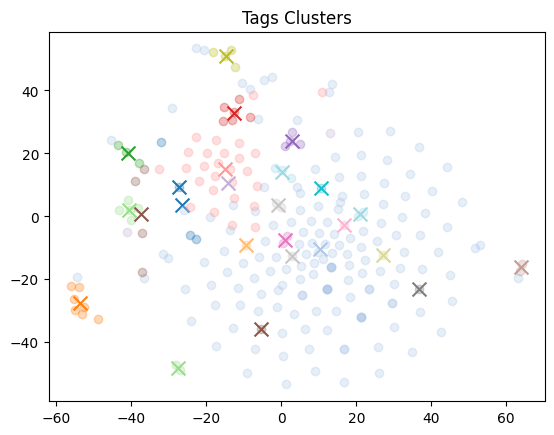

In [ ]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import numpy as np

# ใช้ t-SNE สำหรับการแสดงผล
tsne = TSNE(n_components=2, perplexity=15, random_state=42, init="random", learning_rate=200)
vis_dims2 = tsne.fit_transform(X)

x = [x for x, y in vis_dims2]
y = [y for x, y in vis_dims2]

# สีสำหรับแต่ละกลุ่ม
unique_labels = set(labels)
colors = plt.cm.get_cmap('tab20', len(unique_labels))

for category, color in zip(unique_labels, colors.colors):
    xs = np.array(x)[result.Cluster == category]
    ys = np.array(y)[result.Cluster == category]
    plt.scatter(xs, ys, color=color, alpha=0.3)

    avg_x = xs.mean()
    avg_y = ys.mean()

    plt.scatter(avg_x, avg_y, marker="x", color=color, s=100)

plt.title("Tags Clusters")
plt.show()

In [ ]:
for i in range(n_clusters):
  print(f"Cluster {i}: {', '.join(map(str, result[result['Cluster'] == i]['Tag'].unique()))}")

Cluster 0: firebase, firebase-cloud-messaging, google-cloud-messaging
Cluster 1: android-wake-lock
Cluster 2: 2d-games, accelerometer, activity-recognition, alarm, alarmmanager, alerts, amazon-sns, animation, api, appstore-approval, auto-close, automation, backend, background, background-process, background-task, battery, battery-saver, batterylevel, batterymanager, benchmarking, blackberry, broadcastreceiver, browser, c#, caching, chat, client-server, cllocation, cllocationmanager, clregion, cocoa-touch, compact-framework, connection, cordova, cordova-plugins, core-motion, daemon, datetime, disconnect, display, eclipse, email, energy, events, exit, extjs, flutter, foreground, fusedlocationproviderapi, fusedlocationproviderclient, game-engine, garbage-collection, geofencing, geolocation, gps, handler, instruments, intercept, ios4, ios5, ios6, ios7, ios8, ipad-2, iphone, iphone-privateapi, java, keep-alive, keypress, kotlin, lifecycle, localization, locationlistener, locationmanager, lo

หลังใช้วิธีการให้ 2 คน weight

In [ ]:
!pip install python-docx pandas

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 244.3/244.3 kB 3.3 MB/s eta 0:00:00


docx to df

In [ ]:
# from docx import Document
# import pandas as pd
# import re

# doc_path = "/content/tag_succeed.docx"  # แก้เป็น path ของไฟล์ที่ต้องใช้
# doc = Document(doc_path)

# clusters = {}
# not_in_clusters = []
# current_cluster = None

# for para in doc.paragraphs:
#     text = para.text.strip()

#     # เช็คว่าเป็นหัวข้อคลัสเตอร์หรือไม่ (เช่น "Cluster 0:")
#     cluster_match = re.match(r"Cluster (\d+):\s*(.*)", text)

#     if cluster_match:
#         current_cluster = int(cluster_match.group(1))
#         tags = cluster_match.group(2).strip().split(", ") if cluster_match.group(2) else []
#         clusters[current_cluster] = tags
#     elif text:  # ถ้าเป็นแท็กที่ไม่ได้อยู่ในคลัสเตอร์ ให้เพิ่มลงไปใน not_in_clusters
#         not_in_clusters.extend(text.split(", "))

# tag_to_cluster = {tag.lower().strip(): cluster for cluster, tags in clusters.items() for tag in tags}

# # ตรวจสอบ unique_tags_list และทำให้เป็น lowercase เช่นกัน
# unique_tags_list = [tag.lower().strip() for tag in unique_tags[0]]

# # สร้าง DataFrame
# result = pd.DataFrame({"Tag": unique_tags_list})
# result["Cluster"] = result["Tag"].map(tag_to_cluster)

# # แท็กที่ยังไม่มี Cluster (NaN) ให้เพิ่มเข้าไปในคลัสเตอร์ใหม่
# new_cluster_id = max(clusters.keys(), default=39) + 1
# for index, row in result.iterrows():
#     if pd.isna(row["Cluster"]):  # ถ้าเป็น NaN
#         result.at[index, "Cluster"] = new_cluster_id
#         new_cluster_id += 1

# # แสดงผล
# result

# # # สร้างแมปแท็ก → คลัสเตอร์
# # tag_to_cluster = {tag: cluster for cluster, tags in clusters.items() for tag in tags}

# # # จัดกลุ่มแท็กที่ไม่ได้อยู่ในคลัสเตอร์
# # new_cluster_id = max(clusters.keys(), default=39) + 1
# # for tag in not_in_clusters:
# #     tag_to_cluster[tag] = new_cluster_id
# #     new_cluster_id += 1

# # # โหลด unique_tags จากตัวแปรที่มีอยู่แล้ว
# # unique_tags_list = unique_tags[0]  # สมมติว่า unique_tags เป็น List

# # # สร้าง DataFrame
# # result = pd.DataFrame({"Tag": unique_tags_list})
# # result["Cluster"] = result["Tag"].map(tag_to_cluster)

# # # แสดงผล
# # print(result)


In [ ]:
# result['Cluster'].max()

OpenAI decide the cluster name

In [ ]:
# from openai import OpenAI
# import os
# import pandas as pd

# # ตั้งค่า API Key (ใช้ตัวแปรลับในระบบ แทนที่ os.environ หรือใส่คีย์ตรงนี้)
# client = OpenAI(api_key="Insert API here")

# # แปลง Cluster ให้เป็น int (ตัดทศนิยม)
# result["Cluster"] = result["Cluster"].astype(int)

# # เก็บชื่อคลัสเตอร์ที่ OpenAI สร้าง
# cluster_names = {}

# for cluster_id in sorted(result["Cluster"].unique()):  # วนลูปตามคลัสเตอร์ที่มีอยู่
#     cluster_tags = result[result["Cluster"] == cluster_id]["Tag"].tolist()

#     # ใช้จำนวน tags ทั้งหมดในคลัสเตอร์นั้นเป็นตัวอย่าง
#     rev_per_cluster = len(cluster_tags)

#     # เอา tag สูงสุด rev_per_cluster ตัวอย่างมาใช้
#     sample_tags = ", ".join(cluster_tags[:rev_per_cluster])

#     messages = [
#         {"role": "user", "content": f'Give a short category name for these tags:\n"{sample_tags}"'}
#     ]

#     response = client.chat.completions.create(
#         model="gpt-4",
#         messages=messages,
#         temperature=0,
#         max_tokens=10,
#         top_p=1,
#         frequency_penalty=0,
#         presence_penalty=0
#     )

#     cluster_name = response.choices[0].message.content.strip()
#     cluster_names[cluster_id] = cluster_name

#     print(f"Cluster {cluster_id}: {cluster_name}")

# # เพิ่มชื่อคลัสเตอร์ลงใน DataFrame
# result["Cluster_Name"] = result["Cluster"].map(cluster_names)

# # แสดงผลลัพธ์
# result

In [ ]:
# result['Cluster_Name'] = result['Cluster_Name'].str.replace('"', '')
# result.rename(columns={"Cluster_Name": "Tag Name"})

In [ ]:
# result.to_csv('Tags_cluster.csv')

In [ ]:
result = pd.read_csv('/content/Tags_cluster.csv', index_col = 0)
result

,Tag,Cluster,Cluster_Name
0,2d-games,2,Game Development and Design
1,accelerometer,40,"""Sensor Technology"""
2,activity-recognition,41,"""Technology & Software"""
3,alarm,29,"""Alarm and Alert Systems"""
4,alarmmanager,29,"""Alarm and Alert Systems"""
...,...,...,...
236,xamarin.forms,133,"""Mobile App Development"""
237,xamarin.ios,20,iOS Development
238,xcode,14,"""Apple Xcode Development"""
239,xcode-instruments,14,"""Apple Xcode Development"""


In [ ]:
result['Cluster_Name'] = result['Cluster_Name'].str.replace('"', '')
result.rename(columns={"Cluster_Name": "Tag_Name"},inplace= True)

In [ ]:
df_clustered

,title,post_body,owner_username,tags,view_count,favourite_count,post_score,creation_date,last_activity_date,answer_count,...,answer_create_date_day,answer_create_date_month,answer_create_date_year,answer_create_date_time,comment_create_date_day,comment_create_date_month,comment_create_date_year,comment_create_date_time,Cluster,Cluster_Name
0,Acquiring GPS data from mobile browser,Im working on a project where Im supposed to g...,Kevin Zero,browser|background|refresh,77,0,-1,2015-04-22 09:51:53,2015-04-24 14:53:47,1,...,24,4,2015,14:53:47,0,0,0,0,2,Managing Battery Drain in Android Development ...
1,"Activity, service or fragment?",I am writing an app which needs to monitor the...,Saurabh Kumar,android|performance|android-intent|android-fra...,126,0,0,2013-08-28 01:32:27,2013-08-28 03:07:58,1,...,28,8,2013,03:07:58,28,8,2013,08:25:35,0,Location Services and GPS Impact on Mobile Bat...
2,ActivityRecognitionAPI keeps sending pending i...,I am using ActivityRecognitionAPI in Android t...,Max Testing,android|activity-recognition,104,0,0,2015-06-02 00:10:42,2015-06-29 18:23:08,1,...,29,6,2015,18:23:08,0,0,0,0,0,Location Services and GPS Impact on Mobile Bat...
3,AlarmManager RTC_WAKEUP drains battery,I have a service running in the background whi...,user2189878,android|android-service|alarmmanager,794,1,1,2016-05-02 07:31:48,2017-07-19 11:54:12,1,...,2,5,2016,08:30:23,0,0,0,0,0,Location Services and GPS Impact on Mobile Bat...
4,AlarmManager with notification not firing,Im making an app with a persistent notificatio...,Calvin Li,android|android-studio|alarmmanager|android-no...,754,0,1,2015-03-12 23:36:37,2015-03-13 07:02:58,1,...,13,3,2015,07:02:58,0,0,0,0,0,Location Services and GPS Impact on Mobile Bat...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
349,service that will run and stop automatically i...,need a service that will run in background and...,Humayun Kabir,android|service,1243,0,0,2012-07-16 02:38:06,2012-07-16 06:53:20,1,...,16,7,2012,02:44:46,16,7,2012,07:34:56,2,Managing Battery Drain in Android Development ...
350,smart phone bratinger app,I want to make an android application that whe...,Mariam,android,70,0,1,2012-10-08 12:42:39,2012-10-08 13:02:14,2,...,8,10,2012,13:02:14,0,0,0,0,2,Managing Battery Drain in Android Development ...
351,startMonitoringSignificantLocationChanges call...,is added for background and delegate is called...,Gauri Shankar,ios|objective-c|cllocationmanager,344,0,1,2015-06-02 07:29:07,2015-06-02 07:43:39,1,...,2,6,2015,07:43:39,0,0,0,0,2,Managing Battery Drain in Android Development ...
352,"swift iOS , location manager startUpdatingLoca...",I would like to start updating the location di...,StephanD,ios|swift|location,287,1,2,2016-12-02 22:18:42,2016-12-02 22:18:42,0,...,0,0,0,0,0,0,0,0,2,Managing Battery Drain in Android Development ...


In [ ]:
cluster_name = dict(zip(result['Cluster'], result['Tag_Name']))

def replace_tag_with_cluster_name(row, cluster_names, result):
    for tag_column in ['tag_1', 'tag_2', 'tag_3', 'tag_4', 'tag_5']:
        tag = row[tag_column]
        if tag:
            cluster_id = result[result['Tag'] == tag]['Cluster'].values
            if cluster_id.size > 0:
                cluster_name = cluster_names.get(cluster_id[0], None)
                # Create a new column for each tag with cluster name
                row[f'{tag_column}_cluster_name'] = cluster_name
    return row

# Apply the function to replace tags with cluster names
df_clustered = df_clustered.apply(replace_tag_with_cluster_name, axis=1, cluster_names=cluster_name, result=result)

# Display the result
df_clustered

,Cluster,Cluster_Name,accepted_answer,answer_body,answer_comment_count,answer_count,answer_create_date,answer_create_date_day,answer_create_date_month,answer_create_date_time,...,tag_2_cluster_name,tag_3,tag_3_cluster_name,tag_4,tag_4_cluster_name,tag_5,tag_5_cluster_name,tags,title,view_count
0,2,Managing Battery Drain in Android Development ...,None,<p>As far as I know you can't do that. Browser...,0,1,2015-04-24 14:53:47,24,4,14:53:47,...,Design Elements,refresh,Browser Actions,None,NaN,None,NaN,browser|background|refresh,Acquiring GPS data from mobile browser,77
1,0,Location Services and GPS Impact on Mobile Bat...,None,"<p>service - for background work, receiver for...",1,1,2013-08-28 03:07:58,28,8,03:07:58,...,Entertainment,android-intent,Android Development,android-fragments,Android Development,alarmmanager,Alarm and Alert Systems,android|performance|android-intent|android-fra...,"Activity, service or fragment?",126
2,0,Location Services and GPS Impact on Mobile Bat...,None,<p>As per the documentation: </p>\n\n<blockquo...,0,1,2015-06-29 18:23:08,29,6,18:23:08,...,Technology & Software,None,NaN,None,NaN,None,NaN,android|activity-recognition,ActivityRecognitionAPI keeps sending pending i...,104
3,0,Location Services and GPS Impact on Mobile Bat...,None,"<p>Try with only <strong>RTC</strong>, because...",0,1,2016-05-02 08:30:23,2,5,08:30:23,...,Android Service Management,alarmmanager,Alarm and Alert Systems,None,NaN,None,NaN,android|android-service|alarmmanager,AlarmManager RTC_WAKEUP drains battery,794
4,0,Location Services and GPS Impact on Mobile Bat...,None,"<p>Ok, turns out the example I was looking at ...",0,1,2015-03-13 07:02:58,13,3,07:02:58,...,Android Development,alarmmanager,Alarm and Alert Systems,android-notifications,Mobile Notifications,None,NaN,android|android-studio|alarmmanager|android-no...,AlarmManager with notification not firing,754
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
349,2,Managing Battery Drain in Android Development ...,11497565.0,<p>You can user <code>AlarmManager</code> Clas...,2,1,2012-07-16 02:44:46,16,7,02:44:46,...,Android Service Management,None,NaN,None,NaN,None,NaN,android|service,service that will run and stop automatically i...,1243
350,2,Managing Battery Drain in Android Development ...,12782209.0,<p>You dont need to run background service to ...,0,2,2012-10-08 13:02:14,8,10,13:02:14,...,NaN,None,NaN,None,NaN,None,NaN,android,smart phone bratinger app,70
351,2,Managing Battery Drain in Android Development ...,30590222.0,"<p>You need to set the desiredAccuracy, distan...",0,1,2015-06-02 07:43:39,2,6,07:43:39,...,Programming Languages,cllocationmanager,Location and Navigation Services,None,NaN,None,NaN,ios|objective-c|cllocationmanager,startMonitoringSignificantLocationChanges call...,344
352,2,Managing Battery Drain in Android Development ...,None,None,0,0,NaN,0,0,0,...,Programming Languages,location,Location and Navigation Services,None,NaN,None,NaN,ios|swift|location,"swift iOS , location manager startUpdatingLoca...",287


In [ ]:
df.dtypes

,0
title,object
post_body,object
owner_username,object
tags,object
view_count,int64
favourite_count,int64
post_score,int64
creation_date,object
last_activity_date,object
answer_count,int64


In [ ]:
df_clustered.dtypes

,0
Cluster,int64
Cluster_Name,object
accepted_answer,object
answer_body,object
answer_comment_count,int64
answer_count,int64
answer_create_date,object
answer_create_date_day,int64
answer_create_date_month,int64
answer_create_date_time,object


In [ ]:
df

,title,post_body,owner_username,tags,view_count,favourite_count,post_score,creation_date,last_activity_date,answer_count,...,last_activity_date_year,last_activity_date_time,answer_create_date_day,answer_create_date_month,answer_create_date_year,answer_create_date_time,comment_create_date_day,comment_create_date_month,comment_create_date_year,comment_create_date_time
5,3D games for Google Glass,Im wondering if anyone out there has experienc...,scone,google-glass|google-gdk,108,0,1,2014-10-14 17:11:15,2015-12-01 02:57:57,1,...,2015,02:57:57,1,12,2015,02:57:57,0,0,0,0
7,AMOLED display does not save power with full b...,I created an that shows black screen and insta...,prasannatsm,android|battery|display,254,0,3,2016-03-24 11:56:52,2016-03-26 07:43:43,0,...,2016,07:43:43,0,0,0,0,0,0,0,0
22,Acquiring GPS data from mobile browser,Im working on a project where Im supposed to g...,Kevin Zero,browser|background|refresh,77,0,-1,2015-04-22 09:51:53,2015-04-24 14:53:47,1,...,2015,14:53:47,24,4,2015,14:53:47,0,0,0,0
23,Acquiring WifiManager.MulticastLock on Android...,I am thinking of developing an Android app tha...,VJ Vélan Solutions,android|jmdns,776,1,1,2013-10-05 07:29:39,2013-10-06 09:16:27,1,...,2013,09:16:27,6,10,2013,09:16:27,7,10,2013,04:31:41
40,"Activity, service or fragment?",I am writing an app which needs to monitor the...,Saurabh Kumar,android|performance|android-intent|android-fra...,126,0,0,2013-08-28 01:32:27,2013-08-28 03:07:58,1,...,2013,03:07:58,28,8,2013,03:07:58,28,8,2013,08:25:35
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3027,"telegram ,whatsapp, viber tcp connection",I was analyzing chat application like telegram...,user3503159,android|networking|tcp|xmppframework|whatsapp,2188,0,2,2014-11-29 12:45:08,2014-11-30 11:55:08,2,...,2014,11:55:08,30,11,2014,11:55:08,30,11,2014,21:59:09
3028,"telegram ,whatsapp, viber tcp connection",I was analyzing chat application like telegram...,user3503159,android|networking|tcp|xmppframework|whatsapp,2188,0,2,2014-11-29 12:45:08,2014-11-30 11:55:08,2,...,2014,11:55:08,30,11,2014,11:55:08,30,11,2014,22:12:07
3029,"telegram ,whatsapp, viber tcp connection",I was analyzing chat application like telegram...,user3503159,android|networking|tcp|xmppframework|whatsapp,2188,0,2,2014-11-29 12:45:08,2014-11-30 11:55:08,2,...,2014,11:55:08,30,11,2014,11:55:08,30,11,2014,22:21:04
3030,"telegram ,whatsapp, viber tcp connection",I was analyzing chat application like telegram...,user3503159,android|networking|tcp|xmppframework|whatsapp,2188,0,2,2014-11-29 12:45:08,2014-11-30 11:55:08,2,...,2014,11:55:08,30,11,2014,11:55:08,30,11,2014,22:22:07


In [ ]:
df_final = df.merge(df_clustered[['title','Cluster', 'Cluster_Name', 'tag_1_cluster_name', 'tag_2_cluster_name', 'tag_3_cluster_name', 'tag_4_cluster_name', 'tag_5_cluster_name']], on='title', how='left')
df_final.dropna(subset=['Cluster'], inplace=True)
df_final.reset_index(drop=True, inplace=True)
df_final

,title,post_body,owner_username,tags,view_count,favourite_count,post_score,creation_date,last_activity_date,answer_count,...,comment_create_date_month,comment_create_date_year,comment_create_date_time,Cluster,Cluster_Name,tag_1_cluster_name,tag_2_cluster_name,tag_3_cluster_name,tag_4_cluster_name,tag_5_cluster_name
0,Acquiring GPS data from mobile browser,Im working on a project where Im supposed to g...,Kevin Zero,browser|background|refresh,77,0,-1,2015-04-22 09:51:53,2015-04-24 14:53:47,1,...,0,0,0,2.0,Managing Battery Drain in Android Development ...,Internet & Technology,Design Elements,Browser Actions,NaN,NaN
1,"Activity, service or fragment?",I am writing an app which needs to monitor the...,Saurabh Kumar,android|performance|android-intent|android-fra...,126,0,0,2013-08-28 01:32:27,2013-08-28 03:07:58,1,...,8,2013,08:25:35,0.0,Location Services and GPS Impact on Mobile Bat...,Android Development,Entertainment,Android Development,Android Development,Alarm and Alert Systems
2,ActivityRecognitionAPI keeps sending pending i...,I am using ActivityRecognitionAPI in Android t...,Max Testing,android|activity-recognition,104,0,0,2015-06-02 00:10:42,2015-06-29 18:23:08,1,...,0,0,0,0.0,Location Services and GPS Impact on Mobile Bat...,Android Development,Technology & Software,NaN,NaN,NaN
3,AlarmManager RTC_WAKEUP drains battery,I have a service running in the background whi...,user2189878,android|android-service|alarmmanager,794,1,1,2016-05-02 07:31:48,2017-07-19 11:54:12,1,...,0,0,0,0.0,Location Services and GPS Impact on Mobile Bat...,Android Development,Android Service Management,Alarm and Alert Systems,NaN,NaN
4,AlarmManager with notification not firing,Im making an app with a persistent notificatio...,Calvin Li,android|android-studio|alarmmanager|android-no...,754,0,1,2015-03-12 23:36:37,2015-03-13 07:02:58,1,...,0,0,0,0.0,Location Services and GPS Impact on Mobile Bat...,Android Development,Android Development,Alarm and Alert Systems,Mobile Notifications,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
935,smart phone bratinger app,I want to make an android application that whe...,Mariam,android,70,0,1,2012-10-08 12:42:39,2012-10-08 13:02:14,2,...,0,0,0,2.0,Managing Battery Drain in Android Development ...,Android Development,NaN,NaN,NaN,NaN
936,smart phone bratinger app,I want to make an android application that whe...,Mariam,android,70,0,1,2012-10-08 12:42:39,2012-10-08 13:02:14,2,...,10,2012,18:00:55,2.0,Managing Battery Drain in Android Development ...,Android Development,NaN,NaN,NaN,NaN
937,startMonitoringSignificantLocationChanges call...,is added for background and delegate is called...,Gauri Shankar,ios|objective-c|cllocationmanager,344,0,1,2015-06-02 07:29:07,2015-06-02 07:43:39,1,...,0,0,0,2.0,Managing Battery Drain in Android Development ...,iOS Development,Programming Languages,Location and Navigation Services,NaN,NaN
938,"swift iOS , location manager startUpdatingLoca...",I would like to start updating the location di...,StephanD,ios|swift|location,287,1,2,2016-12-02 22:18:42,2016-12-02 22:18:42,0,...,0,0,0,2.0,Managing Battery Drain in Android Development ...,iOS Development,Programming Languages,Location and Navigation Services,NaN,NaN


In [ ]:
df_final = df_final.astype({
    "title": str,
    "post_body": str,
    "owner_username": str,
    "tags": str,
    "view_count" : int,
    "favourite_count" : int,
    "post_score" : int,
    "answer_count" : int,
    "answer_id" : str,
    "comment_count" : int,
    "accepted_answer" : str,
    "answer_body" : str,
    "answer_score" : int,
    "answer_favorite_count" : int,
    "answer_comment_count" : int,
    "answer_owner_username" : str,
    "comment_body" : str,
    "comment_score" : int,
    "comment_owner_username" : str,
    "Cluster" : int,
    "Cluster_Name" : str
})


In [ ]:
df_final.dtypes

,0
title,object
post_body,object
owner_username,object
tags,object
view_count,int64
favourite_count,int64
post_score,int64
creation_date,object
last_activity_date,object
answer_count,int64


Export data to csv

In [ ]:
# df_final.to_csv('Cleanned_Data.csv')

#6. Visualization

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

**1. Accepted Answer by cluster**

In [ ]:
df_final[['title', 'accepted_answer']]

,title,accepted_answer
0,Acquiring GPS data from mobile browser,None
1,"Activity, service or fragment?",None
2,ActivityRecognitionAPI keeps sending pending i...,None
3,AlarmManager RTC_WAKEUP drains battery,None
4,AlarmManager with notification not firing,None
...,...,...
935,smart phone bratinger app,12782209.0
936,smart phone bratinger app,12782209.0
937,startMonitoringSignificantLocationChanges call...,30590222.0
938,"swift iOS , location manager startUpdatingLoca...",None


In [ ]:
df_unique = df_final.drop_duplicates(subset=['title'])
aa_counts = df_unique.groupby(['Cluster', 'Cluster_Name']).size().reset_index(name='accepted_answer_counts')

# คำนวณ % ของแต่ละ clustetr
total_accepted_answers = aa_counts['accepted_answer_counts'].sum()
aa_counts['percentage'] = round((aa_counts['accepted_answer_counts'] / total_accepted_answers) * 100, 2)
aa_counts

,Cluster,Cluster_Name,accepted_answer_counts,percentage
0,0,Location Services and GPS Impact on Mobile Bat...,159,44.92
1,1,Battery Usage and Optimization in iOS Applicat...,53,14.97
2,2,Managing Battery Drain in Android Development ...,142,40.11


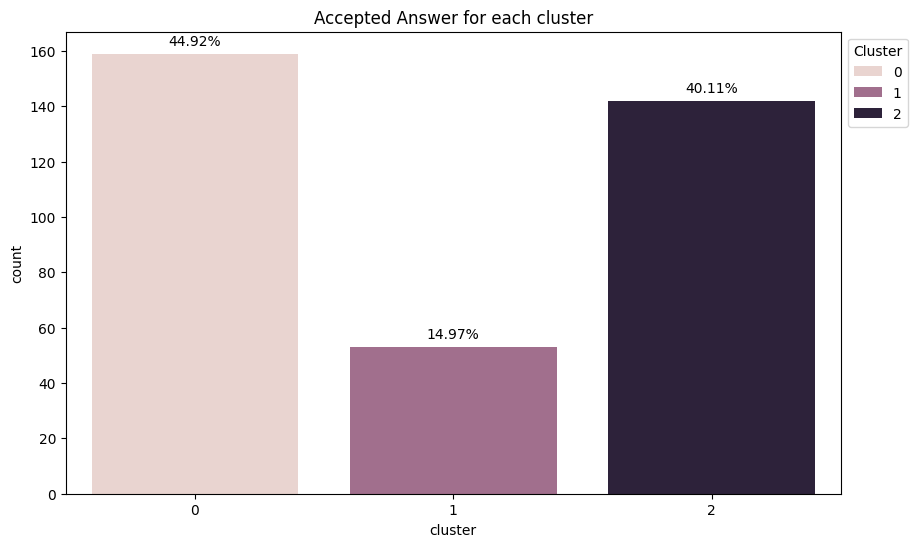

In [ ]:
# plot grahp
plt.figure(figsize=(10, 6))
aa_counts['hue_combined'] = aa_counts['Cluster'].astype(str) + ' : ' + aa_counts['Cluster_Name']
ax = sns.barplot(data=aa_counts, x='Cluster', y='accepted_answer_counts', hue='Cluster')
plt.xlabel('cluster')
plt.ylabel('count')
plt.title('Accepted Answer for each cluster')
plt.legend(title='Cluster', loc='best', bbox_to_anchor=(1, 1))
#plt.grid(True)

# Add percentage labels above the bars
# Iterate through the data in aa_counts instead of ax.patches
for index, row in aa_counts.iterrows():
    height = row['accepted_answer_counts']
    ax.text(index, height + 3,  # Use index from aa_counts
            '{:1.2f}%'.format(row['percentage']),
            ha="center")

plt.show()

**2. Yearly Posts**

In [ ]:
df_unique.dtypes

,0
title,object
post_body,object
owner_username,object
tags,object
view_count,int64
favourite_count,int64
post_score,int64
creation_date,object
last_activity_date,object
answer_count,int64


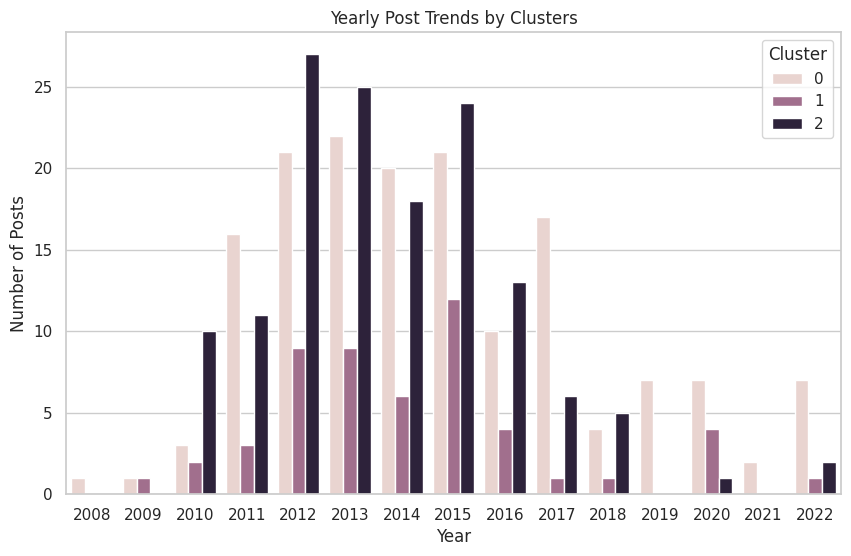

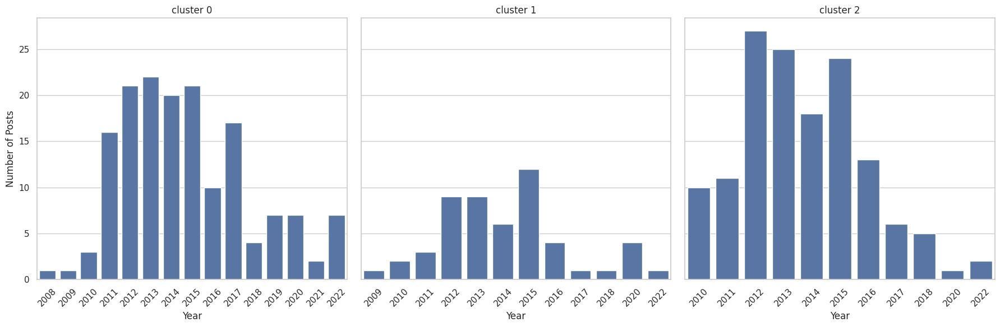

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_theme(style="whitegrid")

# ลบ title ที่ซ้ำกันโดยใช้ subset=['title']
# df_unique = df.drop_duplicates(subset=['title'])

# นับจำนวนโพสต์ที่ไม่ซ้ำกันในแต่ละปี แยกตาม cluster
post_counts_y = df_unique.groupby(['creation_date_year', 'Cluster']).size().reset_index(name='count')

# พล็อตกราฟเส้น
plt.figure(figsize=(10, 6))
sns.barplot(data=post_counts_y, x='creation_date_year', y='count', hue='Cluster')
plt.xlabel('Year')
plt.ylabel('Number of Posts')
plt.title('Yearly Post Trends by Clusters')
plt.legend(title='Cluster')
#plt.grid(True)
plt.show()

# แยกกราฟเป็น subplot แต่ละ cluster
fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharey=True)  # 1 แถว 3 คอลัมน์
clusters = [0, 1, 2]

for i, cluster in enumerate(clusters):
    cluster_data = post_counts_y[post_counts_y['Cluster'] == cluster]
    sns.barplot(x='creation_date_year', y='count', data=cluster_data, ax=axes[i])
    axes[i].set_title(f'cluster {cluster}')
    axes[i].set_xlabel('Year')
    if i == 0:  # แสดงป้ายกำกับแกน y เฉพาะกราฟแรก
        axes[i].set_ylabel('Number of Posts')

    # Rotate x-axis labels for subplot
    axes[i].tick_params(axis='x', rotation=45)

plt.tight_layout()  # ปรับระยะห่างระหว่าง subplot
plt.show()

จากกราฟ Yearly Post Trends for Each Cluster จะเห็นได้ว่าจำนวนโพสต์มีแนวโน้มเพิ่มขึ้นในช่วงปี 2008-2022 โดย cluster 0 มีจำนวนโพสต์มากที่สุดและเติบโตอย่างต่อเนื่อง ซึ่งอาจสะท้อนถึงความสนใจที่เพิ่มขึ้นในหัวข้อนี้ cluster 1,  2 มีจำนวนโพสต์น้อยกว่าและมีแนวโน้มการเกิดโพตส์ที่น้อยกว่าเมื่อเทียบกับ cluster 0 อาจเป็นเพราะโพสต์เก่าๆบน stack overflow สามารถแก้ไขปัญหาได้แล้วจึงไม่ต้องสร้างโพสต์ใหม่, มี platform อื่นๆที่สามารถแก้ไขปัญหาได้

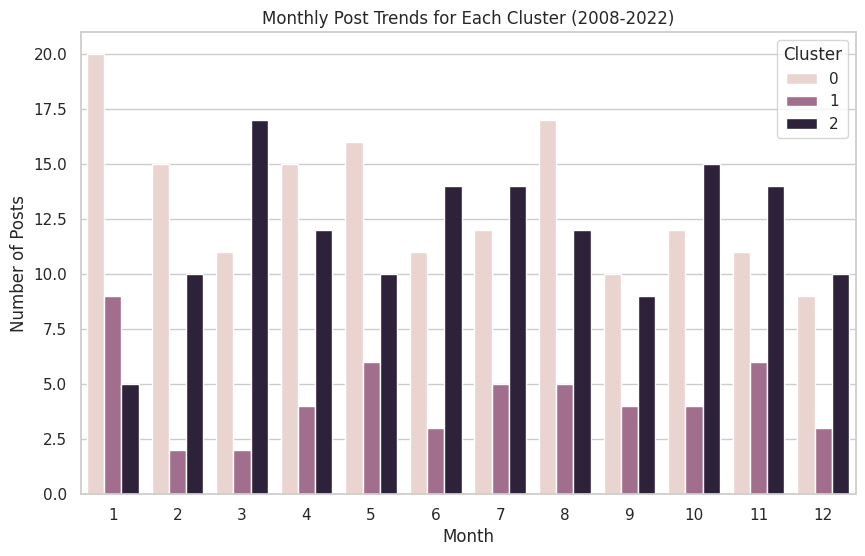

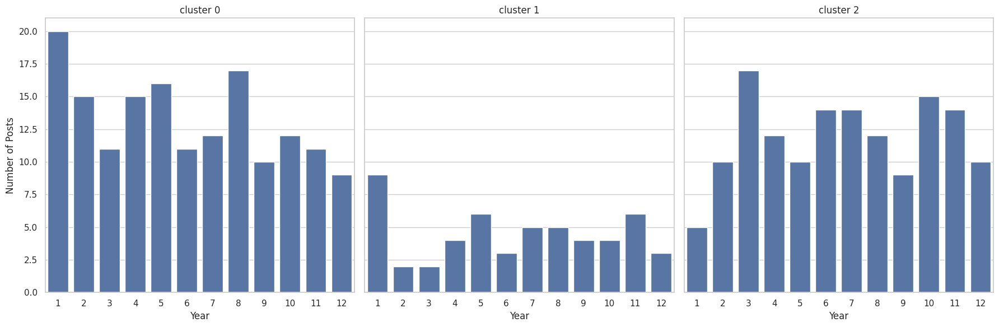

In [ ]:
# นับจำนวนโพสต์ที่ไม่ซ้ำกันในแต่ละปี แยกตาม cluster
post_counts_m = df_unique.groupby(['creation_date_month', 'Cluster']).size().reset_index(name='count')

# พล็อตกราฟเส้น
plt.figure(figsize=(10, 6))
sns.barplot(data=post_counts_m, x='creation_date_month', y='count', hue='Cluster')
plt.xlabel('Month')
plt.ylabel('Number of Posts')
plt.title('Monthly Post Trends for Each Cluster (2008-2022)')
plt.legend(title='Cluster')
#plt.grid(True)
plt.show()

# แยกกราฟเป็น subplot แต่ละ cluster
fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharey=True)  # 1 แถว 3 คอลัมน์
clusters = [0, 1, 2]

for i, cluster in enumerate(clusters):
    cluster_data_m = post_counts_m[post_counts_m['Cluster'] == cluster]
    sns.barplot(x='creation_date_month', y='count', data=cluster_data_m, ax=axes[i])
    axes[i].set_title(f'cluster {cluster}')
    axes[i].set_xlabel('Year')
    if i == 0:  # แสดงป้ายกำกับแกน y เฉพาะกราฟแรก
        axes[i].set_ylabel('Number of Posts')

    # Rotate x-axis labels for subplot
    #axes[i].tick_params(axis='x', rotation=45)

plt.tight_layout()  # ปรับระยะห่างระหว่าง subplot
plt.show()

**3. percentage of Post with Unanswered**

In [ ]:
df_ans = df_unique[df_unique['answer_count'] == 0].groupby(['Cluster']).size().reset_index(name='unanswered')
# Calculate answered counts for each cluster
df_ans['answered'] = df_unique[df_unique['answer_count'] != 0].groupby('Cluster')['title'].count().values
df_ans['total_post'] = df_unique.groupby('Cluster')['answer_count'].count().values

# Calculate the percentage of unanswered for each cluster
total_unanswered = df_ans['unanswered'].sum()
df_ans['percentage_unanswered'] = round((df_ans['unanswered'] / total_unanswered) * 100, 2)

total_answered = df_ans['answered'].sum()
df_ans['percentage_answered'] = round((df_ans['answered'] / total_answered) * 100, 2)
df_ans

,Cluster,unanswered,answered,total_post,percentage_unanswered,percentage_answered
0,0,36,123,159,54.55,42.71
1,1,9,44,53,13.64,15.28
2,2,21,121,142,31.82,42.01


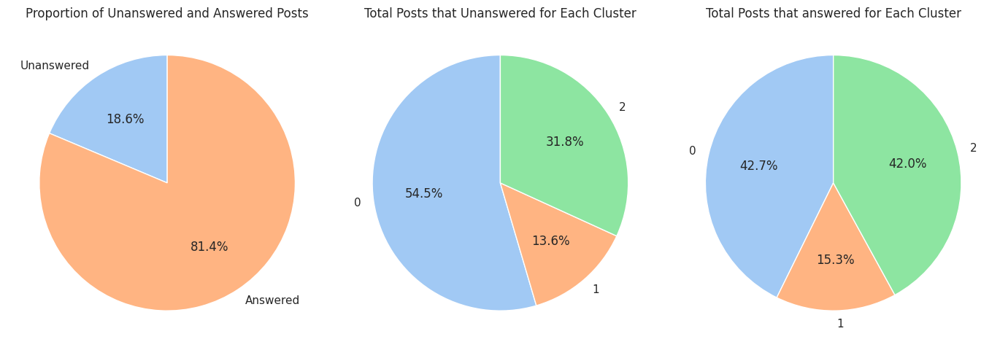

In [ ]:
sns.set_palette("pastel")  # กำหนดสี pastel

# Create a new DataFrame for the pie chart data
pie_chart_data = pd.DataFrame({
    'Category': ['Unanswered', 'Answered'],
    'Count': [df_ans['unanswered'].sum(), df_ans['answered'].sum()]
})

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(14, 8))  # 1 แถว 3 คอลัมน์

# Plot the first pie chart on the left subplot (ax1)
sns.set_palette("pastel")  # Set color palette
ax1.pie(pie_chart_data['Count'], labels=pie_chart_data['Category'], autopct='%1.1f%%', startangle=90)
ax1.set_title('Proportion of Unanswered and Answered Posts')

# Plot the second pie chart on the right subplot (ax2)
ax2.pie(df_ans['unanswered'], labels=df_ans['Cluster'], autopct='%1.1f%%', startangle=90)
ax2.set_title('Total Posts that Unanswered for Each Cluster')

ax3.pie(df_ans['answered'], labels=df_ans['Cluster'], autopct='%1.1f%%', startangle=90)
ax3.set_title('Total Posts that answered for Each Cluster')

# Adjust layout to prevent overlapping and display the charts
plt.tight_layout()
plt.show()

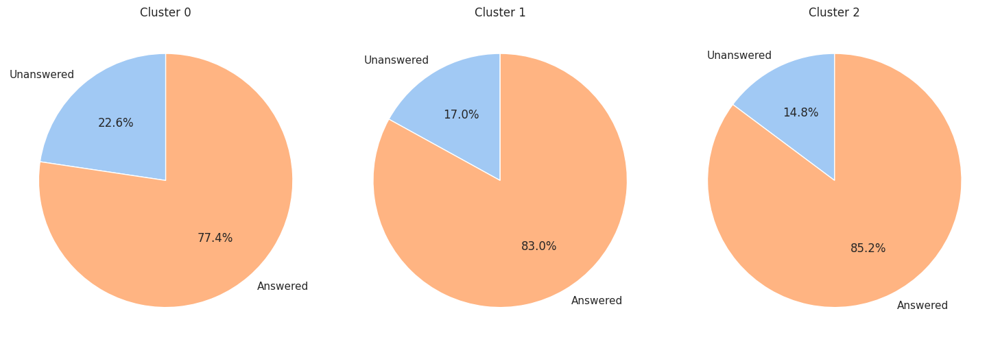

In [ ]:
# สร้าง Pie Chart 3 อัน
fig, axes = plt.subplots(1, 3, figsize=(15, 5))  # 1 แถว 3 คอลัมน์

clusters = df_ans['Cluster'].unique()  # ดึง cluster ที่ไม่ซ้ำกัน

for i, cluster in enumerate(clusters):
    # เลือกข้อมูลเฉพาะ cluster
    cluster_data = df_ans[df_ans['Cluster'] == cluster]

    # สร้างข้อมูลสำหรับ Pie Chart
    pie_data = [cluster_data['unanswered'].values[0],
                cluster_data['answered'].values[0]]
    labels = ['Unanswered', 'Answered']

    # สร้าง Pie Chart
    axes[i].pie(pie_data, labels=labels, autopct='%1.1f%%', startangle=90)
    axes[i].set_title(f'Cluster {cluster}')

plt.tight_layout()  # ปรับระยะห่างระหว่าง Pie Chart
plt.show()

In [ ]:
# Calculate the sum of each column
sum_unanswered = df_ans['unanswered'].sum()
sum_answered = df_ans['answered'].sum()
sum_total_post = df_ans['total_post'].sum()
sum_percentage_unanswered = df_ans['percentage_unanswered'].sum()
sum_percentage_answered = df_ans['percentage_answered'].sum()

# Create a DataFrame to display the sums
sum_df = pd.DataFrame({
    'column': ['unanswered_counts', 'answered_counts', 'total_answered_counts', 'percentage_unanswered', 'percentage_answered'],
    'sum': [sum_unanswered, sum_answered, sum_total_post, sum_percentage_unanswered, sum_percentage_answered]
})

# Convert 'sum' column to integers, rounding up 'percentage_unanswered'
#sum_df['sum'] = sum_df['sum'].astype(float)
sum_df.loc[sum_df['column'] == 'percentage_unanswered', 'sum'] = sum_df.loc[sum_df['column'] == 'percentage_unanswered', 'sum'].apply(lambda x: int(x))
#sum_df.loc[sum_df['column'] == 'percentage_answered', 'sum'] = sum_df.loc[sum_df['column'] == 'percentage_answered', 'sum'].apply(lambda x: int(x) + (x % 1 > 0))  #add (x % 1 > 0)) for ceiling 0.00

sum_df

,column,sum
0,unanswered_counts,66.0
1,answered_counts,288.0
2,total_answered_counts,354.0
3,percentage_unanswered,100.0
4,percentage_answered,100.0


**4. Top 10 กลุ่มของแท็ค (รวม cluster)**

In [ ]:
df_final['accepted_answer']

,accepted_answer
0,None
1,None
2,None
3,None
4,None
...,...
935,12782209.0
936,12782209.0
937,30590222.0
938,None


In [ ]:
from collections import defaultdict
import pandas as pd

def get_top_10_tag_cluster_counts(df):
    # 1. Function to extract tag cluster names (same as before)
    def extract_tag_clusters(row):
        tag_clusters = []
        for col in ['tag_1_cluster_name', 'tag_2_cluster_name', 'tag_3_cluster_name', 'tag_4_cluster_name', 'tag_5_cluster_name']:
            tag_cluster = row[col]
            if isinstance(tag_cluster, str) and tag_cluster:
                tag_clusters.append(tag_cluster)
        return tag_clusters

    # 2. Apply tag cluster extraction and filter for unique titles (same as before)
    df['tag_cluster_name_list'] = df.apply(extract_tag_clusters, axis=1)
    df_unique_titles = df.drop_duplicates(subset=['title'])

    # 3. Initialize tag cluster counts for each category (same as before)
    tag_cluster_counts = defaultdict(lambda: {'answered': 0, 'accepted_ans': 0, 'unanswered': 0})

    # 4. Iterate to count tag cluster occurrences for unique titles (same as before)
    for index, row in df_unique_titles.iterrows():
        for tag_cluster_name in row['tag_cluster_name_list']:
            if row['answer_count'] != 0 :
                tag_cluster_counts[tag_cluster_name]['answered'] += 1
            if row['accepted_answer'] != 'None':
                tag_cluster_counts[tag_cluster_name]['accepted_ans'] += 1
            if row['answer_count'] == 0:
                tag_cluster_counts[tag_cluster_name]['unanswered'] += 1

    # 5. Create a list of dictionaries for the DataFrame (same as before)
    tag_cluster_data = []
    for tag_cluster_name, counts in tag_cluster_counts.items():
        for category, count in counts.items():
            tag_cluster_data.append({
                'category': category,
                'tag_cluster_name': tag_cluster_name,
                'tag_count': count
            })

    # 6. Create the DataFrame (same as before)
    df_tag_cluster_counts = pd.DataFrame(tag_cluster_data)

    # Add this code to define the category order
    categories = ['answered', 'accepted_ans', 'unanswered']
    df_tag_cluster_counts['category'] = pd.Categorical(df_tag_cluster_counts['category'], categories=categories, ordered=True)

    # 7. Get top 10 tag_cluster_names (same as before)
    top_10_tag_clusters = df_tag_cluster_counts.groupby('tag_cluster_name')['tag_count'].sum().nlargest(10).index

    # 8. Filter the DataFrame to include only the top 10 tag_cluster_names (same as before)
    df_top_10_tag_cluster_counts = df_tag_cluster_counts[df_tag_cluster_counts['tag_cluster_name'].isin(top_10_tag_clusters)]

    # 9. Calculate total tag count for each tag_cluster_name (EXCLUDING accepted_ans)
    total_counts = df_top_10_tag_cluster_counts[df_top_10_tag_cluster_counts['category'].isin(['answered', 'unanswered'])].groupby('tag_cluster_name')['tag_count'].sum().reset_index(name='total_count')

    # 10. Merge total counts back into the DataFrame
    df_top_10_tag_cluster_counts = pd.merge(df_top_10_tag_cluster_counts, total_counts, on='tag_cluster_name')

    # 11. Calculate percentage (using the corrected total_count)
    df_top_10_tag_cluster_counts['percentage'] = (df_top_10_tag_cluster_counts['tag_count'] / df_top_10_tag_cluster_counts['total_count']) * 100

    return df_top_10_tag_cluster_counts

df_top_10_tag_cluster_result = get_top_10_tag_cluster_counts(df_final)

In [ ]:
df_final[df_final['accepted_answer'] == np.NaN] == True

,title,post_body,owner_username,tags,view_count,favourite_count,post_score,creation_date,last_activity_date,answer_count,...,comment_create_date_year,comment_create_date_time,Cluster,Cluster_Name,tag_1_cluster_name,tag_2_cluster_name,tag_3_cluster_name,tag_4_cluster_name,tag_5_cluster_name,tag_cluster_name_list


In [ ]:
df_sort = df_top_10_tag_cluster_result.sort_values(by=['total_count'], ascending=False)
df_sort

,category,tag_cluster_name,tag_count,total_count,percentage
0,answered,Android Development,265,333,79.579580
2,unanswered,Android Development,68,333,20.420420
1,accepted_ans,Android Development,130,333,39.039039
12,answered,Location and Navigation Services,147,174,84.482759
14,unanswered,Location and Navigation Services,27,174,15.517241
13,accepted_ans,Location and Navigation Services,74,174,42.528736
26,unanswered,iOS Development,14,103,13.592233
25,accepted_ans,iOS Development,31,103,30.097087
24,answered,iOS Development,89,103,86.407767
17,unanswered,Power Management,15,76,19.736842


In [ ]:
new_df = df_sort.pivot_table(
    index='tag_cluster_name',
    columns='category',
    values='tag_count',
    fill_value=0  # Fill missing values with 0
).reset_index()

new_df

<ipython-input-87-8530cc1d6c6c>:1: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  new_df = df_sort.pivot_table(


category,tag_cluster_name,answered,accepted_ans,unanswered
0,Alarm and Alert Systems,26.0,12.0,8.0
1,Android Development,265.0,130.0,68.0
2,Android Service Management,44.0,19.0,9.0
3,Energy Efficiency,14.0,8.0,1.0
4,Google Services,10.0,7.0,3.0
5,Location and Navigation Services,147.0,74.0,27.0
6,Mobile App Development,12.0,6.0,5.0
7,Power Management,61.0,22.0,15.0
8,Programming Languages,35.0,16.0,12.0
9,iOS Development,89.0,31.0,14.0


In [ ]:
# Create a new DataFrame with the desired columns and calculations
new_df = df_sort.pivot_table(
    index='tag_cluster_name',
    columns='category',
    values='tag_count',
    fill_value=0  # Fill missing values with 0
).reset_index()

# Rename the columns to match your desired names
new_df = new_df.rename(
    columns={
        'answered': 'answered_count',
        'accepted_ans': 'accepted_count',
        'unanswered': 'unanswered_count'
    }
)

# Calculate total_count
new_df['answered_count'] = new_df['answered_count'] - new_df['accepted_count']
new_df['total_count'] = new_df['answered_count'] +  new_df['accepted_count'] + new_df['unanswered_count']

# Calculate percentages
new_df['answered_percentage'] = round((new_df['answered_count'] / new_df['total_count']) * 100, 2)
new_df['accepted_percentage'] = round((new_df['accepted_count'] / new_df['total_count']) * 100, 2)
new_df['unanswered_percentage'] = round((new_df['unanswered_count'] / new_df['total_count']) * 100, 2)
#new_df['acc_per_ans'] = round((new_df['accepted_count'] / new_df['answered_count']) * 100, 2)
#new_df['unans_per_ans'] = round((new_df['unanswered_count'] / new_df['answered_count']) * 100, 2)

# Sort by total_count in descending order
final_df = new_df.sort_values(by=['total_count'], ascending=False)

# Display the final DataFrame
final_df[['tag_cluster_name', 'answered_count', 'accepted_count', 'unanswered_count', 'total_count',
         'answered_percentage', 'accepted_percentage', 'unanswered_percentage']]

<ipython-input-88-4cfcd79c51d9>:2: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  new_df = df_sort.pivot_table(


category,tag_cluster_name,answered_count,accepted_count,unanswered_count,total_count,answered_percentage,accepted_percentage,unanswered_percentage
1,Android Development,135.0,130.0,68.0,333.0,40.54,39.04,20.42
5,Location and Navigation Services,73.0,74.0,27.0,174.0,41.95,42.53,15.52
9,iOS Development,58.0,31.0,14.0,103.0,56.31,30.10,13.59
7,Power Management,39.0,22.0,15.0,76.0,51.32,28.95,19.74
2,Android Service Management,25.0,19.0,9.0,53.0,47.17,35.85,16.98
8,Programming Languages,19.0,16.0,12.0,47.0,40.43,34.04,25.53
0,Alarm and Alert Systems,14.0,12.0,8.0,34.0,41.18,35.29,23.53
6,Mobile App Development,6.0,6.0,5.0,17.0,35.29,35.29,29.41
3,Energy Efficiency,6.0,8.0,1.0,15.0,40.00,53.33,6.67
4,Google Services,3.0,7.0,3.0,13.0,23.08,53.85,23.08


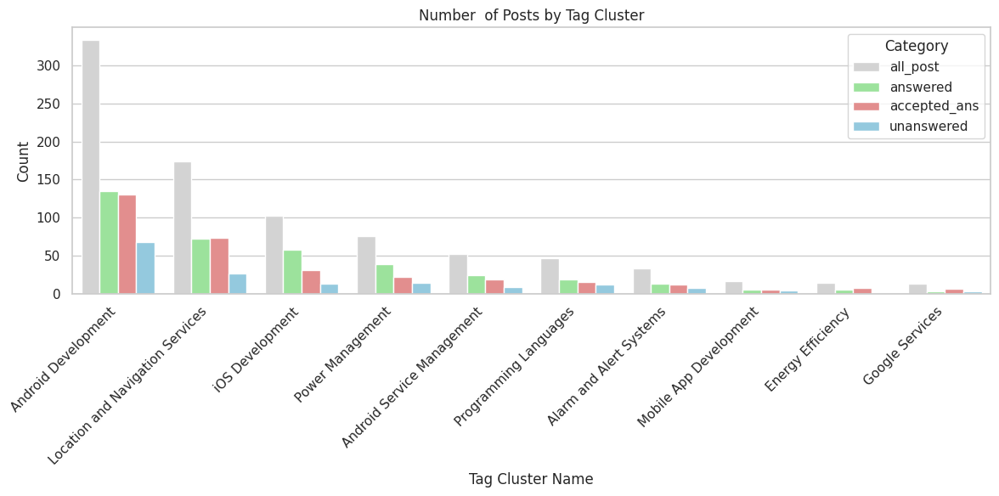

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

final_df["all_post"] = final_df['total_count']
final_df['answered'] = final_df['answered_count']
final_df['accepted_ans'] = final_df['accepted_count']
final_df['unanswered'] = final_df['unanswered_count']

# Melt the DataFrame to create a suitable format for seaborn
melted_df = final_df.melt(
    id_vars=['tag_cluster_name'],
    value_vars=['all_post', 'answered', 'accepted_ans', 'unanswered'],
    var_name='category',
    value_name='count'
)

# Create the bar plot
plt.figure(figsize=(12, 6))  # Adjust figure size as needed
sns.barplot(
    x='tag_cluster_name',
    y='count',
    hue='category',
    data=melted_df,
    palette={'all_post': 'lightgray', 'answered': 'lightgreen', 'accepted_ans': 'lightcoral', 'unanswered': 'skyblue'}  # Customize colors
)

# Customize the plot
plt.title('Number  of Posts by Tag Cluster')
plt.xlabel('Tag Cluster Name')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels if needed
plt.legend(title='Category')  # Add a legend
plt.tight_layout()  # Adjust layout to prevent overlapping
plt.show()

**5. How Long to get answer?**

In [ ]:
accepted_answer = df_final[df_final['accepted_answer'].notna()]
accepted_answer

,title,post_body,owner_username,tags,view_count,favourite_count,post_score,creation_date,last_activity_date,answer_count,...,comment_create_date_year,comment_create_date_time,Cluster,Cluster_Name,tag_1_cluster_name,tag_2_cluster_name,tag_3_cluster_name,tag_4_cluster_name,tag_5_cluster_name,tag_cluster_name_list
0,Acquiring GPS data from mobile browser,Im working on a project where Im supposed to g...,Kevin Zero,browser|background|refresh,77,0,-1,2015-04-22 09:51:53,2015-04-24 14:53:47,1,...,0,0,2,Managing Battery Drain in Android Development ...,Internet & Technology,Design Elements,Browser Actions,NaN,NaN,"[Internet & Technology, Design Elements, Brows..."
1,"Activity, service or fragment?",I am writing an app which needs to monitor the...,Saurabh Kumar,android|performance|android-intent|android-fra...,126,0,0,2013-08-28 01:32:27,2013-08-28 03:07:58,1,...,2013,08:25:35,0,Location Services and GPS Impact on Mobile Bat...,Android Development,Entertainment,Android Development,Android Development,Alarm and Alert Systems,"[Android Development, Entertainment, Android D..."
2,ActivityRecognitionAPI keeps sending pending i...,I am using ActivityRecognitionAPI in Android t...,Max Testing,android|activity-recognition,104,0,0,2015-06-02 00:10:42,2015-06-29 18:23:08,1,...,0,0,0,Location Services and GPS Impact on Mobile Bat...,Android Development,Technology & Software,NaN,NaN,NaN,"[Android Development, Technology & Software]"
3,AlarmManager RTC_WAKEUP drains battery,I have a service running in the background whi...,user2189878,android|android-service|alarmmanager,794,1,1,2016-05-02 07:31:48,2017-07-19 11:54:12,1,...,0,0,0,Location Services and GPS Impact on Mobile Bat...,Android Development,Android Service Management,Alarm and Alert Systems,NaN,NaN,"[Android Development, Android Service Manageme..."
4,AlarmManager with notification not firing,Im making an app with a persistent notificatio...,Calvin Li,android|android-studio|alarmmanager|android-no...,754,0,1,2015-03-12 23:36:37,2015-03-13 07:02:58,1,...,0,0,0,Location Services and GPS Impact on Mobile Bat...,Android Development,Android Development,Alarm and Alert Systems,Mobile Notifications,NaN,"[Android Development, Android Development, Ala..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
935,smart phone bratinger app,I want to make an android application that whe...,Mariam,android,70,0,1,2012-10-08 12:42:39,2012-10-08 13:02:14,2,...,0,0,2,Managing Battery Drain in Android Development ...,Android Development,NaN,NaN,NaN,NaN,[Android Development]
936,smart phone bratinger app,I want to make an android application that whe...,Mariam,android,70,0,1,2012-10-08 12:42:39,2012-10-08 13:02:14,2,...,2012,18:00:55,2,Managing Battery Drain in Android Development ...,Android Development,NaN,NaN,NaN,NaN,[Android Development]
937,startMonitoringSignificantLocationChanges call...,is added for background and delegate is called...,Gauri Shankar,ios|objective-c|cllocationmanager,344,0,1,2015-06-02 07:29:07,2015-06-02 07:43:39,1,...,0,0,2,Managing Battery Drain in Android Development ...,iOS Development,Programming Languages,Location and Navigation Services,NaN,NaN,"[iOS Development, Programming Languages, Locat..."
938,"swift iOS , location manager startUpdatingLoca...",I would like to start updating the location di...,StephanD,ios|swift|location,287,1,2,2016-12-02 22:18:42,2016-12-02 22:18:42,0,...,0,0,2,Managing Battery Drain in Android Development ...,iOS Development,Programming Languages,Location and Navigation Services,NaN,NaN,"[iOS Development, Programming Languages, Locat..."


In [ ]:
accepted_answer[['answer_id', 'accepted_answer']].dtypes

,0
answer_id,object
accepted_answer,object


In [ ]:
accepted_answer = accepted_answer[accepted_answer['answer_id'] == accepted_answer['accepted_answer']]
accepted_answer

,title,post_body,owner_username,tags,view_count,favourite_count,post_score,creation_date,last_activity_date,answer_count,...,comment_create_date_year,comment_create_date_time,Cluster,Cluster_Name,tag_1_cluster_name,tag_2_cluster_name,tag_3_cluster_name,tag_4_cluster_name,tag_5_cluster_name,tag_cluster_name_list
9,Android - How to slow down battery Drain,I am developing a game for Android It uses a s...,DoctorWho,android|game-engine|battery,313,0,1,2020-09-14 13:44:51,2020-09-18 18:01:19,1,...,0,0,0,Location Services and GPS Impact on Mobile Bat...,Android Development,Game Development and Design,Power Management,NaN,NaN,"[Android Development, Game Development and Des..."
16,Android - Reliably getting the current location,My app checks at a specific time whether a use...,noah,android|geolocation|gps,6963,10,8,2010-06-25 17:57:03,2013-07-09 17:02:04,2,...,2010,18:15:56,2,Managing Battery Drain in Android Development ...,Android Development,Location and Navigation Services,Location and Navigation Services,NaN,NaN,"[Android Development, Location and Navigation ..."
23,Android App high cpu usage and battery drain,Ive been working on an android game for awhile...,Envenge,android|cpu|battery,1426,0,0,2018-11-18 23:39:17,2018-11-24 18:28:58,3,...,2018,23:57:20,0,Location Services and GPS Impact on Mobile Bat...,Android Development,Computer Hardware,Power Management,NaN,NaN,"[Android Development, Computer Hardware, Power..."
24,Android App high cpu usage and battery drain,Ive been working on an android game for awhile...,Envenge,android|cpu|battery,1426,0,0,2018-11-18 23:39:17,2018-11-24 18:28:58,3,...,2018,04:12:25,0,Location Services and GPS Impact on Mobile Bat...,Android Development,Computer Hardware,Power Management,NaN,NaN,"[Android Development, Computer Hardware, Power..."
29,Android App high cpu usage and battery drain,Ive been working on an android game for awhile...,Envenge,android|cpu|battery,1426,0,0,2018-11-18 23:39:17,2018-11-24 18:28:58,3,...,2018,00:36:56,0,Location Services and GPS Impact on Mobile Bat...,Android Development,Computer Hardware,Power Management,NaN,NaN,"[Android Development, Computer Hardware, Power..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
931,requestLocationUpdates parameters having no ef...,I had previously coded an app with a location ...,NickT,android,2636,0,3,2011-10-03 15:46:48,2011-10-10 18:55:59,2,...,2011,19:58:24,2,Managing Battery Drain in Android Development ...,Android Development,NaN,NaN,NaN,NaN,[Android Development]
933,service that will run and stop automatically i...,need a service that will run in background and...,Humayun Kabir,android|service,1243,0,0,2012-07-16 02:38:06,2012-07-16 06:53:20,1,...,2012,07:34:56,2,Managing Battery Drain in Android Development ...,Android Development,Android Service Management,NaN,NaN,NaN,"[Android Development, Android Service Management]"
934,service that will run and stop automatically i...,need a service that will run in background and...,Humayun Kabir,android|service,1243,0,0,2012-07-16 02:38:06,2012-07-16 06:53:20,1,...,2012,06:49:34,2,Managing Battery Drain in Android Development ...,Android Development,Android Service Management,NaN,NaN,NaN,"[Android Development, Android Service Management]"
936,smart phone bratinger app,I want to make an android application that whe...,Mariam,android,70,0,1,2012-10-08 12:42:39,2012-10-08 13:02:14,2,...,2012,18:00:55,2,Managing Battery Drain in Android Development ...,Android Development,NaN,NaN,NaN,NaN,[Android Development]


In [ ]:
accepted_answer['title'].nunique()

138

In [ ]:
accepted_answer = accepted_answer.drop_duplicates(subset=['title'])
accepted_answer

,title,post_body,owner_username,tags,view_count,favourite_count,post_score,creation_date,last_activity_date,answer_count,...,comment_create_date_year,comment_create_date_time,Cluster,Cluster_Name,tag_1_cluster_name,tag_2_cluster_name,tag_3_cluster_name,tag_4_cluster_name,tag_5_cluster_name,tag_cluster_name_list
9,Android - How to slow down battery Drain,I am developing a game for Android It uses a s...,DoctorWho,android|game-engine|battery,313,0,1,2020-09-14 13:44:51,2020-09-18 18:01:19,1,...,0,0,0,Location Services and GPS Impact on Mobile Bat...,Android Development,Game Development and Design,Power Management,NaN,NaN,"[Android Development, Game Development and Des..."
16,Android - Reliably getting the current location,My app checks at a specific time whether a use...,noah,android|geolocation|gps,6963,10,8,2010-06-25 17:57:03,2013-07-09 17:02:04,2,...,2010,18:15:56,2,Managing Battery Drain in Android Development ...,Android Development,Location and Navigation Services,Location and Navigation Services,NaN,NaN,"[Android Development, Location and Navigation ..."
23,Android App high cpu usage and battery drain,Ive been working on an android game for awhile...,Envenge,android|cpu|battery,1426,0,0,2018-11-18 23:39:17,2018-11-24 18:28:58,3,...,2018,23:57:20,0,Location Services and GPS Impact on Mobile Bat...,Android Development,Computer Hardware,Power Management,NaN,NaN,"[Android Development, Computer Hardware, Power..."
42,Android Application that displays new messages...,I am looking for reading resources or sample a...,rywem,android|sockets|connection|power-management,144,0,0,2011-05-02 16:11:46,2013-10-31 23:11:57,2,...,2012,14:53:13,1,Battery Usage and Optimization in iOS Applicat...,Android Development,Network Communication Technologies,Technology & Internet,Energy Efficiency,NaN,"[Android Development, Network Communication Te..."
46,Android Keep thread alive questions,I am building an Android App that will communi...,Nissi,android|multithreading|tcp,1101,0,0,2012-08-12 18:28:12,2012-11-10 05:21:03,1,...,2012,10:41:52,1,Battery Usage and Optimization in iOS Applicat...,Android Development,Programming Concepts,Networking Protocols,NaN,NaN,"[Android Development, Programming Concepts, Ne..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
923,react-native app in android: battery being dra...,I have an app built in ReactNative that is dra...,Bruno Conterato,android|react-native,4653,0,2,2018-03-14 17:44:35,2018-03-14 18:19:00,1,...,2018,09:08:34,2,Managing Battery Drain in Android Development ...,Android Development,Programming Languages/Frameworks,NaN,NaN,NaN,"[Android Development, Programming Languages/Fr..."
931,requestLocationUpdates parameters having no ef...,I had previously coded an app with a location ...,NickT,android,2636,0,3,2011-10-03 15:46:48,2011-10-10 18:55:59,2,...,2011,19:58:24,2,Managing Battery Drain in Android Development ...,Android Development,NaN,NaN,NaN,NaN,[Android Development]
933,service that will run and stop automatically i...,need a service that will run in background and...,Humayun Kabir,android|service,1243,0,0,2012-07-16 02:38:06,2012-07-16 06:53:20,1,...,2012,07:34:56,2,Managing Battery Drain in Android Development ...,Android Development,Android Service Management,NaN,NaN,NaN,"[Android Development, Android Service Management]"
936,smart phone bratinger app,I want to make an android application that whe...,Mariam,android,70,0,1,2012-10-08 12:42:39,2012-10-08 13:02:14,2,...,2012,18:00:55,2,Managing Battery Drain in Android Development ...,Android Development,NaN,NaN,NaN,NaN,[Android Development]


In [ ]:
#how long it took to get the accepted answer?

accepted_answer['creation_date'] = pd.to_datetime(accepted_answer['creation_date'], errors='coerce')
accepted_answer['answer_last_activity'] = pd.to_datetime(accepted_answer['answer_last_activity'], errors='coerce')
accepted_answer['date_diff'] = accepted_answer['answer_last_activity'] - accepted_answer['creation_date']
accepted_answer

<ipython-input-95-a7fe1523d3d7>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  accepted_answer['creation_date'] = pd.to_datetime(accepted_answer['creation_date'], errors='coerce')
<ipython-input-95-a7fe1523d3d7>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  accepted_answer['answer_last_activity'] = pd.to_datetime(accepted_answer['answer_last_activity'], errors='coerce')
<ipython-input-95-a7fe1523d3d7>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try usi

,title,post_body,owner_username,tags,view_count,favourite_count,post_score,creation_date,last_activity_date,answer_count,...,comment_create_date_time,Cluster,Cluster_Name,tag_1_cluster_name,tag_2_cluster_name,tag_3_cluster_name,tag_4_cluster_name,tag_5_cluster_name,tag_cluster_name_list,date_diff
9,Android - How to slow down battery Drain,I am developing a game for Android It uses a s...,DoctorWho,android|game-engine|battery,313,0,1,2020-09-14 13:44:51,2020-09-18 18:01:19,1,...,0,0,Location Services and GPS Impact on Mobile Bat...,Android Development,Game Development and Design,Power Management,NaN,NaN,"[Android Development, Game Development and Des...",4 days 04:16:28
16,Android - Reliably getting the current location,My app checks at a specific time whether a use...,noah,android|geolocation|gps,6963,10,8,2010-06-25 17:57:03,2013-07-09 17:02:04,2,...,18:15:56,2,Managing Battery Drain in Android Development ...,Android Development,Location and Navigation Services,Location and Navigation Services,NaN,NaN,"[Android Development, Location and Navigation ...",6 days 07:10:23
23,Android App high cpu usage and battery drain,Ive been working on an android game for awhile...,Envenge,android|cpu|battery,1426,0,0,2018-11-18 23:39:17,2018-11-24 18:28:58,3,...,23:57:20,0,Location Services and GPS Impact on Mobile Bat...,Android Development,Computer Hardware,Power Management,NaN,NaN,"[Android Development, Computer Hardware, Power...",0 days 00:57:28
42,Android Application that displays new messages...,I am looking for reading resources or sample a...,rywem,android|sockets|connection|power-management,144,0,0,2011-05-02 16:11:46,2013-10-31 23:11:57,2,...,14:53:13,1,Battery Usage and Optimization in iOS Applicat...,Android Development,Network Communication Technologies,Technology & Internet,Energy Efficiency,NaN,"[Android Development, Network Communication Te...",0 days 00:07:05
46,Android Keep thread alive questions,I am building an Android App that will communi...,Nissi,android|multithreading|tcp,1101,0,0,2012-08-12 18:28:12,2012-11-10 05:21:03,1,...,10:41:52,1,Battery Usage and Optimization in iOS Applicat...,Android Development,Programming Concepts,Networking Protocols,NaN,NaN,"[Android Development, Programming Concepts, Ne...",89 days 10:52:51
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
923,react-native app in android: battery being dra...,I have an app built in ReactNative that is dra...,Bruno Conterato,android|react-native,4653,0,2,2018-03-14 17:44:35,2018-03-14 18:19:00,1,...,09:08:34,2,Managing Battery Drain in Android Development ...,Android Development,Programming Languages/Frameworks,NaN,NaN,NaN,"[Android Development, Programming Languages/Fr...",0 days 00:33:40
931,requestLocationUpdates parameters having no ef...,I had previously coded an app with a location ...,NickT,android,2636,0,3,2011-10-03 15:46:48,2011-10-10 18:55:59,2,...,19:58:24,2,Managing Battery Drain in Android Development ...,Android Development,NaN,NaN,NaN,NaN,[Android Development],7 days 03:09:11
933,service that will run and stop automatically i...,need a service that will run in background and...,Humayun Kabir,android|service,1243,0,0,2012-07-16 02:38:06,2012-07-16 06:53:20,1,...,07:34:56,2,Managing Battery Drain in Android Development ...,Android Development,Android Service Management,NaN,NaN,NaN,"[Android Development, Android Service Management]",0 days 00:06:40
936,smart phone bratinger app,I want to make an android application that whe...,Mariam,android,70,0,1,2012-10-08 12:42:39,2012-10-08 13:02:14,2,...,18:00:55,2,Managing Battery Drain in Android Development ...,Android Development,NaN,NaN,NaN,NaN,[Android Development],0 days 00:12:53


In [ ]:
def categorize_duration(td):
    if pd.isna(td):
        return "No Answer"
    elif td < pd.Timedelta(days=1):
        return "Less than 1 day"
    elif pd.Timedelta(days=1) <= td < pd.Timedelta(weeks=1):
        return "Within 1 Week"
    elif pd.Timedelta(weeks=1) <= td < pd.Timedelta(weeks=2):
        return "1 week"
    elif pd.Timedelta(weeks=2) <= td < pd.Timedelta(weeks=4):
        return "1 month"
    elif pd.Timedelta(weeks=4) <= td < pd.Timedelta(weeks=26):
        return "6 months"
    elif pd.Timedelta(weeks=26) <= td < pd.Timedelta(weeks=52):
        return "6 months - 1 year"
    else:
        return "1 year or more"

accepted_answer['date_diff_range'] = accepted_answer['date_diff'].apply(categorize_duration)

<ipython-input-96-1169fa979e39>:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  accepted_answer['date_diff_range'] = accepted_answer['date_diff'].apply(categorize_duration)


In [ ]:
accepted_answer['date_diff_range'].head(20)

,date_diff_range
9,Within 1 Week
16,Within 1 Week
23,Less than 1 day
42,Less than 1 day
46,6 months
62,Less than 1 day
71,1 year or more
74,1 year or more
76,Less than 1 day
78,Less than 1 day


In [ ]:
sorted_categories = accepted_answer['date_diff_range'].value_counts().sort_values(ascending=False).index
accepted_answer['date_diff_range'] = pd.Categorical(accepted_answer['date_diff_range'], categories=sorted_categories, ordered=True)

<ipython-input-98-2d492ca2c2a7>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  accepted_answer['date_diff_range'] = pd.Categorical(accepted_answer['date_diff_range'], categories=sorted_categories, ordered=True)


In [ ]:
accepted_answer.dtypes

,0
title,object
post_body,object
owner_username,object
tags,object
view_count,int64
favourite_count,int64
post_score,int64
creation_date,datetime64[ns]
last_activity_date,object
answer_count,int64


In [ ]:
accepted_answer[['title','answer_create_date','accepted_answer','comment_create_date','answer_last_activity']].to_csv('accepted_answer.csv')

In [ ]:
df_final['answer_create_date']

,answer_create_date
0,2015-04-24 14:53:47
1,2013-08-28 03:07:58
2,2015-06-29 18:23:08
3,2016-05-02 08:30:23
4,2015-03-13 07:02:58
...,...
935,2012-10-08 13:02:14
936,2012-10-08 12:55:32
937,2015-06-02 07:43:39
938,NaN


In [ ]:
df_first_answer = df_final.drop_duplicates(subset=['title'], keep='first')
df_first_answer = df_first_answer[df_first_answer['answer_count'] >= 1]
df_first_answer

,title,post_body,owner_username,tags,view_count,favourite_count,post_score,creation_date,last_activity_date,answer_count,...,comment_create_date_year,comment_create_date_time,Cluster,Cluster_Name,tag_1_cluster_name,tag_2_cluster_name,tag_3_cluster_name,tag_4_cluster_name,tag_5_cluster_name,tag_cluster_name_list
0,Acquiring GPS data from mobile browser,Im working on a project where Im supposed to g...,Kevin Zero,browser|background|refresh,77,0,-1,2015-04-22 09:51:53,2015-04-24 14:53:47,1,...,0,0,2,Managing Battery Drain in Android Development ...,Internet & Technology,Design Elements,Browser Actions,NaN,NaN,"[Internet & Technology, Design Elements, Brows..."
1,"Activity, service or fragment?",I am writing an app which needs to monitor the...,Saurabh Kumar,android|performance|android-intent|android-fra...,126,0,0,2013-08-28 01:32:27,2013-08-28 03:07:58,1,...,2013,08:25:35,0,Location Services and GPS Impact on Mobile Bat...,Android Development,Entertainment,Android Development,Android Development,Alarm and Alert Systems,"[Android Development, Entertainment, Android D..."
2,ActivityRecognitionAPI keeps sending pending i...,I am using ActivityRecognitionAPI in Android t...,Max Testing,android|activity-recognition,104,0,0,2015-06-02 00:10:42,2015-06-29 18:23:08,1,...,0,0,0,Location Services and GPS Impact on Mobile Bat...,Android Development,Technology & Software,NaN,NaN,NaN,"[Android Development, Technology & Software]"
3,AlarmManager RTC_WAKEUP drains battery,I have a service running in the background whi...,user2189878,android|android-service|alarmmanager,794,1,1,2016-05-02 07:31:48,2017-07-19 11:54:12,1,...,0,0,0,Location Services and GPS Impact on Mobile Bat...,Android Development,Android Service Management,Alarm and Alert Systems,NaN,NaN,"[Android Development, Android Service Manageme..."
4,AlarmManager with notification not firing,Im making an app with a persistent notificatio...,Calvin Li,android|android-studio|alarmmanager|android-no...,754,0,1,2015-03-12 23:36:37,2015-03-13 07:02:58,1,...,0,0,0,Location Services and GPS Impact on Mobile Bat...,Android Development,Android Development,Alarm and Alert Systems,Mobile Notifications,NaN,"[Android Development, Android Development, Ala..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
930,requestLocationUpdates parameters having no ef...,I had previously coded an app with a location ...,NickT,android,2636,0,3,2011-10-03 15:46:48,2011-10-10 18:55:59,2,...,2011,10:51:06,2,Managing Battery Drain in Android Development ...,Android Development,NaN,NaN,NaN,NaN,[Android Development]
932,running an NSTimer in the background of a mult...,i am attempting to make an app that records an...,dave,iphone|multithreading|background|location|nstimer,2905,1,0,2010-08-04 22:03:15,2011-02-07 13:48:22,1,...,0,0,2,Managing Battery Drain in Android Development ...,iOS Development,Programming Concepts,Design Elements,Location and Navigation Services,Timing Tools,"[iOS Development, Programming Concepts, Design..."
933,service that will run and stop automatically i...,need a service that will run in background and...,Humayun Kabir,android|service,1243,0,0,2012-07-16 02:38:06,2012-07-16 06:53:20,1,...,2012,07:34:56,2,Managing Battery Drain in Android Development ...,Android Development,Android Service Management,NaN,NaN,NaN,"[Android Development, Android Service Management]"
935,smart phone bratinger app,I want to make an android application that whe...,Mariam,android,70,0,1,2012-10-08 12:42:39,2012-10-08 13:02:14,2,...,0,0,2,Managing Battery Drain in Android Development ...,Android Development,NaN,NaN,NaN,NaN,[Android Development]


In [ ]:
df_first_answer['creation_date'] = pd.to_datetime(df_first_answer['creation_date'], errors='coerce')
df_first_answer['answer_create_date'] = pd.to_datetime(df_first_answer['answer_create_date'], errors='coerce')
df_first_answer['date_ans_diff'] = df_first_answer['answer_create_date'] - df_first_answer['creation_date']
df_first_answer

,title,post_body,owner_username,tags,view_count,favourite_count,post_score,creation_date,last_activity_date,answer_count,...,comment_create_date_time,Cluster,Cluster_Name,tag_1_cluster_name,tag_2_cluster_name,tag_3_cluster_name,tag_4_cluster_name,tag_5_cluster_name,tag_cluster_name_list,date_ans_diff
0,Acquiring GPS data from mobile browser,Im working on a project where Im supposed to g...,Kevin Zero,browser|background|refresh,77,0,-1,2015-04-22 09:51:53,2015-04-24 14:53:47,1,...,0,2,Managing Battery Drain in Android Development ...,Internet & Technology,Design Elements,Browser Actions,NaN,NaN,"[Internet & Technology, Design Elements, Brows...",2 days 05:01:54
1,"Activity, service or fragment?",I am writing an app which needs to monitor the...,Saurabh Kumar,android|performance|android-intent|android-fra...,126,0,0,2013-08-28 01:32:27,2013-08-28 03:07:58,1,...,08:25:35,0,Location Services and GPS Impact on Mobile Bat...,Android Development,Entertainment,Android Development,Android Development,Alarm and Alert Systems,"[Android Development, Entertainment, Android D...",0 days 01:35:31
2,ActivityRecognitionAPI keeps sending pending i...,I am using ActivityRecognitionAPI in Android t...,Max Testing,android|activity-recognition,104,0,0,2015-06-02 00:10:42,2015-06-29 18:23:08,1,...,0,0,Location Services and GPS Impact on Mobile Bat...,Android Development,Technology & Software,NaN,NaN,NaN,"[Android Development, Technology & Software]",27 days 18:12:26
3,AlarmManager RTC_WAKEUP drains battery,I have a service running in the background whi...,user2189878,android|android-service|alarmmanager,794,1,1,2016-05-02 07:31:48,2017-07-19 11:54:12,1,...,0,0,Location Services and GPS Impact on Mobile Bat...,Android Development,Android Service Management,Alarm and Alert Systems,NaN,NaN,"[Android Development, Android Service Manageme...",0 days 00:58:35
4,AlarmManager with notification not firing,Im making an app with a persistent notificatio...,Calvin Li,android|android-studio|alarmmanager|android-no...,754,0,1,2015-03-12 23:36:37,2015-03-13 07:02:58,1,...,0,0,Location Services and GPS Impact on Mobile Bat...,Android Development,Android Development,Alarm and Alert Systems,Mobile Notifications,NaN,"[Android Development, Android Development, Ala...",0 days 07:26:21
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
930,requestLocationUpdates parameters having no ef...,I had previously coded an app with a location ...,NickT,android,2636,0,3,2011-10-03 15:46:48,2011-10-10 18:55:59,2,...,10:51:06,2,Managing Battery Drain in Android Development ...,Android Development,NaN,NaN,NaN,NaN,[Android Development],6 days 06:43:46
932,running an NSTimer in the background of a mult...,i am attempting to make an app that records an...,dave,iphone|multithreading|background|location|nstimer,2905,1,0,2010-08-04 22:03:15,2011-02-07 13:48:22,1,...,0,2,Managing Battery Drain in Android Development ...,iOS Development,Programming Concepts,Design Elements,Location and Navigation Services,Timing Tools,"[iOS Development, Programming Concepts, Design...",186 days 15:45:07
933,service that will run and stop automatically i...,need a service that will run in background and...,Humayun Kabir,android|service,1243,0,0,2012-07-16 02:38:06,2012-07-16 06:53:20,1,...,07:34:56,2,Managing Battery Drain in Android Development ...,Android Development,Android Service Management,NaN,NaN,NaN,"[Android Development, Android Service Management]",0 days 00:06:40
935,smart phone bratinger app,I want to make an android application that whe...,Mariam,android,70,0,1,2012-10-08 12:42:39,2012-10-08 13:02:14,2,...,0,2,Managing Battery Drain in Android Development ...,Android Development,NaN,NaN,NaN,NaN,[Android Development],0 days 00:19:35


In [ ]:
df_first_answer['date_ans_diff_range'] = df_first_answer['date_ans_diff'].apply(categorize_duration)
df_first_answer

,title,post_body,owner_username,tags,view_count,favourite_count,post_score,creation_date,last_activity_date,answer_count,...,Cluster,Cluster_Name,tag_1_cluster_name,tag_2_cluster_name,tag_3_cluster_name,tag_4_cluster_name,tag_5_cluster_name,tag_cluster_name_list,date_ans_diff,date_ans_diff_range
0,Acquiring GPS data from mobile browser,Im working on a project where Im supposed to g...,Kevin Zero,browser|background|refresh,77,0,-1,2015-04-22 09:51:53,2015-04-24 14:53:47,1,...,2,Managing Battery Drain in Android Development ...,Internet & Technology,Design Elements,Browser Actions,NaN,NaN,"[Internet & Technology, Design Elements, Brows...",2 days 05:01:54,Within 1 Week
1,"Activity, service or fragment?",I am writing an app which needs to monitor the...,Saurabh Kumar,android|performance|android-intent|android-fra...,126,0,0,2013-08-28 01:32:27,2013-08-28 03:07:58,1,...,0,Location Services and GPS Impact on Mobile Bat...,Android Development,Entertainment,Android Development,Android Development,Alarm and Alert Systems,"[Android Development, Entertainment, Android D...",0 days 01:35:31,Less than 1 day
2,ActivityRecognitionAPI keeps sending pending i...,I am using ActivityRecognitionAPI in Android t...,Max Testing,android|activity-recognition,104,0,0,2015-06-02 00:10:42,2015-06-29 18:23:08,1,...,0,Location Services and GPS Impact on Mobile Bat...,Android Development,Technology & Software,NaN,NaN,NaN,"[Android Development, Technology & Software]",27 days 18:12:26,1 month
3,AlarmManager RTC_WAKEUP drains battery,I have a service running in the background whi...,user2189878,android|android-service|alarmmanager,794,1,1,2016-05-02 07:31:48,2017-07-19 11:54:12,1,...,0,Location Services and GPS Impact on Mobile Bat...,Android Development,Android Service Management,Alarm and Alert Systems,NaN,NaN,"[Android Development, Android Service Manageme...",0 days 00:58:35,Less than 1 day
4,AlarmManager with notification not firing,Im making an app with a persistent notificatio...,Calvin Li,android|android-studio|alarmmanager|android-no...,754,0,1,2015-03-12 23:36:37,2015-03-13 07:02:58,1,...,0,Location Services and GPS Impact on Mobile Bat...,Android Development,Android Development,Alarm and Alert Systems,Mobile Notifications,NaN,"[Android Development, Android Development, Ala...",0 days 07:26:21,Less than 1 day
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
930,requestLocationUpdates parameters having no ef...,I had previously coded an app with a location ...,NickT,android,2636,0,3,2011-10-03 15:46:48,2011-10-10 18:55:59,2,...,2,Managing Battery Drain in Android Development ...,Android Development,NaN,NaN,NaN,NaN,[Android Development],6 days 06:43:46,Within 1 Week
932,running an NSTimer in the background of a mult...,i am attempting to make an app that records an...,dave,iphone|multithreading|background|location|nstimer,2905,1,0,2010-08-04 22:03:15,2011-02-07 13:48:22,1,...,2,Managing Battery Drain in Android Development ...,iOS Development,Programming Concepts,Design Elements,Location and Navigation Services,Timing Tools,"[iOS Development, Programming Concepts, Design...",186 days 15:45:07,6 months - 1 year
933,service that will run and stop automatically i...,need a service that will run in background and...,Humayun Kabir,android|service,1243,0,0,2012-07-16 02:38:06,2012-07-16 06:53:20,1,...,2,Managing Battery Drain in Android Development ...,Android Development,Android Service Management,NaN,NaN,NaN,"[Android Development, Android Service Management]",0 days 00:06:40,Less than 1 day
935,smart phone bratinger app,I want to make an android application that whe...,Mariam,android,70,0,1,2012-10-08 12:42:39,2012-10-08 13:02:14,2,...,2,Managing Battery Drain in Android Development ...,Android Development,NaN,NaN,NaN,NaN,[Android Development],0 days 00:19:35,Less than 1 day


In [ ]:
sorted_categories = df_first_answer['date_ans_diff_range'].value_counts().sort_values(ascending=False).index
df_first_answer['date_ans_diff_range'] = pd.Categorical(df_first_answer['date_ans_diff_range'], categories=sorted_categories, ordered=True)

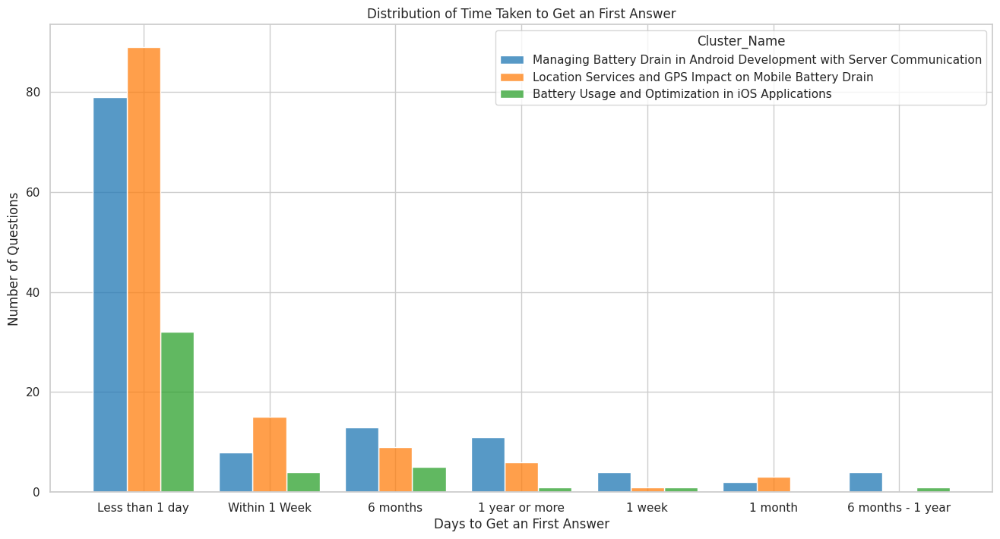

In [ ]:
plt.figure(figsize=(16, 8))

sns.histplot(data=df_first_answer, x='date_ans_diff_range', hue='Cluster_Name', multiple="dodge", shrink=.8, palette="tab10")

plt.xlabel("Days to Get an First Answer")
plt.ylabel("Number of Questions")
plt.title("Distribution of Time Taken to Get an First Answer")

# Show plot
plt.show()

In [ ]:
df_first_answer['date_ans_diff_range'].dtypes

CategoricalDtype(categories=['Less than 1 day', 'Within 1 Week', '6 months',
                  '1 year or more', '1 week', '1 month', '6 months - 1 year'],
, ordered=True, categories_dtype=object)

In [ ]:
df_first_answer_new = df_first_answer.groupby(['Cluster', 'date_ans_diff_range'])['answer_count'].sum()
df_first_answer_new

<ipython-input-108-54d3b0e33224>:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_first_answer_new = df_first_answer.groupby(['Cluster', 'date_ans_diff_range'])['answer_count'].sum()


Cluster  date_ans_diff_range
0        Less than 1 day        151
         Within 1 Week           22
         6 months                16
         1 year or more           8
         1 week                   1
         1 month                  4
         6 months - 1 year        0
1        Less than 1 day         47
         Within 1 Week            5
         6 months                 7
         1 year or more          20
         1 week                   1
         1 month                  0
         6 months - 1 year        1
2        Less than 1 day        109
         Within 1 Week           15
         6 months                21
         1 year or more          20
         1 week                  10
         1 month                  7
         6 months - 1 year        7
Name: answer_count, dtype: int64

In [ ]:
df_first_answer_new = df_first_answer.groupby(['Cluster', 'date_ans_diff_range'])['answer_count'].sum().reset_index()
total_answer_counts = df_first_answer.groupby("Cluster")["answer_count"].sum().reset_index()
total_answer_counts.rename(columns={"answer_count": "Total_Answer_Count"}, inplace=True)
df_first_answer_new = df_first_answer_new.merge(total_answer_counts, on="Cluster", how="left")
df_first_answer_new

<ipython-input-109-6ac3101cde02>:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_first_answer_new = df_first_answer.groupby(['Cluster', 'date_ans_diff_range'])['answer_count'].sum().reset_index()


,Cluster,date_ans_diff_range,answer_count,Total_Answer_Count
0,0,Less than 1 day,151,202
1,0,Within 1 Week,22,202
2,0,6 months,16,202
3,0,1 year or more,8,202
4,0,1 week,1,202
5,0,1 month,4,202
6,0,6 months - 1 year,0,202
7,1,Less than 1 day,47,81
8,1,Within 1 Week,5,81
9,1,6 months,7,81


In [ ]:
df_first_answer_new['percent_first_answer_date'] = (df_first_answer_new['answer_count']/df_first_answer_new['Total_Answer_Count'])*100
df_first_answer_new.set_index(['Cluster','date_ans_diff_range'], inplace=True)
df_first_answer_new

answer_count  Total_Answer_Count  \
Cluster date_ans_diff_range                                     
0       Less than 1 day               151                 202   
        Within 1 Week                  22                 202   
        6 months                       16                 202   
        1 year or more                  8                 202   
        1 week                          1                 202   
        1 month                         4                 202   
        6 months - 1 year               0                 202   
1       Less than 1 day                47                  81   
        Within 1 Week                   5                  81   
        6 months                        7                  81   
        1 year or more                 20                  81   
        1 week                          1                  81   
        1 month                         0                  81   
        6 months - 1 year               1                  81   
2       Less than 1 day               109                 189   
        Within 1 Week                  15                 189   
        6 months                       21                 189   
        1 year or more                 20                 189   
        1 week                         10                 189   
        1 month                         7                 189   
        6 months - 1 year               7                 189   

                             percent_first_answer_date  
Cluster date_ans_diff_range                             
0       Less than 1 day                      74.752475  
        Within 1 Week                        10.891089  
        6 months                              7.920792  
        1 year or more                        3.960396  
        1 week                                0.495050  
        1 month                               1.980198  
        6 months - 1 year                     0.000000  
1       Less than 1 day                      58.024691  
        Within 1 Week                         6.172840  
        6 months                              8.641975  
        1 year or more                       24.691358  
        1 week                                1.234568  
        1 month                               0.000000  
        6 months - 1 year                     1.234568  
2       Less than 1 day                      57.671958  
        Within 1 Week                         7.936508  
        6 months                             11.111111  
        1 year or more                       10.582011  
        1 week                                5.291005  
        1 month                               3.703704  
        6 months - 1 year                     3.703704

**6. Average Answer By Cluster**

In [ ]:
df_answer = df_final.drop_duplicates(subset=['title'], keep='first')
df_answer = df_answer[['title','answer_count','Cluster','Cluster_Name']]
df_answer

,title,answer_count,Cluster,Cluster_Name
0,Acquiring GPS data from mobile browser,1,2,Managing Battery Drain in Android Development ...
1,"Activity, service or fragment?",1,0,Location Services and GPS Impact on Mobile Bat...
2,ActivityRecognitionAPI keeps sending pending i...,1,0,Location Services and GPS Impact on Mobile Bat...
3,AlarmManager RTC_WAKEUP drains battery,1,0,Location Services and GPS Impact on Mobile Bat...
4,AlarmManager with notification not firing,1,0,Location Services and GPS Impact on Mobile Bat...
...,...,...,...,...
933,service that will run and stop automatically i...,1,2,Managing Battery Drain in Android Development ...
935,smart phone bratinger app,2,2,Managing Battery Drain in Android Development ...
937,startMonitoringSignificantLocationChanges call...,1,2,Managing Battery Drain in Android Development ...
938,"swift iOS , location manager startUpdatingLoca...",0,2,Managing Battery Drain in Android Development ...


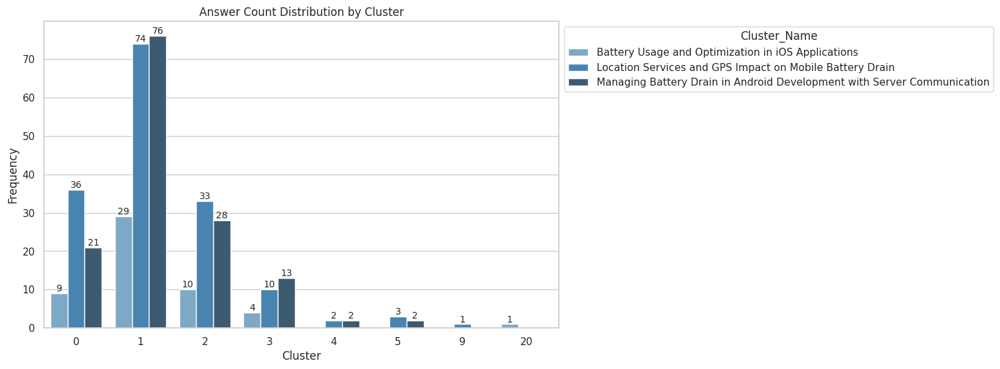

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

answer_count_unique = df_answer.groupby(['Cluster_Name', 'answer_count']).size().reset_index(name='count')
plt.figure(figsize=(10, 6))

ax = sns.barplot(x='answer_count', y='count', hue='Cluster_Name', data=answer_count_unique, palette='Blues_d')

plt.xlabel('Cluster')
plt.ylabel('Frequency')
plt.title('Answer Count Distribution by Cluster')
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))

ax.bar_label(ax.containers[0], fontsize=10)
ax.bar_label(ax.containers[1], fontsize=10)
ax.bar_label(ax.containers[2], fontsize=10)

plt.show()


In [ ]:
answer_count_unique

,Cluster_Name,answer_count,count
0,Battery Usage and Optimization in iOS Applicat...,0,9
1,Battery Usage and Optimization in iOS Applicat...,1,29
2,Battery Usage and Optimization in iOS Applicat...,2,10
3,Battery Usage and Optimization in iOS Applicat...,3,4
4,Battery Usage and Optimization in iOS Applicat...,20,1
5,Location Services and GPS Impact on Mobile Bat...,0,36
6,Location Services and GPS Impact on Mobile Bat...,1,74
7,Location Services and GPS Impact on Mobile Bat...,2,33
8,Location Services and GPS Impact on Mobile Bat...,3,10
9,Location Services and GPS Impact on Mobile Bat...,4,2


In [ ]:
for i in range(3):
  print(f"Cluster {i}: {', '.join(map(str, df_answer[df_answer['Cluster'] == i]['answer_count'].unique()))}")

Cluster 0: 1, 0, 3, 2, 5, 9, 4
Cluster 1: 1, 2, 3, 0, 20
Cluster 2: 1, 0, 2, 3, 5, 4


In [ ]:
mean_average = df_answer.groupby('Cluster_Name')['answer_count'].mean().reset_index()
mean_average['index'] = mean_average.index
mean_average

,Cluster_Name,answer_count,index
0,Battery Usage and Optimization in iOS Applicat...,1.528302,0
1,Location Services and GPS Impact on Mobile Bat...,1.270440,1
2,Managing Battery Drain in Android Development ...,1.330986,2


<ipython-input-116-21aafe45c036>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x='index', y='answer_count', data=mean_average, palette='Blues_d')


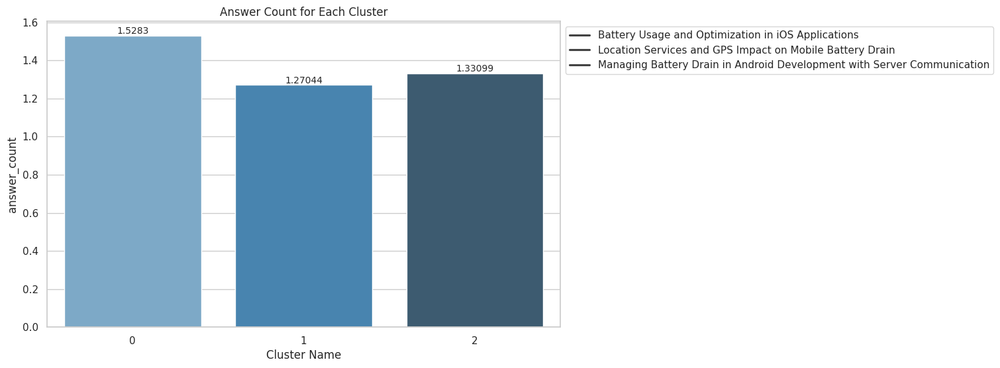

In [ ]:
plt.figure(figsize=(10, 6))
ax = sns.barplot(x='index', y='answer_count', data=mean_average, palette='Blues_d')

plt.xlabel('Cluster Name')
plt.title('Answer Count for Each Cluster')
ax.bar_label(ax.containers[0], fontsize=10)
ax.bar_label(ax.containers[1], fontsize=10)
ax.bar_label(ax.containers[2], fontsize=10)

plt.legend(mean_average['Cluster_Name'], loc='upper left', bbox_to_anchor=(1, 1))

with comment

In [ ]:
df_answer_comment = df_final.drop_duplicates(subset=['answer_body'], keep='first')
df_answer_comment = df_answer_comment[['title', 'answer_count', 'comment_count', 'answer_body', 'answer_comment_count', 'Cluster', 'Cluster_Name']]
df_answer_comment

,title,answer_count,comment_count,answer_body,answer_comment_count,Cluster,Cluster_Name
0,Acquiring GPS data from mobile browser,1,4,<p>As far as I know you can't do that. Browser...,0,2,Managing Battery Drain in Android Development ...
1,"Activity, service or fragment?",1,0,"<p>service - for background work, receiver for...",1,0,Location Services and GPS Impact on Mobile Bat...
2,ActivityRecognitionAPI keeps sending pending i...,1,0,<p>As per the documentation: </p>\n\n<blockquo...,0,0,Location Services and GPS Impact on Mobile Bat...
3,AlarmManager RTC_WAKEUP drains battery,1,1,"<p>Try with only <strong>RTC</strong>, because...",0,0,Location Services and GPS Impact on Mobile Bat...
4,AlarmManager with notification not firing,1,2,"<p>Ok, turns out the example I was looking at ...",0,0,Location Services and GPS Impact on Mobile Bat...
...,...,...,...,...,...,...,...
932,running an NSTimer in the background of a mult...,1,0,"<p>The answer to <a href=""https://stackoverflo...",0,2,Managing Battery Drain in Android Development ...
933,service that will run and stop automatically i...,1,0,<p>You can user <code>AlarmManager</code> Clas...,2,2,Managing Battery Drain in Android Development ...
935,smart phone bratinger app,2,1,<p>You dont need to run background service to ...,0,2,Managing Battery Drain in Android Development ...
936,smart phone bratinger app,2,1,<p>You are right: if you run a service that ch...,1,2,Managing Battery Drain in Android Development ...


In [ ]:
result = df_answer_comment.groupby('title').agg({
    'answer_count': 'first',
    'comment_count': 'first',
    'answer_comment_count': 'sum',
    'Cluster': 'first',
    'Cluster_Name': 'first'
}).reset_index()

In [ ]:
result = result.assign(all_comment_count = lambda x: (x['comment_count'] + x['answer_comment_count']+ x['answer_count']))
result

,title,answer_count,comment_count,answer_comment_count,Cluster,Cluster_Name,all_comment_count
0,Acquiring GPS data from mobile browser,1,4,0,2,Managing Battery Drain in Android Development ...,5
1,"Activity, service or fragment?",1,0,1,0,Location Services and GPS Impact on Mobile Bat...,2
2,ActivityRecognitionAPI keeps sending pending i...,1,0,0,0,Location Services and GPS Impact on Mobile Bat...,1
3,AlarmManager RTC_WAKEUP drains battery,1,1,0,0,Location Services and GPS Impact on Mobile Bat...,2
4,AlarmManager with notification not firing,1,2,0,0,Location Services and GPS Impact on Mobile Bat...,3
...,...,...,...,...,...,...,...
284,requestLocationUpdates parameters having no ef...,2,0,2,2,Managing Battery Drain in Android Development ...,4
285,running an NSTimer in the background of a mult...,1,0,0,2,Managing Battery Drain in Android Development ...,1
286,service that will run and stop automatically i...,1,0,2,2,Managing Battery Drain in Android Development ...,3
287,smart phone bratinger app,2,1,1,2,Managing Battery Drain in Android Development ...,4


In [ ]:
answer_count_unique = result.groupby(['Cluster_Name', 'Cluster','all_comment_count']).size().reset_index(name='count')
answer_count_unique

,Cluster_Name,Cluster,all_comment_count,count
0,Battery Usage and Optimization in iOS Applicat...,1,1,9
1,Battery Usage and Optimization in iOS Applicat...,1,2,5
2,Battery Usage and Optimization in iOS Applicat...,1,3,2
3,Battery Usage and Optimization in iOS Applicat...,1,4,5
4,Battery Usage and Optimization in iOS Applicat...,1,5,3
5,Battery Usage and Optimization in iOS Applicat...,1,6,6
6,Battery Usage and Optimization in iOS Applicat...,1,7,4
7,Battery Usage and Optimization in iOS Applicat...,1,8,2
8,Battery Usage and Optimization in iOS Applicat...,1,9,2
9,Battery Usage and Optimization in iOS Applicat...,1,10,1


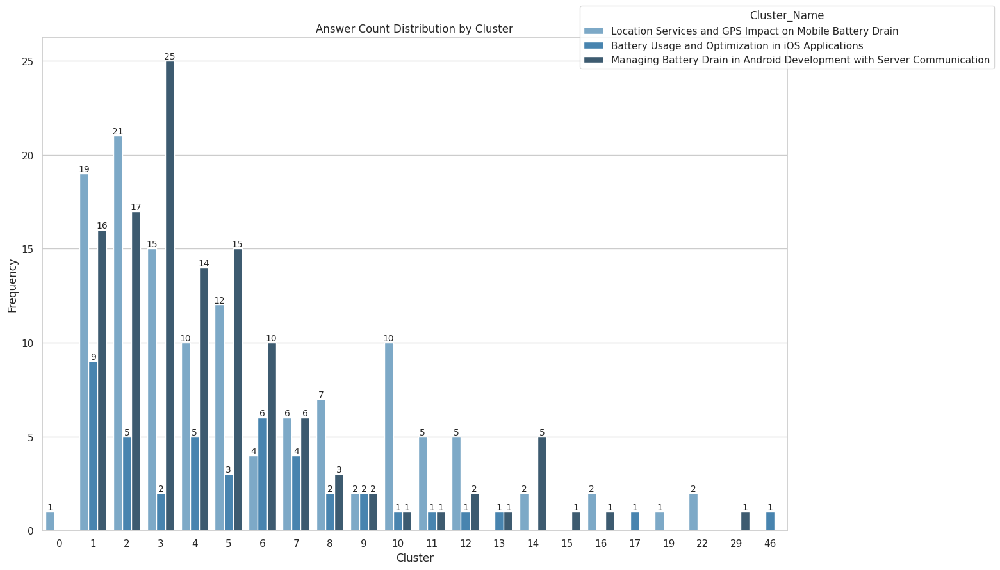

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

plt.figure(figsize=(15, 10))

ax = sns.barplot(x='all_comment_count', y='count', hue='Cluster_Name', data=answer_count_unique, palette='Blues_d')

plt.xlabel('Cluster')
plt.ylabel('Frequency')
plt.title('Answer Count Distribution by Cluster')
sns.move_legend(ax, "center", bbox_to_anchor=(1, 1))

ax.bar_label(ax.containers[0], fontsize=10)
ax.bar_label(ax.containers[1], fontsize=10)
ax.bar_label(ax.containers[2], fontsize=10)

plt.show()

<ipython-input-122-a371a35b2319>:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
<ipython-input-122-a371a35b2319>:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
<ipython-input-122-a371a35b2319>:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


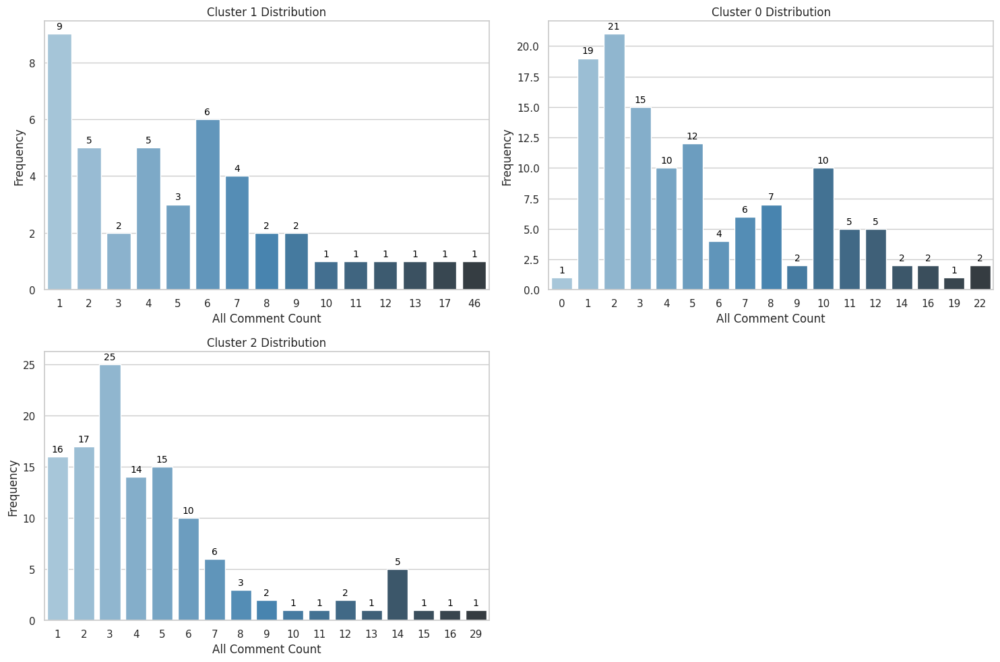

In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(15, 10))
axes = axes.flatten()

clusters = answer_count_unique['Cluster'].unique()

for i, cluster in enumerate(clusters):
    cluster_data = answer_count_unique[answer_count_unique['Cluster'] == cluster]
    count_data = cluster_data.groupby('all_comment_count')['count'].sum()

    # Create barplot
    sns.barplot(
        x=count_data.index,
        y=count_data.values,
        ax=axes[i],
        palette='Blues_d'
    )

    axes[i].set_xlabel('All Comment Count')
    axes[i].set_ylabel('Frequency')
    axes[i].set_title(f'Cluster {cluster} Distribution')

    # Add value labels on top of bars
    for p in axes[i].patches:
        axes[i].annotate(
            f'{p.get_height():.0f}',
            (p.get_x() + p.get_width() / 2., p.get_height()),
            ha='center', va='center',
            fontsize=10,
            color='black',
            xytext=(0, 8), textcoords='offset points'
        )

# Hide the last empty subplot
axes[3].axis('off')

plt.tight_layout()
plt.show()

In [ ]:
countttt = result.groupby('Cluster_Name')['all_comment_count'].mean().reset_index()
countttt['cluster'] = [0,1,2]
countttt

,Cluster_Name,all_comment_count,cluster
0,Battery Usage and Optimization in iOS Applicat...,6.068182,0
1,Location Services and GPS Impact on Mobile Bat...,5.516129,1
2,Managing Battery Drain in Android Development ...,4.859504,2


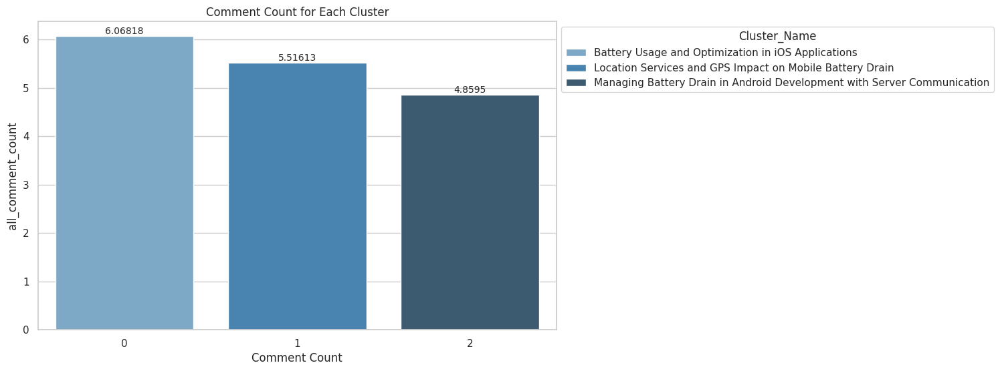

In [ ]:
plt.figure(figsize=(10, 6))
ax = sns.barplot(x='cluster', y='all_comment_count', hue = 'Cluster_Name', data=countttt, palette='Blues_d')

plt.xlabel('Comment Count')
plt.title('Comment Count for Each Cluster')
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
ax.bar_label(ax.containers[0], fontsize=10)
ax.bar_label(ax.containers[1], fontsize=10)
ax.bar_label(ax.containers[2], fontsize=10)

plt.show()

In [ ]:
for i in range(3):
  print(f"Cluster {i}: {', '.join(map(str, result[result['Cluster'] == i]['all_comment_count'].unique()))}")

Cluster 0: 2, 1, 3, 0, 12, 5, 11, 4, 10, 8, 7, 14, 6, 9, 16, 22, 19
Cluster 1: 1, 4, 9, 6, 2, 7, 8, 11, 10, 3, 5, 46, 13, 12, 17
Cluster 2: 5, 8, 1, 4, 3, 9, 2, 7, 6, 15, 14, 11, 10, 29, 13, 12, 16


**7. คนที่มาคอมเมนท์ปัญหาที่ถูกโพสต์ไว้เป็นคน Id หรือ ชื่อ ซ้ำๆหรือป่าวใน Same Cluster**

In [ ]:
df_uniq_ans = df_final.drop_duplicates(subset=['answer_body'], keep='first')

# Identify consecutive duplicates based on 'title' and 'answer_owner_username'
mask = (df_uniq_ans['title'] == df_uniq_ans['title'].shift(-1)) & \
       (df_uniq_ans['answer_owner_username'] == df_uniq_ans['answer_owner_username'].shift(-1))

# Keep only rows where the mask is False (i.e., not consecutive duplicates)
df_uniq_ans = df_uniq_ans[~mask].reset_index(drop=True)

df_uniq_ans

,title,post_body,owner_username,tags,view_count,favourite_count,post_score,creation_date,last_activity_date,answer_count,...,comment_create_date_year,comment_create_date_time,Cluster,Cluster_Name,tag_1_cluster_name,tag_2_cluster_name,tag_3_cluster_name,tag_4_cluster_name,tag_5_cluster_name,tag_cluster_name_list
0,Acquiring GPS data from mobile browser,Im working on a project where Im supposed to g...,Kevin Zero,browser|background|refresh,77,0,-1,2015-04-22 09:51:53,2015-04-24 14:53:47,1,...,0,0,2,Managing Battery Drain in Android Development ...,Internet & Technology,Design Elements,Browser Actions,NaN,NaN,"[Internet & Technology, Design Elements, Brows..."
1,"Activity, service or fragment?",I am writing an app which needs to monitor the...,Saurabh Kumar,android|performance|android-intent|android-fra...,126,0,0,2013-08-28 01:32:27,2013-08-28 03:07:58,1,...,2013,08:25:35,0,Location Services and GPS Impact on Mobile Bat...,Android Development,Entertainment,Android Development,Android Development,Alarm and Alert Systems,"[Android Development, Entertainment, Android D..."
2,ActivityRecognitionAPI keeps sending pending i...,I am using ActivityRecognitionAPI in Android t...,Max Testing,android|activity-recognition,104,0,0,2015-06-02 00:10:42,2015-06-29 18:23:08,1,...,0,0,0,Location Services and GPS Impact on Mobile Bat...,Android Development,Technology & Software,NaN,NaN,NaN,"[Android Development, Technology & Software]"
3,AlarmManager RTC_WAKEUP drains battery,I have a service running in the background whi...,user2189878,android|android-service|alarmmanager,794,1,1,2016-05-02 07:31:48,2017-07-19 11:54:12,1,...,0,0,0,Location Services and GPS Impact on Mobile Bat...,Android Development,Android Service Management,Alarm and Alert Systems,NaN,NaN,"[Android Development, Android Service Manageme..."
4,AlarmManager with notification not firing,Im making an app with a persistent notificatio...,Calvin Li,android|android-studio|alarmmanager|android-no...,754,0,1,2015-03-12 23:36:37,2015-03-13 07:02:58,1,...,0,0,0,Location Services and GPS Impact on Mobile Bat...,Android Development,Android Development,Alarm and Alert Systems,Mobile Notifications,NaN,"[Android Development, Android Development, Ala..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
464,running an NSTimer in the background of a mult...,i am attempting to make an app that records an...,dave,iphone|multithreading|background|location|nstimer,2905,1,0,2010-08-04 22:03:15,2011-02-07 13:48:22,1,...,0,0,2,Managing Battery Drain in Android Development ...,iOS Development,Programming Concepts,Design Elements,Location and Navigation Services,Timing Tools,"[iOS Development, Programming Concepts, Design..."
465,service that will run and stop automatically i...,need a service that will run in background and...,Humayun Kabir,android|service,1243,0,0,2012-07-16 02:38:06,2012-07-16 06:53:20,1,...,2012,07:34:56,2,Managing Battery Drain in Android Development ...,Android Development,Android Service Management,NaN,NaN,NaN,"[Android Development, Android Service Management]"
466,smart phone bratinger app,I want to make an android application that whe...,Mariam,android,70,0,1,2012-10-08 12:42:39,2012-10-08 13:02:14,2,...,0,0,2,Managing Battery Drain in Android Development ...,Android Development,NaN,NaN,NaN,NaN,[Android Development]
467,smart phone bratinger app,I want to make an android application that whe...,Mariam,android,70,0,1,2012-10-08 12:42:39,2012-10-08 13:02:14,2,...,2012,18:00:55,2,Managing Battery Drain in Android Development ...,Android Development,NaN,NaN,NaN,NaN,[Android Development]


In [ ]:
cluster_counts = df_uniq_ans.groupby(["Cluster_Name", "answer_owner_username"]).size().reset_index(name="count")
cluster_counts

,Cluster_Name,answer_owner_username,count
0,Battery Usage and Optimization in iOS Applicat...,207,1
1,Battery Usage and Optimization in iOS Applicat...,8bitwide,1
2,Battery Usage and Optimization in iOS Applicat...,Arash Hatami,1
3,Battery Usage and Optimization in iOS Applicat...,Athul Harikumar,1
4,Battery Usage and Optimization in iOS Applicat...,BoD,1
...,...,...,...
438,Managing Battery Drain in Android Development ...,victoriza,1
439,Managing Battery Drain in Android Development ...,vishiphone,1
440,Managing Battery Drain in Android Development ...,wakaka,1
441,Managing Battery Drain in Android Development ...,wasyl,1


In [ ]:
c0_counts = cluster_counts[cluster_counts['Cluster_Name'] == 'Location Services and GPS Impact on Mobile Battery Drain'][['answer_owner_username','count']]
c1_counts = cluster_counts[cluster_counts['Cluster_Name'] == 'Battery Usage and Optimization in iOS Applications'][['answer_owner_username','count']]
c2_counts = cluster_counts[cluster_counts['Cluster_Name'] == 'Managing Battery Drain in Android Development with Server Communication'][['answer_owner_username','count']]

In [ ]:
c2_counts.count()

,0
answer_owner_username,176
count,176


In [ ]:
c0_counts = c0_counts.sort_values(by="count", ascending=False).head(10)
c1_counts = c1_counts.sort_values(by="count", ascending=False).head(10)
c2_counts = c2_counts.sort_values(by="count", ascending=False).head(10)

<ipython-input-131-10bc414c4644>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x='answer_owner_username', y='count', data=c0_counts, palette='Blues_d')


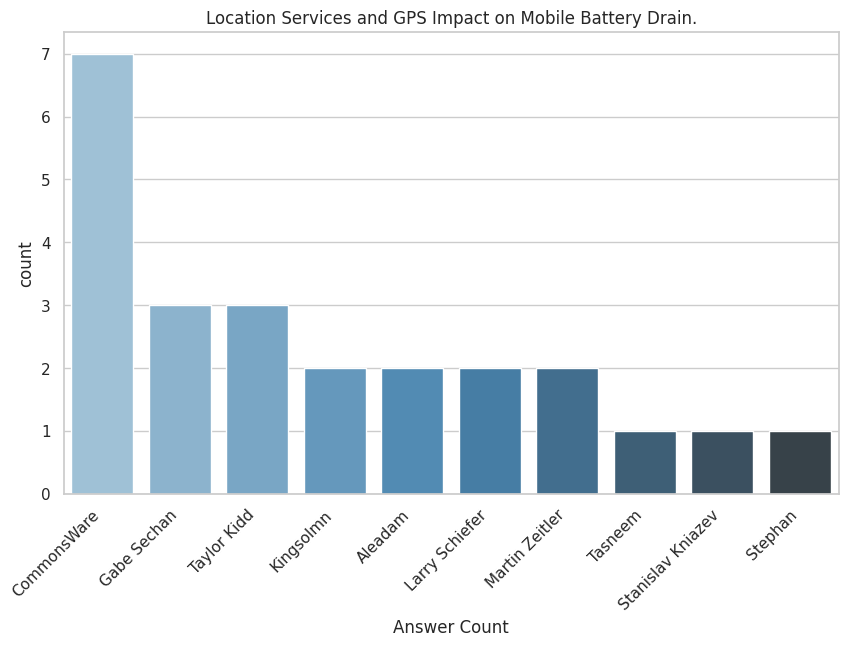

In [ ]:
plt.figure(figsize=(10, 6))
ax = sns.barplot(x='answer_owner_username', y='count', data=c0_counts, palette='Blues_d')

plt.xlabel('Answer Count')
plt.title('Location Services and GPS Impact on Mobile Battery Drain.')
plt.xticks(rotation=45, ha="right")

plt.show()

<ipython-input-132-4a57e2c606d5>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x='answer_owner_username', y='count', data=c1_counts, palette='Blues_d')


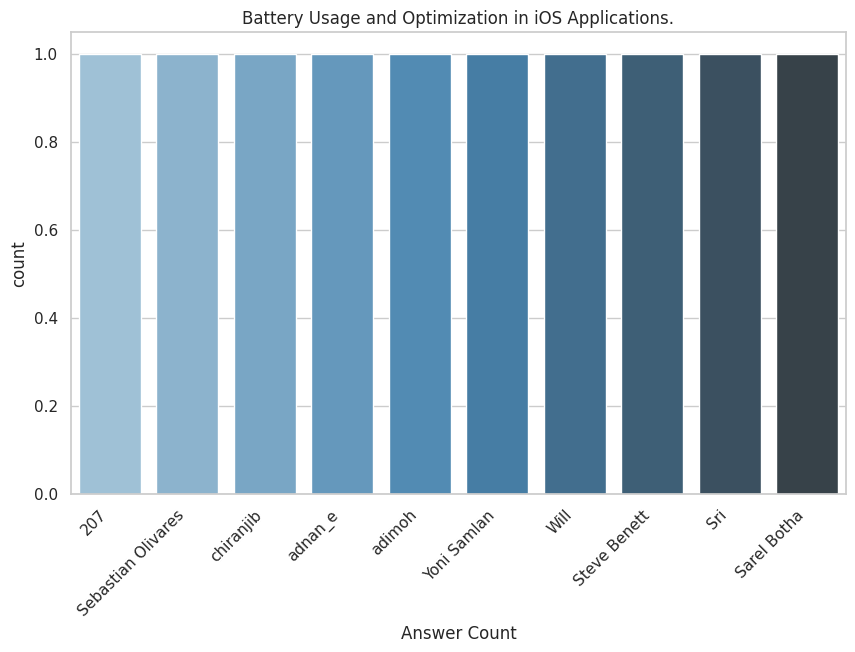

In [ ]:
plt.figure(figsize=(10, 6))
ax = sns.barplot(x='answer_owner_username', y='count', data=c1_counts, palette='Blues_d')

plt.xlabel('Answer Count')
plt.title('Battery Usage and Optimization in iOS Applications.')
plt.xticks(rotation=45, ha="right")

plt.show()

<ipython-input-133-786ff6e76735>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x='answer_owner_username', y='count', data=c2_counts, palette='Blues_d')


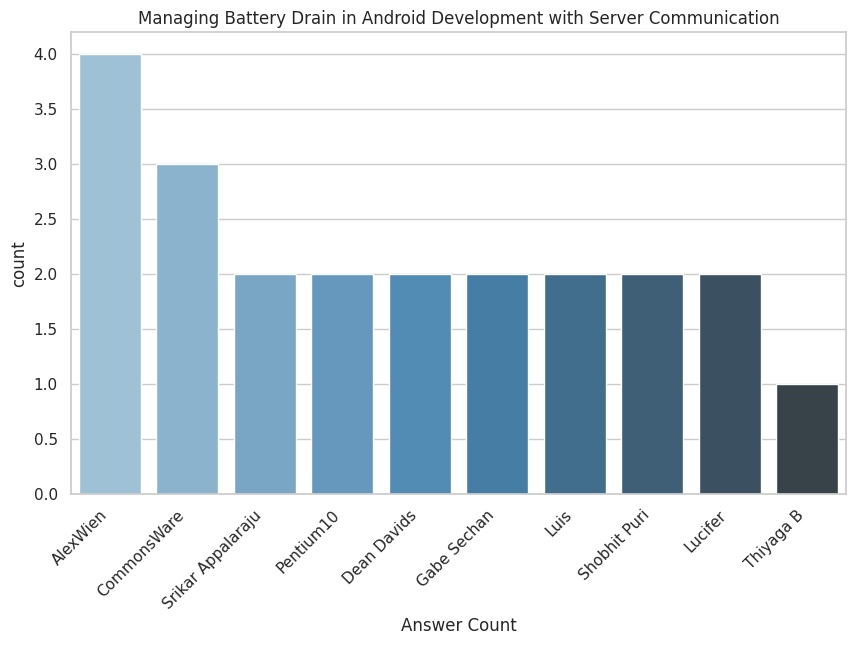

In [ ]:
plt.figure(figsize=(10, 6))
ax = sns.barplot(x='answer_owner_username', y='count', data=c2_counts, palette='Blues_d')

plt.xlabel('Answer Count')
plt.title('Managing Battery Drain in Android Development with Server Communication')
plt.xticks(rotation=45, ha="right")

plt.show()

นับรวมของ battery drain (cluster ทั้งหมด)

In [ ]:
cluster_counts = df_uniq_ans.groupby("answer_owner_username").size().reset_index(name="count")
cluster_counts = cluster_counts.sort_values(by="count", ascending=False).head(10)
cluster_counts

,answer_owner_username,count
58,CommonsWare,10
104,Gabe Sechan,5
15,AlexWien,4
294,Taylor Kidd,3
64,David Wasser,3
300,Tim,2
422,user207616,2
153,Kingsolmn,2
178,Martin Zeitler,2
342,cgr,2


<ipython-input-135-2a20e8c5482d>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x='answer_owner_username', y='count', data=cluster_counts, palette='Blues_d')


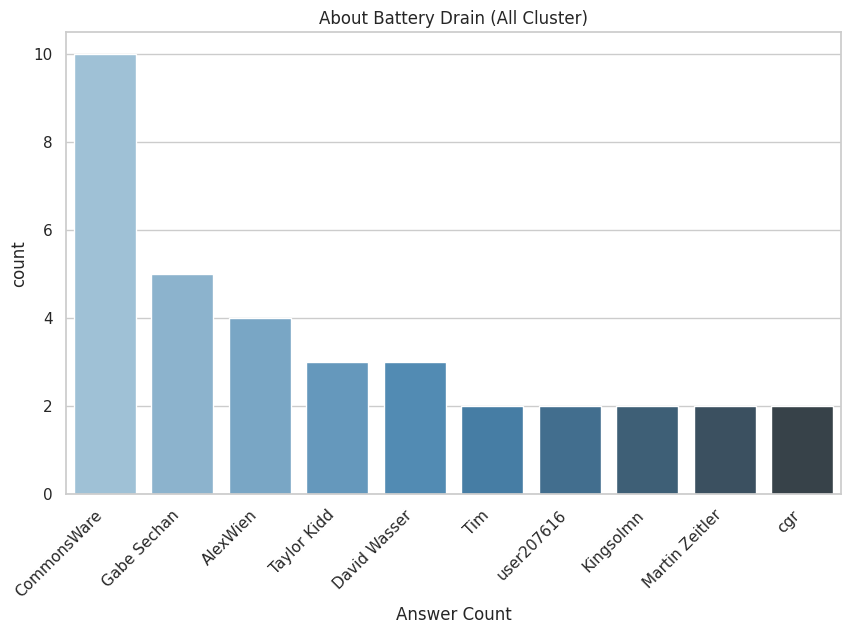

In [ ]:
plt.figure(figsize=(10, 6))
ax = sns.barplot(x='answer_owner_username', y='count', data=cluster_counts, palette='Blues_d')

plt.xlabel('Answer Count')
plt.title('About Battery Drain (All Cluster)')
plt.xticks(rotation=45, ha="right")

plt.show()

**8. Non-Accepted and non Answer Posts**

Accepted Answer

In [ ]:
list_posts = df_final.groupby('Cluster')['title'].nunique().reset_index()
list_posts.set_index('Cluster', inplace=True)
# list_posts.drop(columns=['Cluster'], inplace=True)
list_posts_accept = accepted_answer.groupby('Cluster')['title'].nunique().reset_index()
list_posts['accepted_posts'] = list_posts_accept['title']
list_posts.rename(columns = {'title':'all_posts',}, inplace = True)
list_posts.loc['Total'] = list_posts.sum()
list_posts['percent'] = (list_posts['accepted_posts']/list_posts['all_posts'])*100
list_posts

,all_posts,accepted_posts,percent
Cluster,,,
0,159,56,35.220126
1,53,25,47.169811
2,142,57,40.140845
Total,354,138,38.983051


Answered, Accepted-Answered

In [ ]:
unique_post = df_final.drop_duplicates(subset=['title'], keep='first')

In [ ]:
non_accept = unique_post[unique_post['answer_count'] > 0]
# non_accept['accepted_answer'] = non_accept['accepted_answer'].replace('None',0)
non_accept = non_accept[non_accept['accepted_answer'] == 'None']
non_accept

,title,post_body,owner_username,tags,view_count,favourite_count,post_score,creation_date,last_activity_date,answer_count,...,comment_create_date_year,comment_create_date_time,Cluster,Cluster_Name,tag_1_cluster_name,tag_2_cluster_name,tag_3_cluster_name,tag_4_cluster_name,tag_5_cluster_name,tag_cluster_name_list
0,Acquiring GPS data from mobile browser,Im working on a project where Im supposed to g...,Kevin Zero,browser|background|refresh,77,0,-1,2015-04-22 09:51:53,2015-04-24 14:53:47,1,...,0,0,2,Managing Battery Drain in Android Development ...,Internet & Technology,Design Elements,Browser Actions,NaN,NaN,"[Internet & Technology, Design Elements, Brows..."
1,"Activity, service or fragment?",I am writing an app which needs to monitor the...,Saurabh Kumar,android|performance|android-intent|android-fra...,126,0,0,2013-08-28 01:32:27,2013-08-28 03:07:58,1,...,2013,08:25:35,0,Location Services and GPS Impact on Mobile Bat...,Android Development,Entertainment,Android Development,Android Development,Alarm and Alert Systems,"[Android Development, Entertainment, Android D..."
2,ActivityRecognitionAPI keeps sending pending i...,I am using ActivityRecognitionAPI in Android t...,Max Testing,android|activity-recognition,104,0,0,2015-06-02 00:10:42,2015-06-29 18:23:08,1,...,0,0,0,Location Services and GPS Impact on Mobile Bat...,Android Development,Technology & Software,NaN,NaN,NaN,"[Android Development, Technology & Software]"
3,AlarmManager RTC_WAKEUP drains battery,I have a service running in the background whi...,user2189878,android|android-service|alarmmanager,794,1,1,2016-05-02 07:31:48,2017-07-19 11:54:12,1,...,0,0,0,Location Services and GPS Impact on Mobile Bat...,Android Development,Android Service Management,Alarm and Alert Systems,NaN,NaN,"[Android Development, Android Service Manageme..."
4,AlarmManager with notification not firing,Im making an app with a persistent notificatio...,Calvin Li,android|android-studio|alarmmanager|android-no...,754,0,1,2015-03-12 23:36:37,2015-03-13 07:02:58,1,...,0,0,0,Location Services and GPS Impact on Mobile Bat...,Android Development,Android Development,Alarm and Alert Systems,Mobile Notifications,NaN,"[Android Development, Android Development, Ala..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
911,ios: How to restart app when it terminated in ...,I write app for use in auto which works in bac...,klvd57,ios|background|gps|location,1155,1,0,2015-02-19 08:30:56,2015-07-20 22:00:08,1,...,0,0,2,Managing Battery Drain in Android Development ...,iOS Development,Design Elements,Location and Navigation Services,Location and Navigation Services,NaN,"[iOS Development, Design Elements, Location an..."
912,iphone - Battery using startMonitoringSignific...,Im developing a localization app that runs in ...,subharb,iphone|localization|power-management,634,0,0,2012-03-31 11:54:24,2012-10-26 07:49:20,2,...,0,0,2,Managing Battery Drain in Android Development ...,iOS Development,Software Development,Energy Efficiency,NaN,NaN,"[iOS Development, Software Development, Energy..."
915,keep service alive in android,I have created an Android service which basica...,Harald Tempelman,java|android|service|keep-alive,2494,1,0,2011-07-28 10:20:51,2016-07-17 20:36:50,4,...,2011,11:01:46,0,Location Services and GPS Impact on Mobile Bat...,Programming Languages,Android Development,Android Service Management,Networking Terms,NaN,"[Programming Languages, Android Development, A..."
928,recieving location updates after app is termin...,I need to keep track of the user location all ...,Liatz,cllocationmanager|cllocation,10728,4,5,2012-06-11 09:42:44,2014-12-11 17:10:35,1,...,2019,14:55:26,2,Managing Battery Drain in Android Development ...,Location and Navigation Services,Location and Navigation Services,NaN,NaN,NaN,"[Location and Navigation Services, Location an..."


In [ ]:
non_accept['accepted_answer'].unique()

array(['None'], dtype=object)

In [ ]:
non_ans = unique_post[unique_post['answer_count'] == 0]
non_ans

,title,post_body,owner_username,tags,view_count,favourite_count,post_score,creation_date,last_activity_date,answer_count,...,comment_create_date_year,comment_create_date_time,Cluster,Cluster_Name,tag_1_cluster_name,tag_2_cluster_name,tag_3_cluster_name,tag_4_cluster_name,tag_5_cluster_name,tag_cluster_name_list
6,Android - Activity Recognition best practices,In my Android application I want to display a ...,Christian,android|android-googleapiclient|activity-recog...,549,2,4,2017-09-02 07:19:08,2017-09-02 07:39:05,0,...,0,0,0,Location Services and GPS Impact on Mobile Bat...,Android Development,Android Development,Technology & Software,NaN,NaN,"[Android Development, Android Development, Tec..."
8,Android - Fused location with balanced profile,in my application i need to track the position...,EmbeddedLab,android|location|battery,188,0,2,2014-11-11 20:37:39,2014-11-11 20:37:39,0,...,0,0,2,Managing Battery Drain in Android Development ...,Android Development,Location and Navigation Services,Power Management,NaN,NaN,"[Android Development, Location and Navigation ..."
10,"Android - Inflate view, runnable or animations...",I am building a game where i do some things in...,Sir NIkolay Cesar The First,java|android|multithreading|animation,382,0,1,2013-10-25 15:03:05,2013-10-25 15:27:22,0,...,0,0,0,Location Services and GPS Impact on Mobile Bat...,Programming Languages,Android Development,Programming Concepts,Game Development and Design,NaN,"[Programming Languages, Android Development, P..."
17,Android - read all sensors every X minutes,I need to read all the device sensors in my ap...,RPallas,java|android|service|alarmmanager|sensors,391,0,1,2014-02-09 12:20:44,2015-12-01 18:15:18,0,...,0,0,0,Location Services and GPS Impact on Mobile Bat...,Programming Languages,Android Development,Android Service Management,Alarm and Alert Systems,Technology & Electronics,"[Programming Languages, Android Development, A..."
18,Android 5.0 - how to wake up device display? S...,Question Since there is only one WakeLock left...,Julian,android|standby,250,0,1,2015-07-13 14:19:01,2015-07-13 14:19:01,0,...,0,0,0,Location Services and GPS Impact on Mobile Bat...,Android Development,Power Management Modes,NaN,NaN,NaN,"[Android Development, Power Management Modes]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
832,battery draining issue when widget is created ...,In my application I used the widget creation c...,Pinki,android|android-widget,144,0,2,2011-06-29 04:59:03,2012-10-17 12:59:59,0,...,0,0,0,Location Services and GPS Impact on Mobile Bat...,Android Development,Android Development,NaN,NaN,NaN,"[Android Development, Android Development]"
859,iOS long lasting animations drain battery?,Im building an app that has a gauge view with ...,pec1985,ios|iphone|animation|bluetooth,171,0,0,2017-04-06 15:36:54,2017-04-06 15:36:54,0,...,0,0,0,Location Services and GPS Impact on Mobile Bat...,iOS Development,iOS Development,Game Development and Design,Bluetooth Technology,NaN,"[iOS Development, iOS Development, Game Develo..."
909,ios - how to keep app running in background on...,Im using location background mode but that mak...,Firas KADHUM,ios|background|cllocationmanager,249,0,0,2015-03-21 03:50:33,2015-03-21 03:50:33,0,...,0,0,2,Managing Battery Drain in Android Development ...,iOS Development,Design Elements,Location and Navigation Services,NaN,NaN,"[iOS Development, Design Elements, Location an..."
938,"swift iOS , location manager startUpdatingLoca...",I would like to start updating the location di...,StephanD,ios|swift|location,287,1,2,2016-12-02 22:18:42,2016-12-02 22:18:42,0,...,0,0,2,Managing Battery Drain in Android Development ...,iOS Development,Programming Languages,Location and Navigation Services,NaN,NaN,"[iOS Development, Programming Languages, Locat..."


In [ ]:
list_posts_na = df_final.groupby('Cluster')['title'].nunique().reset_index()
list_posts_na.set_index('Cluster', inplace=True)
# list_posts_na.drop(columns=['Cluster'], inplace=True)
list_posts_nonaccept = non_accept.groupby('Cluster')['title'].nunique().reset_index()
list_posts_nonans = non_ans.groupby('Cluster')['title'].nunique().reset_index()
list_posts_na['non_accepted_posts'] = list_posts_nonaccept['title']
list_posts_na['non_ans_posts'] = list_posts_nonans['title']
list_posts_na.rename(columns = {'title':'all_posts'}, inplace = True)
list_posts_na = pd.concat([list_posts[['all_posts', 'accepted_posts']][0:3], list_posts_na[['non_accepted_posts', 'non_ans_posts']]], axis=1).reset_index()
list_posts_na.loc['Total'] = list_posts_na.sum()
list_posts_na['Accepted_percentage'] = (list_posts_na['accepted_posts']/list_posts_na['all_posts'])*100
list_posts_na['Answered_percentage'] = (list_posts_na['non_accepted_posts']/list_posts_na['all_posts'])*100
list_posts_na['Unanswered_percentage'] = (list_posts_na['non_ans_posts']/list_posts_na['all_posts'])*100
list_posts_na.rename(columns = {'accepted_posts':'Accepted_ans','non_accepted_posts':'Answered','non_ans_posts':'Unanswered'}, inplace = True)
list_posts_na

,Cluster,all_posts,Accepted_ans,Answered,Unanswered,Accepted_percentage,Answered_percentage,Unanswered_percentage
0,0,159,56,67,36,35.220126,42.138365,22.641509
1,1,53,25,19,9,47.169811,35.849057,16.981132
2,2,142,57,64,21,40.140845,45.070423,14.788732
Total,3,354,138,150,66,38.983051,42.372881,18.644068


In [ ]:
list_posts_na_plot = list_posts_na.iloc[0:3]
list_posts_na_plot

,Cluster,all_posts,Accepted_ans,Answered,Unanswered,Accepted_percentage,Answered_percentage,Unanswered_percentage
0,0,159,56,67,36,35.220126,42.138365,22.641509
1,1,53,25,19,9,47.169811,35.849057,16.981132
2,2,142,57,64,21,40.140845,45.070423,14.788732


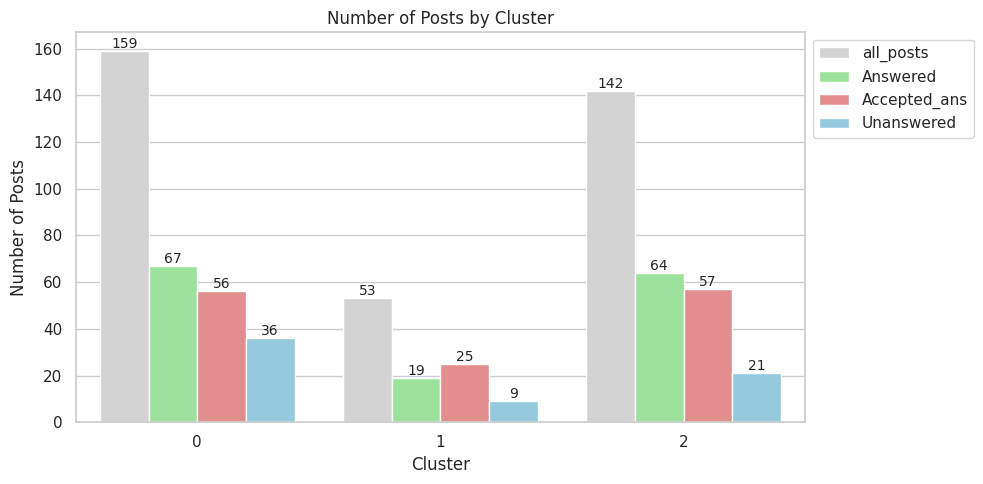

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 5))

melted_posts = list_posts_na_plot.melt(id_vars=['Cluster'],
                                       value_vars=['all_posts', 'Answered', 'Accepted_ans', 'Unanswered'],
                                       var_name='Post_Type', value_name='Number_of_Posts')

sns.barplot(data=melted_posts, x='Cluster', y='Number_of_Posts', hue='Post_Type', palette=['lightGrey', 'lightgreen', 'lightcoral', 'skyblue'])

plt.xlabel("Cluster")
plt.ylabel("Number of Posts")
plt.title("Number of Posts by Cluster")

plt.legend(loc='upper left', bbox_to_anchor=(1, 1))

for container in plt.gca().containers:
    plt.gca().bar_label(container, fontsize=10)

plt.tight_layout()
plt.show()

In [ ]:
Combined_all = pd.concat([list_posts[['all_posts', 'accepted_posts']][0:3], list_posts_na_plot[['Answered', 'Unanswered']]], axis=1)
Combined_all.loc['Total'] = Combined_all.sum()
Combined_all['Total_Posts'] = Combined_all[['accepted_posts','Answered', 'Unanswered']].sum(axis=1)
# Combined_all.set_index(['Cluster','all_posts'], inplace=True)
Combined_all

,all_posts,accepted_posts,Answered,Unanswered,Total_Posts
0,159,56,67,36,159
1,53,25,19,9,53
2,142,57,64,21,142
Total,354,138,150,66,354


**9. Average Post Length**

In [ ]:
unique_post

,title,post_body,owner_username,tags,view_count,favourite_count,post_score,creation_date,last_activity_date,answer_count,...,comment_create_date_year,comment_create_date_time,Cluster,Cluster_Name,tag_1_cluster_name,tag_2_cluster_name,tag_3_cluster_name,tag_4_cluster_name,tag_5_cluster_name,tag_cluster_name_list
0,Acquiring GPS data from mobile browser,Im working on a project where Im supposed to g...,Kevin Zero,browser|background|refresh,77,0,-1,2015-04-22 09:51:53,2015-04-24 14:53:47,1,...,0,0,2,Managing Battery Drain in Android Development ...,Internet & Technology,Design Elements,Browser Actions,NaN,NaN,"[Internet & Technology, Design Elements, Brows..."
1,"Activity, service or fragment?",I am writing an app which needs to monitor the...,Saurabh Kumar,android|performance|android-intent|android-fra...,126,0,0,2013-08-28 01:32:27,2013-08-28 03:07:58,1,...,2013,08:25:35,0,Location Services and GPS Impact on Mobile Bat...,Android Development,Entertainment,Android Development,Android Development,Alarm and Alert Systems,"[Android Development, Entertainment, Android D..."
2,ActivityRecognitionAPI keeps sending pending i...,I am using ActivityRecognitionAPI in Android t...,Max Testing,android|activity-recognition,104,0,0,2015-06-02 00:10:42,2015-06-29 18:23:08,1,...,0,0,0,Location Services and GPS Impact on Mobile Bat...,Android Development,Technology & Software,NaN,NaN,NaN,"[Android Development, Technology & Software]"
3,AlarmManager RTC_WAKEUP drains battery,I have a service running in the background whi...,user2189878,android|android-service|alarmmanager,794,1,1,2016-05-02 07:31:48,2017-07-19 11:54:12,1,...,0,0,0,Location Services and GPS Impact on Mobile Bat...,Android Development,Android Service Management,Alarm and Alert Systems,NaN,NaN,"[Android Development, Android Service Manageme..."
4,AlarmManager with notification not firing,Im making an app with a persistent notificatio...,Calvin Li,android|android-studio|alarmmanager|android-no...,754,0,1,2015-03-12 23:36:37,2015-03-13 07:02:58,1,...,0,0,0,Location Services and GPS Impact on Mobile Bat...,Android Development,Android Development,Alarm and Alert Systems,Mobile Notifications,NaN,"[Android Development, Android Development, Ala..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
933,service that will run and stop automatically i...,need a service that will run in background and...,Humayun Kabir,android|service,1243,0,0,2012-07-16 02:38:06,2012-07-16 06:53:20,1,...,2012,07:34:56,2,Managing Battery Drain in Android Development ...,Android Development,Android Service Management,NaN,NaN,NaN,"[Android Development, Android Service Management]"
935,smart phone bratinger app,I want to make an android application that whe...,Mariam,android,70,0,1,2012-10-08 12:42:39,2012-10-08 13:02:14,2,...,0,0,2,Managing Battery Drain in Android Development ...,Android Development,NaN,NaN,NaN,NaN,[Android Development]
937,startMonitoringSignificantLocationChanges call...,is added for background and delegate is called...,Gauri Shankar,ios|objective-c|cllocationmanager,344,0,1,2015-06-02 07:29:07,2015-06-02 07:43:39,1,...,0,0,2,Managing Battery Drain in Android Development ...,iOS Development,Programming Languages,Location and Navigation Services,NaN,NaN,"[iOS Development, Programming Languages, Locat..."
938,"swift iOS , location manager startUpdatingLoca...",I would like to start updating the location di...,StephanD,ios|swift|location,287,1,2,2016-12-02 22:18:42,2016-12-02 22:18:42,0,...,0,0,2,Managing Battery Drain in Android Development ...,iOS Development,Programming Languages,Location and Navigation Services,NaN,NaN,"[iOS Development, Programming Languages, Locat..."


In [ ]:
unique_post['accepted_answer'] = pd.to_numeric(unique_post['accepted_answer'], errors='coerce').fillna(0)
unique_post['Answer [1] and Unanswered [0]'] = unique_post['answer_count'].apply(lambda x: 1 if x > 0 else 0)
unique_post['w_wo_accept_ans'] = unique_post['accepted_answer'].apply(lambda x: 1 if x > 0 else 0)
unique_post['Accepted_Answered [1] and Answered [0]'] = unique_post.apply(lambda x: '1' if x['w_wo_accept_ans'] == 1 and x['Answer [1] and Unanswered [0]'] == 1 else ('0' if x['w_wo_accept_ans'] == 0 and x['Answer [1] and Unanswered [0]'] == 1 else 2), axis=1)

<ipython-input-146-b1c6e2474c61>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unique_post['accepted_answer'] = pd.to_numeric(unique_post['accepted_answer'], errors='coerce').fillna(0)
<ipython-input-146-b1c6e2474c61>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unique_post['Answer [1] and Unanswered [0]'] = unique_post['answer_count'].apply(lambda x: 1 if x > 0 else 0)
<ipython-input-146-b1c6e2474c61>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try 

In [ ]:
unique_post['body_Length'] = unique_post['post_body'].str.split().str.len()

<ipython-input-147-90e3854ade52>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unique_post['body_Length'] = unique_post['post_body'].str.split().str.len()


In [ ]:
describe_stats = unique_post.groupby(['Cluster', 'Answer [1] and Unanswered [0]'])['body_Length'].describe().loc[:, ['mean', 'min', 'max']]
describe_stats.rename(columns={'mean': 'mean_body_length', 'min': 'min_body_length', 'max': 'max_body_length'}, inplace=True)
describe_stats

mean_body_length  min_body_length  \
Cluster Answer [1] and Unanswered [0]                                      
0       0                                    165.638889             37.0   
        1                                    149.699187             15.0   
1       0                                    180.111111             68.0   
        1                                    183.318182             58.0   
2       0                                    148.285714             66.0   
        1                                    149.735537             20.0   

                                       max_body_length  
Cluster Answer [1] and Unanswered [0]                   
0       0                                        479.0  
        1                                        629.0  
1       0                                        390.0  
        1                                        519.0  
2       0                                        308.0  
        1                                        943.0

In [ ]:
describe_stats = unique_post[unique_post['Accepted_Answered [1] and Answered [0]'] != 2].groupby(['Cluster', 'Accepted_Answered [1] and Answered [0]'])['body_Length'].describe().loc[:, ['mean', 'min', 'max']]
describe_stats.rename(columns={'mean': 'mean_body_length', 'min': 'min_body_length', 'max': 'max_body_length'}, inplace=True)
describe_stats

mean_body_length  \
Cluster Accepted_Answered [1] and Answered [0]                     
0       0                                             151.850746   
        1                                             147.125000   
1       0                                             197.947368   
        1                                             172.200000   
2       0                                             137.843750   
        1                                             163.087719   

                                                min_body_length  \
Cluster Accepted_Answered [1] and Answered [0]                    
0       0                                                  42.0   
        1                                                  15.0   
1       0                                                  69.0   
        1                                                  58.0   
2       0                                                  20.0   
        1                                                  36.0   

                                                max_body_length  
Cluster Accepted_Answered [1] and Answered [0]                   
0       0                                                 629.0  
        1                                                 626.0  
1       0                                                 519.0  
        1                                                 372.0  
2       0                                                 709.0  
        1                                                 943.0

# 6. Word Cloud

In [ ]:
import nltk
import re
from bs4 import BeautifulSoup
from nltk.util import ngrams
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from collections import Counter
import os
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS

In [ ]:
nltk.download('punkt')
nltk.download('punkt_tab')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('omw-1.4')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


True

Unanswered

In [ ]:
clean_bq = df_final.drop_duplicates(subset=['title'], keep='first')
selected_columns = clean_bq[['answer_count', 'post_body', 'Cluster']]
Unanswered = selected_columns[selected_columns['answer_count']== 0]
Unanswered

,answer_count,post_body,Cluster
6,0,In my Android application I want to display a ...,0
8,0,in my application i need to track the position...,2
10,0,I am building a game where i do some things in...,0
17,0,I need to read all the device sensors in my ap...,0
18,0,Question Since there is only one WakeLock left...,0
...,...,...,...
832,0,In my application I used the widget creation c...,0
859,0,Im building an app that has a gauge view with ...,0
909,0,Im using location background mode but that mak...,2
938,0,I would like to start updating the location di...,2


Answered

In [ ]:
selected_columns = clean_bq[['answer_count', 'accepted_answer', 'post_body', 'Cluster']]
Answered = selected_columns[(selected_columns['answer_count'] > 0) & (selected_columns['accepted_answer'] == 'None')]
Answered

,answer_count,accepted_answer,post_body,Cluster
0,1,None,Im working on a project where Im supposed to g...,2
1,1,None,I am writing an app which needs to monitor the...,0
2,1,None,I am using ActivityRecognitionAPI in Android t...,0
3,1,None,I have a service running in the background whi...,0
4,1,None,Im making an app with a persistent notificatio...,0
...,...,...,...,...
911,1,None,I write app for use in auto which works in bac...,2
912,2,None,Im developing a localization app that runs in ...,2
915,4,None,I have created an Android service which basica...,0
928,1,None,I need to keep track of the user location all ...,2


Accepted Answer

In [ ]:
Accepted_Answer = selected_columns[(selected_columns['answer_count'] > 0) & (selected_columns['accepted_answer'] != 'None')]
Accepted_Answer

,answer_count,accepted_answer,post_body,Cluster
9,1,63956018.0,I am developing a game for Android It uses a s...,0
11,2,3122536.0,My app checks at a specific time whether a use...,2
20,3,53366624.0,Ive been working on an android game for awhile...,0
41,2,5859542.0,I am looking for reading resources or sample a...,1
46,1,11925553.0,I am building an Android App that will communi...,1
...,...,...,...,...
923,1,49285061.0,I have an app built in ReactNative that is dra...,2
930,2,7717299.0,I had previously coded an app with a location ...,2
933,1,11497565.0,need a service that will run in background and...,2
935,2,12782209.0,I want to make an android application that whe...,2


In [ ]:
def filter_words(text):
    if not isinstance(text, str):  # ป้องกันข้อผิดพลาดจากค่า NaN หรือ non-string
        return ""

    # # ลบโค้ดทั้งหมดรวมถึงข้อความภายในโค้ด
    # text = re.sub(r"<code.*?>.*?</code>", "", text, flags=re.DOTALL)
    # text = re.sub(r"```.*?```", "", text, flags=re.DOTALL)

    # # ใช้ BeautifulSoup ลบแท็ก HTML
    # soup = BeautifulSoup(text, "html.parser")
    # text = soup.get_text()

    # # ลบสัญลักษณ์พิเศษ HTML เช่น &amp;, &lt; เป็นต้น
    # text = re.sub(r"&[a-z]+;", "", text)

    # # ลบตัวเลขทั้งหมด
    # text = re.sub(r"\d+", "", text)

    # # ลบสัญลักษณ์ที่ไม่จำเป็น
    # text = re.sub(r"[^a-zA-Z\s]", "", text)

    # # ลบช่องว่างเกินมา
    # text = re.sub(r"\s+", " ", text).strip()

    # Tokenization
    words = word_tokenize(text.lower())

    # กำหนด stopwords
    additional_del_words = {'drain', 'battery', 'android'}   #ลบออกเอง
    nlstopwords = set(nltk.corpus.stopwords.words('english'))
    additional_stopwords = nlstopwords.union({
        'also', 'use', 'could', 'many', 'first', 'make', 'work', 'find', 'great', 'would', 'useful',
        'research', 'ieee', 'paper', 'papers', 'e', 'de', 'le', 'pro', 'used', 'licensed', 'vol', 'chiang', 'mai',
        'university', 'proc', 'int', 'l', 'provided', 'uninet', 'downloaded', 'limited', 'utc', 'xplore',
        'restrictions', 'authorized', 'december', 'pp', 'al', 'et', 'https', 'conference', 'accessed', 'almost',
        'sometimes', 'often', 'always', 'september', 'January', 'February', 'March', 'April', 'May', 'June',
        'July', 'August', 'October', 'November', 'online', 'http', 'available', 'shown', 'fig', 'study',
        'receive', 'accepted', 'using'
    }).union(additional_del_words)

    stopwords = set(nlstopwords) | additional_stopwords

    # ลบ stop words
    filtered_words = [word for word in words if word not in stopwords]

    # Word Lemmatization
    lemmatizer = WordNetLemmatizer()
    lemmatized_words = [lemmatizer.lemmatize(word) for word in filtered_words]

    return " ".join(lemmatized_words)

In [ ]:
def generate_wordcloud(freq, title):
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(freq)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(title)
    plt.show()

In [ ]:
stopwords = set(nltk.corpus.stopwords.words('english')) | set(ENGLISH_STOP_WORDS)

Cluster 0 - Top 10 Unigrams:
[('app', 85), ('battery', 73), ('use', 31), ('drain', 31), ('problem', 29), ('time', 27), ('screen', 25), ('user', 24), ('phone', 22), ('service', 22)]

Cluster 0 - Top 10 Bigrams:
[('battery drain', 15), ('drain battery', 12), ('battery life', 7), ('draining battery', 5), ('wake lock', 5), ('dont know', 4), ('android app', 4), ('battery stats', 4), ('drains battery', 4), ('im working', 4)]

Cluster 0 - Top 10 Trigrams:
[('activity recognition api', 2), ('animation object imageview', 2), ('object imageview layout', 2), ('simply displays text', 2), ('google play services', 2), ('standard notifications high', 2), ('notifications high priority', 2), ('high priority flag', 2), ('im working app', 2), ('watch goes deep', 2)]


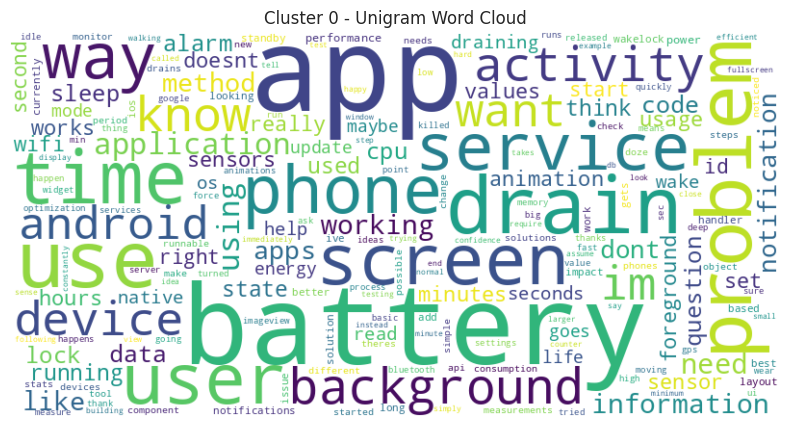

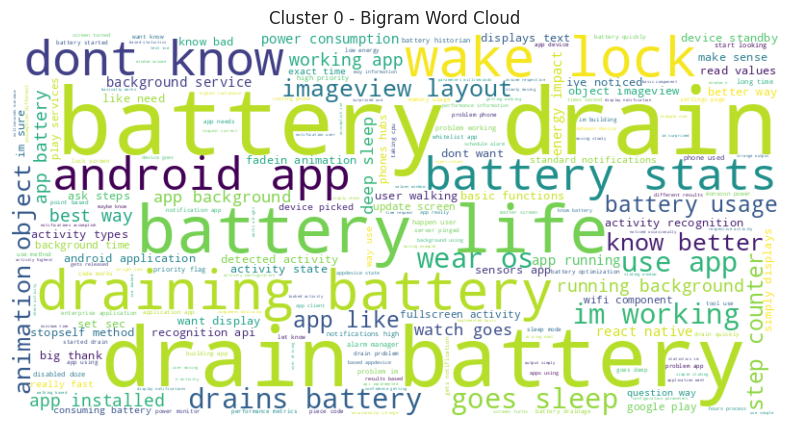

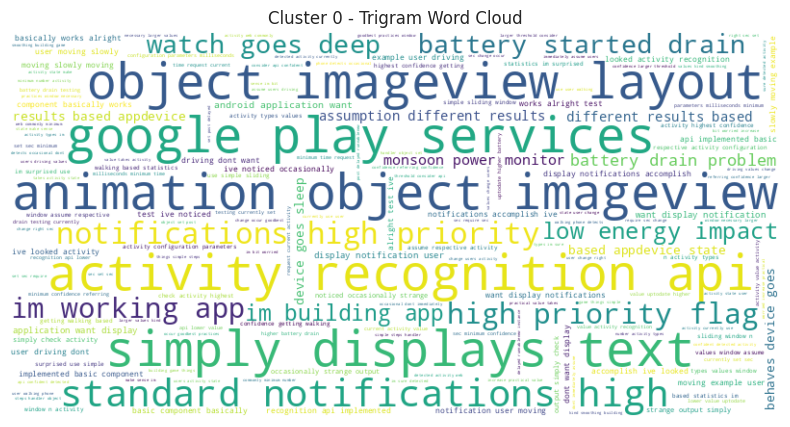

Cluster 2 - Top 10 Unigrams:
[('location', 83), ('app', 41), ('battery', 40), ('gps', 29), ('user', 19), ('updates', 19), ('background', 18), ('drain', 14), ('im', 14), ('device', 13)]

Cluster 2 - Top 10 Bigrams:
[('location updates', 9), ('battery drain', 8), ('location manager', 6), ('location servicesgps', 5), ('drain battery', 5), ('drains battery', 4), ('location update', 4), ('update location', 4), ('current location', 4), ('gps data', 3)]

Cluster 2 - Top 10 Trigrams:
[('set latlon coordinates', 3), ('documentation shows usage', 2), ('location problem device', 2), ('google play services', 2), ('location servicesgps enabled', 2), ('servicesgps enabled registering', 2), ('enabled registering updates', 2), ('significant battery drain', 2), ('users current location', 2), ('set expiration time', 2)]


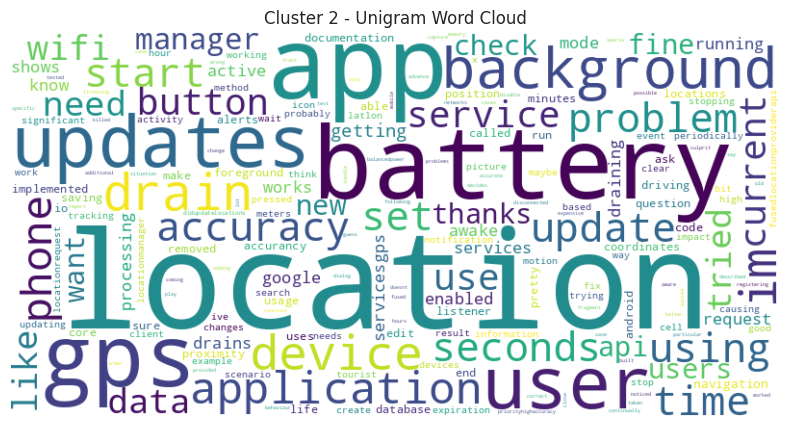

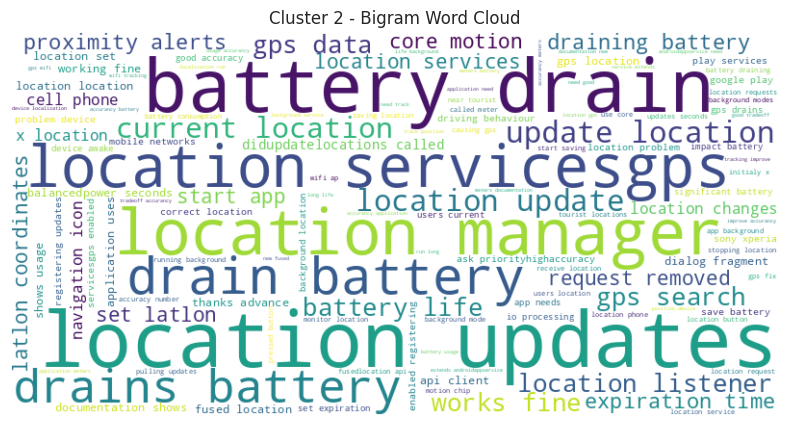

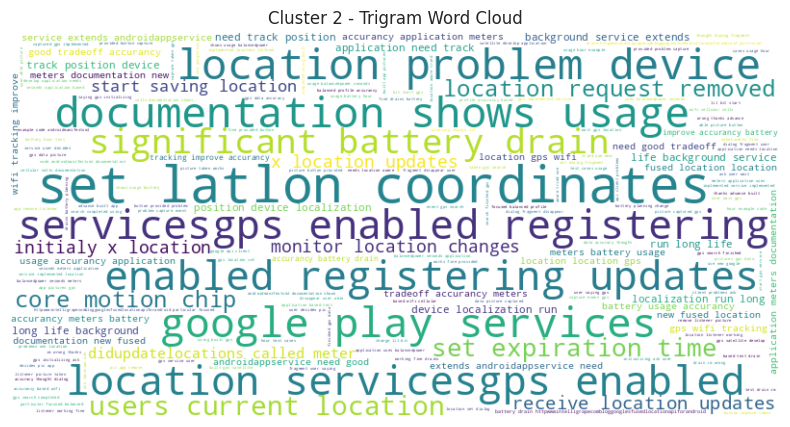

Cluster 1 - Top 10 Unigrams:
[('app', 14), ('device', 14), ('battery', 13), ('use', 12), ('data', 12), ('android', 11), ('need', 11), ('way', 10), ('server', 9), ('client', 9)]

Cluster 1 - Top 10 Bigrams:
[('drain battery', 5), ('android app', 4), ('draining battery', 4), ('usb device', 3), ('usb host', 3), ('host mode', 3), ('long polling', 3), ('im wondering', 3), ('pay load', 3), ('server client', 3)]

Cluster 1 - Top 10 Trigrams:
[('usb host mode', 3), ('using usb host', 2), ('data come anytime', 2), ('host mode api', 2), ('partial wake lock', 2), ('quite draining battery', 2), ('reduce traffic pay', 2), ('traffic pay load', 2), ('changed server client', 2), ('creating android application', 1)]


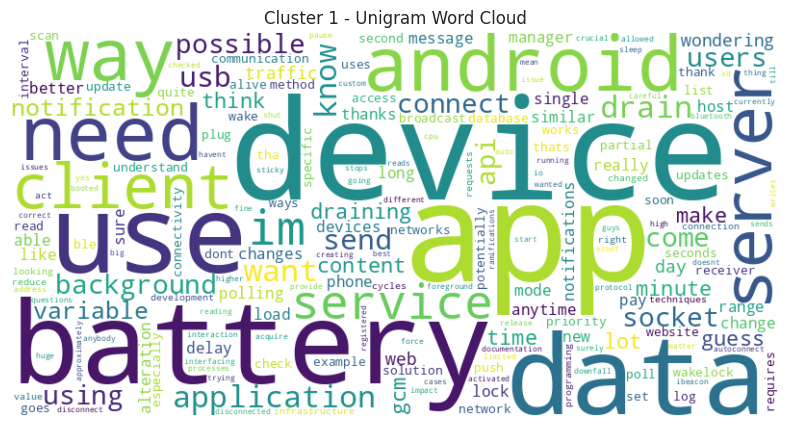

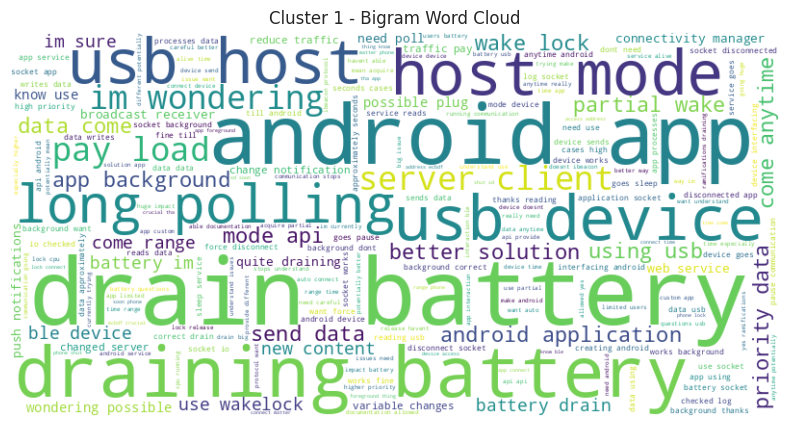

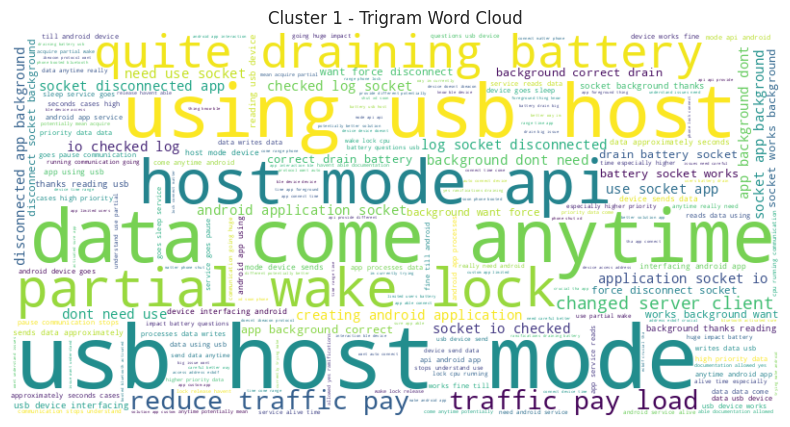

In [ ]:
clusters = Unanswered["Cluster"].unique()
for cluster in clusters:
    # **ทำความสะอาดข้อความก่อนนำไปใช้**
    text = " ".join(Unanswered[Unanswered["Cluster"] == cluster]["post_body"].apply(clean_html_and_code))

    tokens = word_tokenize(text.lower())
    filtered_tokens = [word for word in tokens if word.isalpha() and word not in stopwords]

    # สร้าง N-grams
    unigrams = list(ngrams(filtered_tokens, 1))
    bigrams = list(ngrams(filtered_tokens, 2))
    trigrams = list(ngrams(filtered_tokens, 3))

    # นับความถี่ของคำ
    unigram_freq = Counter([' '.join(gram) for gram in unigrams])
    bigram_freq = Counter([' '.join(gram) for gram in bigrams])
    trigram_freq = Counter([' '.join(gram) for gram in trigrams])

    # แสดง Top 10 คำที่พบบ่อย
    print(f"Cluster {cluster} - Top 10 Unigrams:")
    print(unigram_freq.most_common(10))
    print(f"\nCluster {cluster} - Top 10 Bigrams:")
    print(bigram_freq.most_common(10))
    print(f"\nCluster {cluster} - Top 10 Trigrams:")
    print(trigram_freq.most_common(10))

    # แสดง Word Cloud
    generate_wordcloud(unigram_freq, f'Cluster {cluster} - Unigram Word Cloud')
    generate_wordcloud(bigram_freq, f'Cluster {cluster} - Bigram Word Cloud')
    generate_wordcloud(trigram_freq, f'Cluster {cluster} - Trigram Word Cloud')

Cluster 2 - Top 10 Unigrams:
[('location', 183), ('battery', 121), ('app', 101), ('gps', 66), ('user', 59), ('drain', 55), ('background', 55), ('use', 50), ('im', 45), ('using', 44)]

Cluster 2 - Top 10 Bigrams:
[('battery drain', 29), ('drain battery', 22), ('location service', 14), ('location update', 11), ('draining battery', 10), ('significant location', 10), ('user location', 9), ('location updates', 9), ('location change', 9), ('dont want', 8)]

Cluster 2 - Top 10 Trigrams:
[('significant location change', 7), ('app running background', 5), ('google play services', 4), ('turn location service', 4), ('proximity alert location', 3), ('user using application', 3), ('time drain battery', 3), ('user location time', 3), ('use significant location', 3), ('location drain battery', 2)]


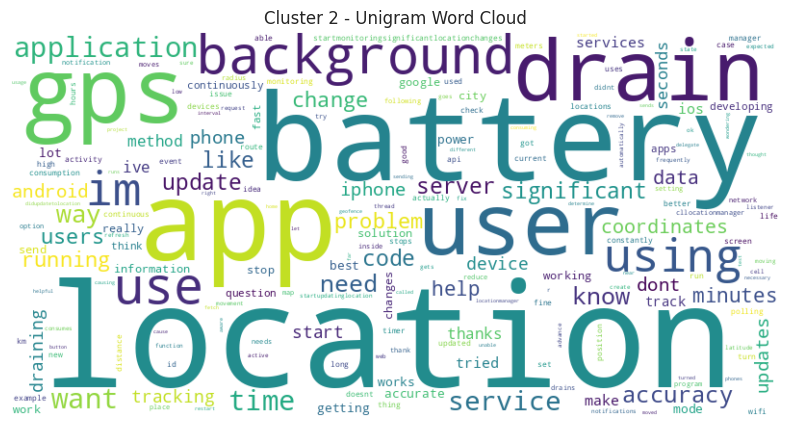

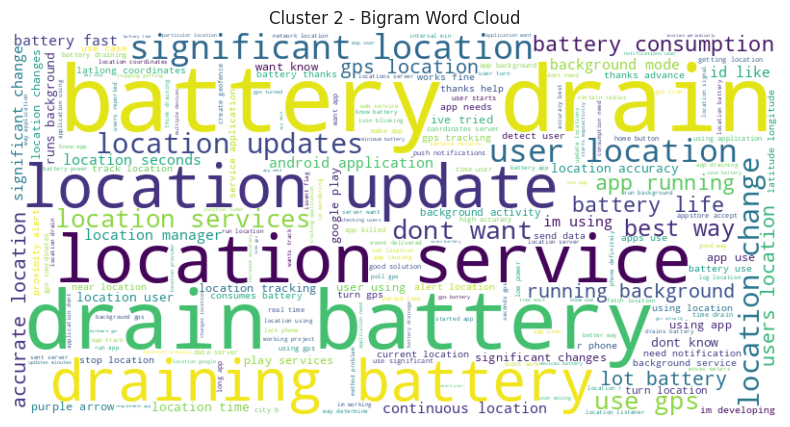

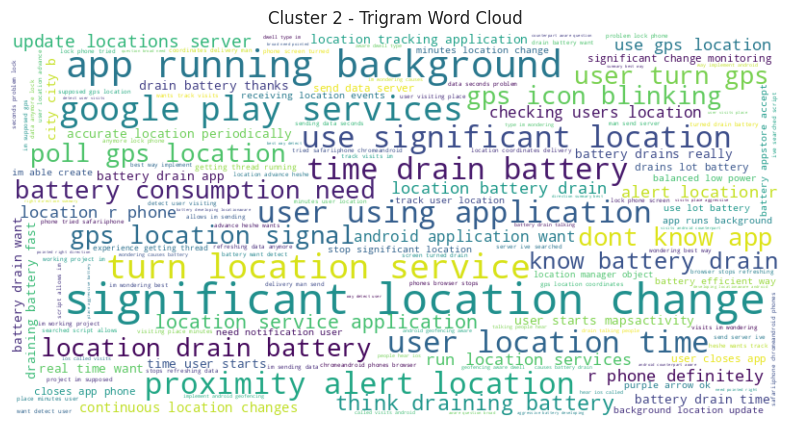

Cluster 0 - Top 10 Unigrams:
[('app', 161), ('battery', 152), ('service', 57), ('drain', 50), ('application', 48), ('screen', 47), ('running', 46), ('android', 44), ('background', 44), ('using', 42)]

Cluster 0 - Top 10 Bigrams:
[('battery drain', 27), ('drain battery', 13), ('drains battery', 12), ('battery draining', 9), ('running background', 8), ('battery life', 7), ('battery level', 6), ('draining battery', 6), ('app running', 6), ('working android', 5)]

Cluster 0 - Top 10 Trigrams:
[('battery draining fast', 2), ('im making app', 2), ('im pretty sure', 2), ('greatly appreciated thanks', 2), ('read info sensors', 2), ('possible save battery', 2), ('im writing application', 2), ('application foreground service', 2), ('android kills application', 2), ('memory usage im', 2)]


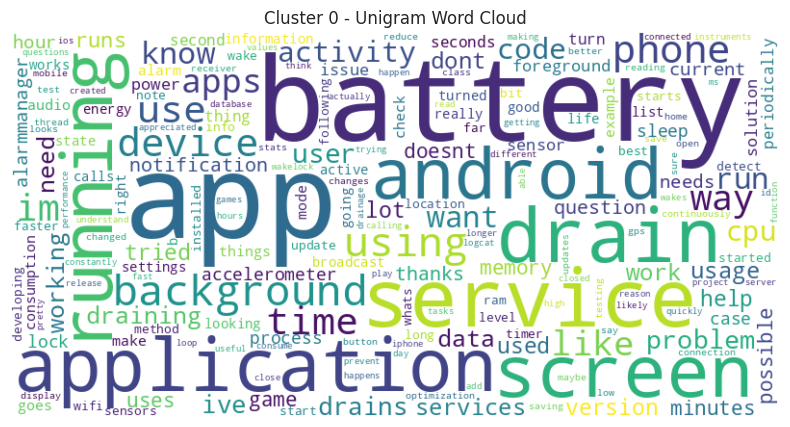

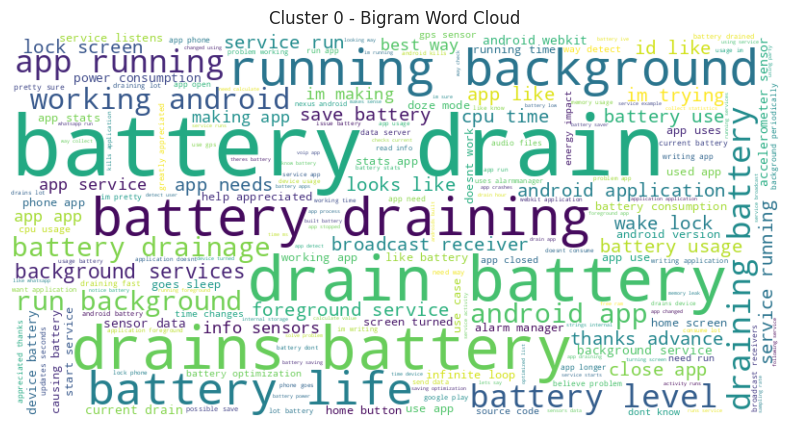

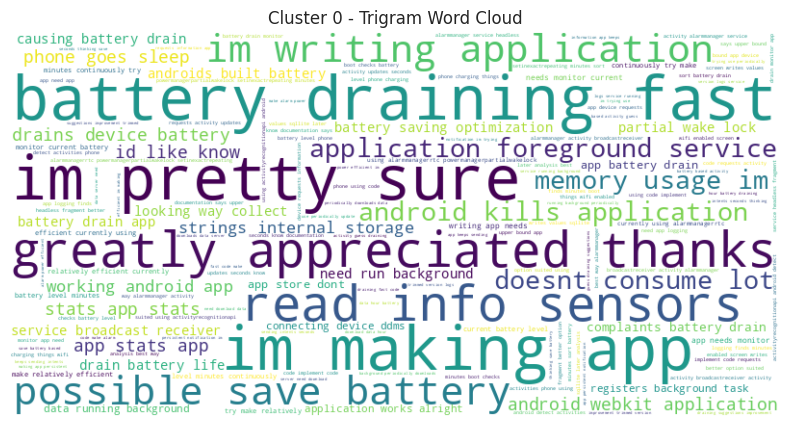

Cluster 1 - Top 10 Unigrams:
[('app', 31), ('server', 31), ('battery', 27), ('android', 24), ('service', 23), ('use', 21), ('device', 21), ('im', 20), ('data', 19), ('way', 17)]

Cluster 1 - Top 10 Bigrams:
[('drain battery', 8), ('push notifications', 5), ('battery drain', 4), ('best way', 4), ('android app', 4), ('new message', 4), ('push notification', 4), ('real time', 4), ('im trying', 3), ('send heartbeat', 3)]

Cluster 1 - Top 10 Trigrams:
[('send push notification', 2), ('use quite bit', 2), ('instead foreground service', 2), ('use alarm manager', 2), ('heart rate real', 2), ('rate real time', 2), ('real time android', 2), ('working android social', 1), ('android social app', 1), ('social app contains', 1)]


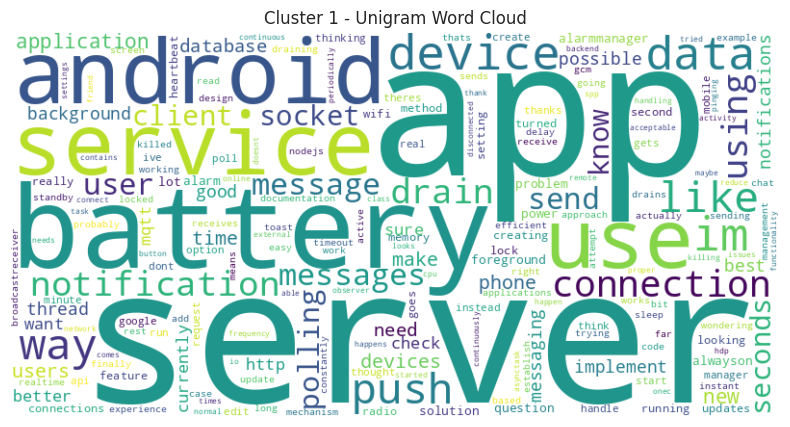

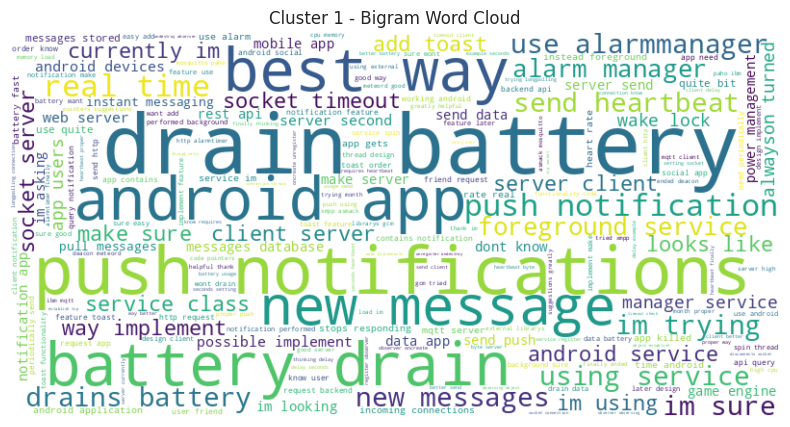

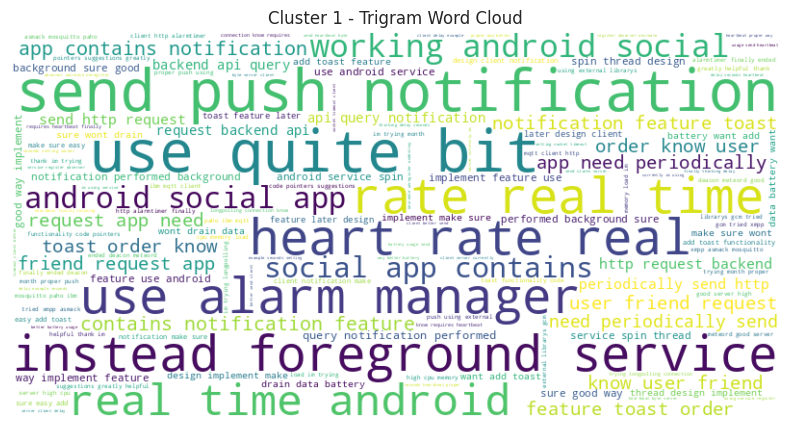

In [ ]:
clusters = Answered["Cluster"].unique()
for cluster in clusters:
    # **ทำความสะอาดข้อความก่อนนำไปใช้**
    text = " ".join(Answered[Answered["Cluster"] == cluster]["post_body"].apply(clean_html_and_code))

    tokens = word_tokenize(text.lower())
    filtered_tokens = [word for word in tokens if word.isalpha() and word not in stopwords]

    # สร้าง N-grams
    unigrams = list(ngrams(filtered_tokens, 1))
    bigrams = list(ngrams(filtered_tokens, 2))
    trigrams = list(ngrams(filtered_tokens, 3))

    # นับความถี่ของคำ
    unigram_freq = Counter([' '.join(gram) for gram in unigrams])
    bigram_freq = Counter([' '.join(gram) for gram in bigrams])
    trigram_freq = Counter([' '.join(gram) for gram in trigrams])

    # แสดง Top 10 คำที่พบบ่อย
    print(f"Cluster {cluster} - Top 10 Unigrams:")
    print(unigram_freq.most_common(10))
    print(f"\nCluster {cluster} - Top 10 Bigrams:")
    print(bigram_freq.most_common(10))
    print(f"\nCluster {cluster} - Top 10 Trigrams:")
    print(trigram_freq.most_common(10))

    # แสดง Word Cloud
    generate_wordcloud(unigram_freq, f'Cluster {cluster} - Unigram Word Cloud')
    generate_wordcloud(bigram_freq, f'Cluster {cluster} - Bigram Word Cloud')
    generate_wordcloud(trigram_freq, f'Cluster {cluster} - Trigram Word Cloud')

Cluster 0 - Top 10 Unigrams:
[('app', 105), ('battery', 105), ('service', 71), ('drain', 46), ('like', 37), ('running', 37), ('way', 35), ('time', 35), ('android', 32), ('screen', 32)]

Cluster 0 - Top 10 Bigrams:
[('battery drain', 18), ('drain battery', 16), ('dont know', 8), ('broadcast receiver', 8), ('wake lock', 8), ('thanks advance', 7), ('battery life', 7), ('draining battery', 6), ('best way', 6), ('app running', 6)]

Cluster 0 - Top 10 Trigrams:
[('drain lot battery', 3), ('goes deep sleep', 3), ('deep sleep mode', 3), ('app running left', 3), ('battery drain cpu', 2), ('thread infinite loop', 2), ('im developing application', 2), ('cause battery drain', 2), ('think correct way', 2), ('running left app', 2)]


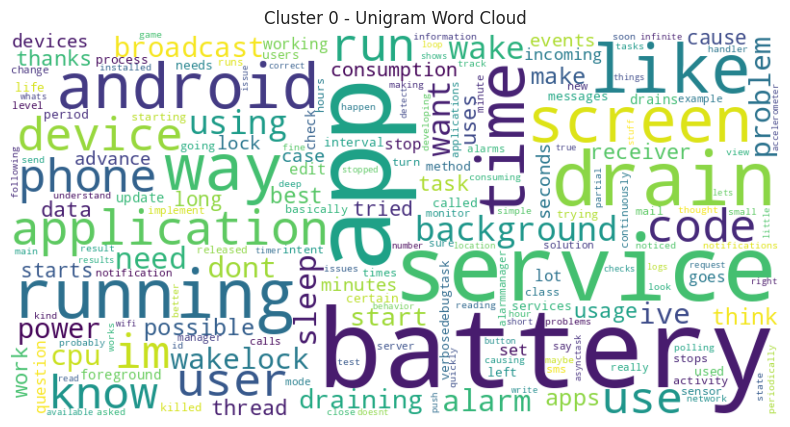

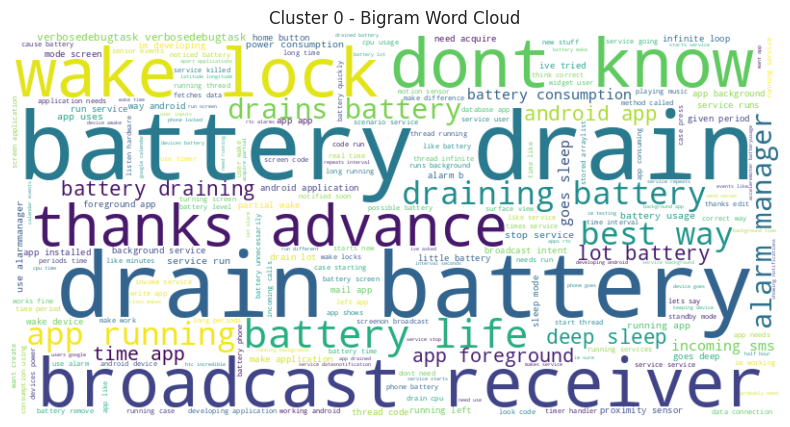

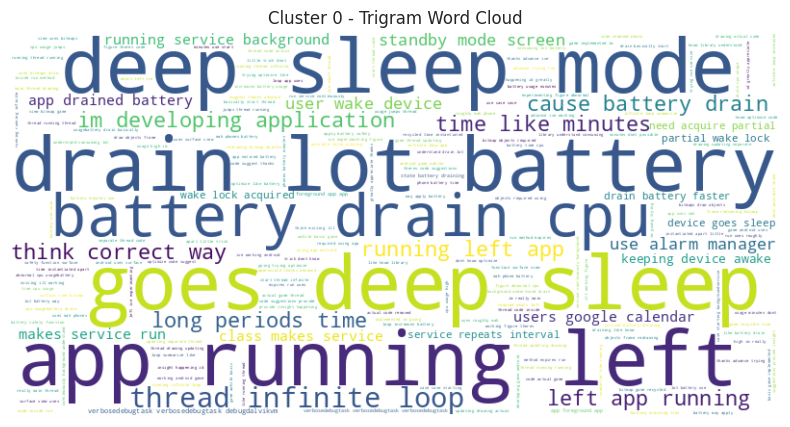

Cluster 2 - Top 10 Unigrams:
[('location', 190), ('battery', 102), ('app', 98), ('gps', 71), ('drain', 67), ('background', 61), ('user', 48), ('im', 44), ('time', 41), ('using', 35)]

Cluster 2 - Top 10 Bigrams:
[('battery drain', 25), ('location updates', 21), ('significant location', 19), ('users location', 12), ('drain battery', 11), ('user location', 11), ('current location', 10), ('location monitoring', 10), ('location change', 9), ('location service', 9)]

Cluster 2 - Top 10 Trigrams:
[('significant location monitoring', 10), ('significant location change', 8), ('receive location updates', 4), ('fused location provider', 3), ('google play services', 3), ('standard location service', 3), ('stop app receiving', 2), ('looks like issue', 2), ('users location background', 2), ('background specific time', 2)]


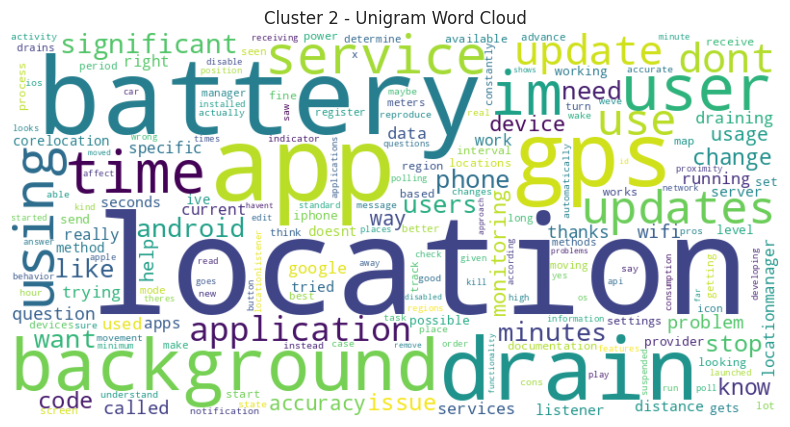

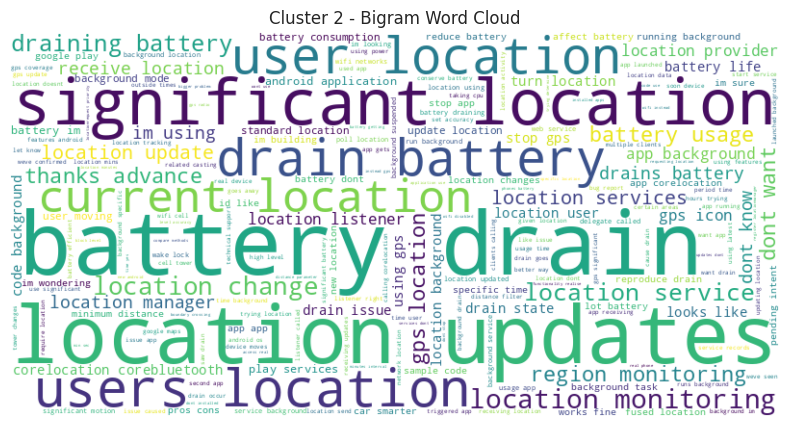

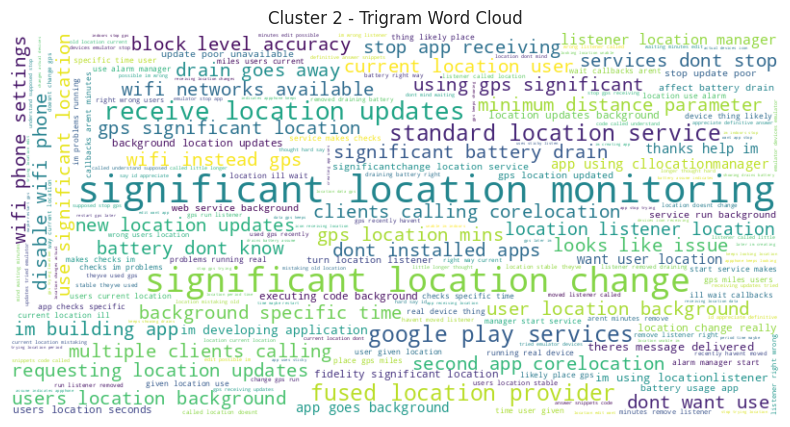

Cluster 1 - Top 10 Unigrams:
[('server', 43), ('app', 36), ('connection', 34), ('battery', 33), ('device', 31), ('data', 27), ('time', 27), ('android', 24), ('im', 22), ('send', 21)]

Cluster 1 - Top 10 Bigrams:
[('drain battery', 11), ('battery drain', 5), ('send data', 5), ('chat room', 5), ('building android', 4), ('data server', 4), ('app background', 4), ('remote notifications', 4), ('new message', 3), ('need know', 3)]

Cluster 1 - Top 10 Trigrams:
[('send data server', 2), ('send send receive', 2), ('device im trying', 2), ('listening incoming connections', 2), ('im sure best', 2), ('light weight connection', 2), ('configuration activity set', 2), ('use websockets necessary', 2), ('opening closing connection', 2), ('problem battery drain', 2)]


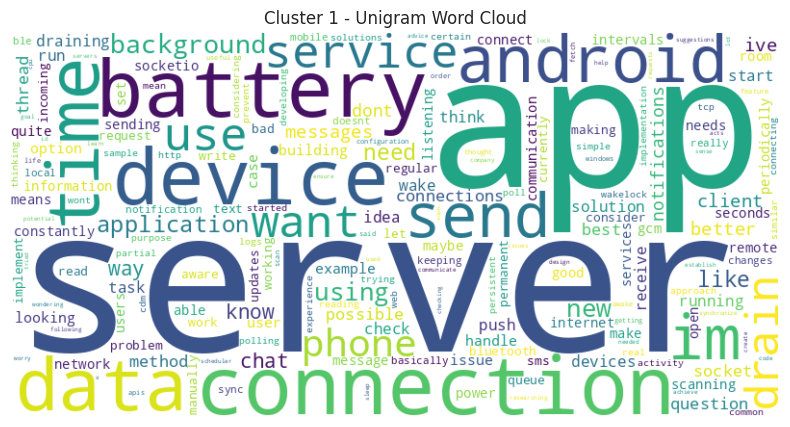

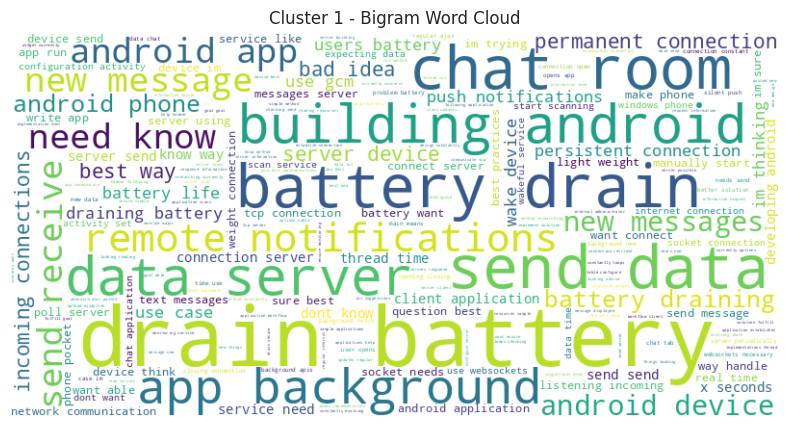

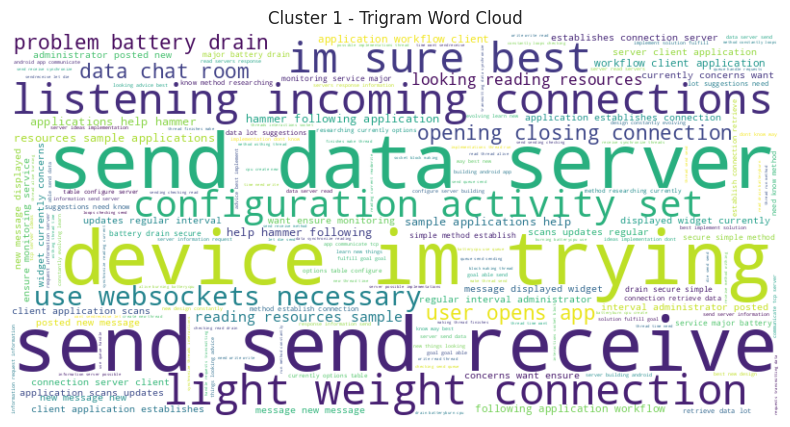

In [ ]:
clusters = Accepted_Answer["Cluster"].unique()
for cluster in clusters:
    # **ทำความสะอาดข้อความก่อนนำไปใช้**
    text = " ".join(Accepted_Answer[Accepted_Answer["Cluster"] == cluster]["post_body"].apply(clean_html_and_code))

    tokens = word_tokenize(text.lower())
    filtered_tokens = [word for word in tokens if word.isalpha() and word not in stopwords]

    # สร้าง N-grams
    unigrams = list(ngrams(filtered_tokens, 1))
    bigrams = list(ngrams(filtered_tokens, 2))
    trigrams = list(ngrams(filtered_tokens, 3))

    # นับความถี่ของคำ
    unigram_freq = Counter([' '.join(gram) for gram in unigrams])
    bigram_freq = Counter([' '.join(gram) for gram in bigrams])
    trigram_freq = Counter([' '.join(gram) for gram in trigrams])

    # แสดง Top 10 คำที่พบบ่อย
    print(f"Cluster {cluster} - Top 10 Unigrams:")
    print(unigram_freq.most_common(10))
    print(f"\nCluster {cluster} - Top 10 Bigrams:")
    print(bigram_freq.most_common(10))
    print(f"\nCluster {cluster} - Top 10 Trigrams:")
    print(trigram_freq.most_common(10))

    # แสดง Word Cloud
    generate_wordcloud(unigram_freq, f'Cluster {cluster} - Unigram Word Cloud')
    generate_wordcloud(bigram_freq, f'Cluster {cluster} - Bigram Word Cloud')
    generate_wordcloud(trigram_freq, f'Cluster {cluster} - Trigram Word Cloud')